# Setup

In [1]:
import numpy as np
import pandas as pd
import json

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import neurokit2 as nk
import heartpy as hp
from scipy.signal import butter, filtfilt

# General

In [3]:
weee_dataset_path = 'data/WEEE Dataset'
subject_ids = [f'P{str(i).zfill(2)}' for i in range(1, 18)]

In [4]:
study_info_df = pd.read_csv(f'{weee_dataset_path}/Study_Information.csv')
study_info_df

,Participant,Start_Sit,Start_Stand,Start_Cycle1,Start_Cycle2,Start_Run1,Start_Run2,Cycle_Speed1,Cycle_Speed2,Run_Speed1,Run_Speed2,Comments,MET_Sit,MET_Stand,MET_Cycle1,MET_Cycle2,MET_Run1,MET_Run2
0,P01,2021-12-03 16:58:50,2021-12-03 17:03:00,2021-12-03 17:08:00,2021-12-03 17:13:00,2021-12-03 17:18:00,2021-12-03 17:23:00,14,20,4.0,6.0,,1,1.2,10,16,4.5,10.0
1,P02,2021-11-25 17:17:00,2021-11-25 17:23:00,2021-11-25 17:36:10,2021-11-25 17:41:50,2021-11-25 17:46:50,2021-11-25 17:51:00,14,19,5.0,8.5,Muse headband data lost due to connectivity is...,1,1.2,10,12,8.0,14.0
2,P03,2021-11-26 16:20:20,2021-11-26 16:26:20,2021-11-26 16:53:06,2021-11-26 16:56:18,2021-11-26 17:00:13,2021-11-26 17:04:05,18,22,6.0,7.0,Second part V02 data got losT,1,1.2,12,16,10.0,11.5
3,P04,2021-11-26 18:15:48,2021-11-26 18:21:56,2021-11-26 18:27:00,2021-11-26 18:32:20,2021-11-26 18:37:10,2021-11-26 18:45:00,15,22,6.0,9.0,Interruption at 18:41,1,1.2,10,16,10.0,15.0
4,P05,2021-11-29 09:40:47,2021-11-29 09:45:40,2021-11-29 09:51:41,2021-11-29 09:56:41,2021-11-29 10:02:10,2021-11-29 10:06:40,15,22,5.0,7.0,,1,1.2,10,16,8.0,11.5
5,P06,2021-11-29 10:37:54,2021-11-29 10:43:00,2021-11-29 10:49:20,2021-11-29 10:54:35,2021-11-29 11:00:00,2021-11-29 11:06:00,14,20,5.0,7.0,VO2 data was lost (?),1,1.2,10,16,8.0,11.5
6,P07,2021-11-29 15:33:02,2021-11-29 15:38:15,2021-11-29 15:45:25,2021-11-29 15:50:00,2021-11-29 15:57:00,2021-11-29 16:02:00,16,23,5.5,8.0,Low quality HR during running,1,1.2,12,16,9.0,13.5
7,P08,2021-11-29 18:00:31,2021-11-29 18:05:30,2021-11-29 18:11:00,2021-11-29 18:16:00,2021-11-29 18:21:00,2021-11-29 18:26:00,9,18,5.0,9.0,,1,1.2,4,12,8.0,15.0
8,P09,2021-11-30 09:19:12,2021-11-30 09:24:20,2021-11-30 09:30:30,2021-11-30 09:36:00,2021-11-30 09:41:20,2021-11-30 09:46:20,14,30,6.4,9.0,,1,1.2,10,16,11.0,15.0
9,P10,2021-11-30 10:32:45,2021-11-30 10:37:40,2021-11-30 11:45:00,2021-11-30 11:50:20,2021-11-30 11:55:30,2021-11-30 12:01:00,20,24,5.0,6.5,Sleepiness level 2 if 4 is very sleepy,1,1.2,16,16,8.0,11.0


In [5]:
with pd.option_context('display.max_colwidth', None):
    display(study_info_df[['Participant', 'Comments']])

,Participant,Comments
0,P01,
1,P02,Muse headband data lost due to connectivity issues-Double check body composition metrics
2,P03,Second part V02 data got losT
3,P04,Interruption at 18:41
4,P05,
5,P06,VO2 data was lost (?)
6,P07,Low quality HR during running
7,P08,
8,P09,
9,P10,Sleepiness level 2 if 4 is very sleepy


In [5]:
demographics_df = pd.read_csv(f'{weee_dataset_path}/Demographics.csv')
demographics_df

,Participant,BMI,Fat,Muscle,Water,Bone,Weight,Height,Gender,Age,Comments
0,P01,24.7,33,14,49,4,70.6,166,F,29,NaN
1,P02,25.7,20,15,54,4,77.0,173,M,26,NaN
2,P03,20.6,23,16,57,5,61.0,172,F,26,NaN
3,P04,26.6,17,15,53,4,81.5,175,M,27,NaN
4,P05,24.8,31,14,48,4,66.0,163,F,33,NaN
5,P06,30.8,32,14,50,4,99.7,180,M,40,NaN
6,P07,25.8,18,14,50,4,71.0,166,M,34,NaN
7,P08,26.4,22,14,48,4,85.6,180,M,33,NaN
8,P09,26.4,19,14,49,4,76.0,177,M,27,NaN
9,P10,27.8,24,14,51,4,87.0,177,M,41,NaN


# E4 Wrist

## ACC

### Methods

In [6]:
test_subject_id = 'P01'

test_acc_df = pd.read_csv(f'{weee_dataset_path}/{test_subject_id}/E4/ACC.csv', header=None)
test_acc_df
initial_time = test_acc_df.iloc[0, 0]
sample_rate = test_acc_df.iloc[1, 0]
data = test_acc_df.iloc[2:].reset_index(drop=True)
data.columns = ['X', 'Y', 'Z']
data['Time'] = initial_time + (data.index / sample_rate)
data['Time'] = pd.to_datetime(data['Time'], unit='s')
data

,X,Y,Z,Time
0,20.0,0.0,60.0,2021-12-03 16:57:44.000000
1,19.0,0.0,59.0,2021-12-03 16:57:44.031250
2,19.0,1.0,61.0,2021-12-03 16:57:44.062500
3,20.0,1.0,60.0,2021-12-03 16:57:44.093750
4,20.0,0.0,60.0,2021-12-03 16:57:44.125000
...,...,...,...,...
73225,43.0,40.0,25.0,2021-12-03 17:35:52.281250
73226,43.0,41.0,23.0,2021-12-03 17:35:52.312500
73227,43.0,40.0,25.0,2021-12-03 17:35:52.343750
73228,43.0,41.0,23.0,2021-12-03 17:35:52.375000


In [7]:
def load_acc_csv(path):
    df = pd.read_csv(path, header=None)
    initial_time = df.iloc[0, 0]
    sample_rate = df.iloc[1, 0]
    data = df.iloc[2:].reset_index(drop=True)
    data.columns = ['X', 'Y', 'Z']
    data['Time'] = initial_time + (data.index / sample_rate)
    data['Time'] = pd.to_datetime(data['Time'], unit='s')
    return data

In [8]:
test_acc_path = f'{weee_dataset_path}/{test_subject_id}/E4/ACC.csv'
test_acc_df = load_acc_csv(test_acc_path)
test_acc_df

,X,Y,Z,Time
0,20.0,0.0,60.0,2021-12-03 16:57:44.000000
1,19.0,0.0,59.0,2021-12-03 16:57:44.031250
2,19.0,1.0,61.0,2021-12-03 16:57:44.062500
3,20.0,1.0,60.0,2021-12-03 16:57:44.093750
4,20.0,0.0,60.0,2021-12-03 16:57:44.125000
...,...,...,...,...
73225,43.0,40.0,25.0,2021-12-03 17:35:52.281250
73226,43.0,41.0,23.0,2021-12-03 17:35:52.312500
73227,43.0,40.0,25.0,2021-12-03 17:35:52.343750
73228,43.0,41.0,23.0,2021-12-03 17:35:52.375000


In [9]:
test_acc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73230 entries, 0 to 73229
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   X       73230 non-null  float64       
 1   Y       73230 non-null  float64       
 2   Z       73230 non-null  float64       
 3   Time    73230 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(3)
memory usage: 2.2 MB


In [10]:
def describe_df(df):
    display(df.describe())
    print(f'Duration: {df["Time"].iloc[-1] - df["Time"].iloc[0]}')

In [11]:
def plot_accelerometer_data(df, subject_id=1):
    plt.figure(figsize=(14, 7))
    plt.plot(df['Time'], df['X'], label='X')
    plt.plot(df['Time'], df['Y'], label='Y')
    plt.plot(df['Time'], df['Z'], label='Z')
    plt.xlabel('Time')
    plt.ylabel('Acceleration')
    plt.title(f'Time Series of Accelerometer Data Subject {subject_id}')
    plt.legend()
    plt.show()

    describe_df(df)

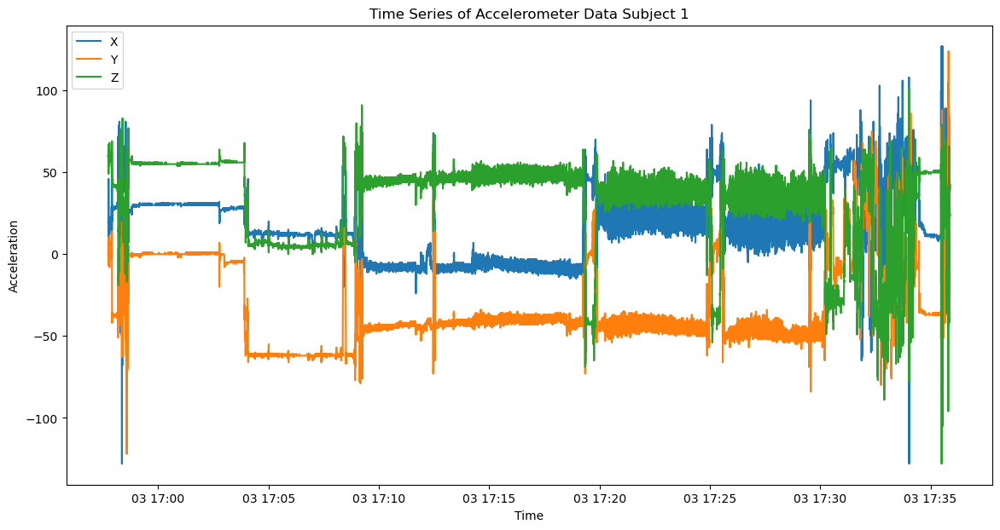

,X,Y,Z,Time
count,73230.000000,73230.000000,73230.000000,73230
mean,16.571542,-31.385457,32.506104,2021-12-03 17:16:48.203125248
min,-128.000000,-122.000000,-128.000000,2021-12-03 16:57:44
25%,-4.000000,-47.000000,26.250000,2021-12-03 17:07:16.101562624
50%,16.000000,-42.000000,42.000000,2021-12-03 17:16:48.203124992
75%,30.000000,-6.000000,49.000000,2021-12-03 17:26:20.304687360
max,127.000000,124.000000,101.000000,2021-12-03 17:35:52.406250
std,19.709633,26.043514,24.959029,NaN


Duration: 0 days 00:38:08.406250


In [13]:
plot_accelerometer_data(test_acc_df)

### Plot ACCs

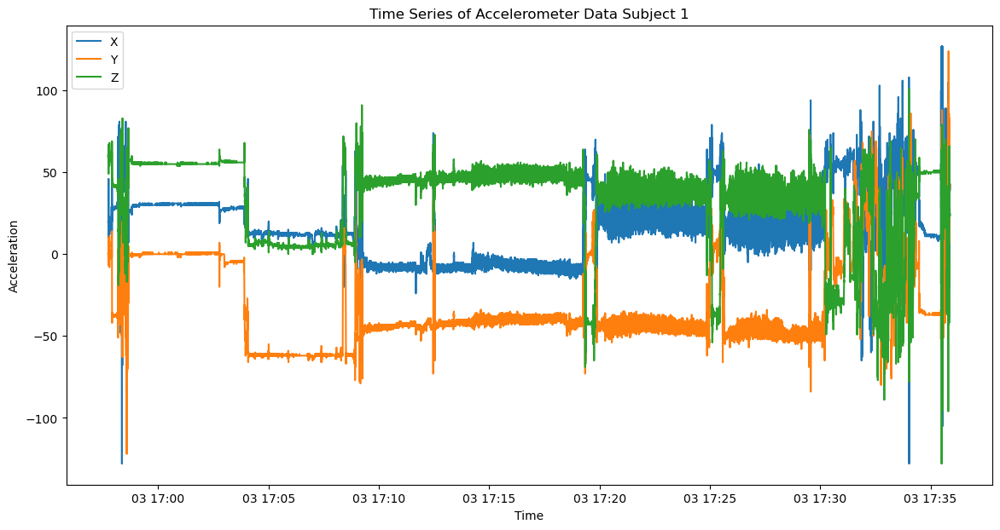

,X,Y,Z,Time
count,73230.000000,73230.000000,73230.000000,73230
mean,16.571542,-31.385457,32.506104,2021-12-03 17:16:48.203125248
min,-128.000000,-122.000000,-128.000000,2021-12-03 16:57:44
25%,-4.000000,-47.000000,26.250000,2021-12-03 17:07:16.101562624
50%,16.000000,-42.000000,42.000000,2021-12-03 17:16:48.203124992
75%,30.000000,-6.000000,49.000000,2021-12-03 17:26:20.304687360
max,127.000000,124.000000,101.000000,2021-12-03 17:35:52.406250
std,19.709633,26.043514,24.959029,NaN


Duration: 0 days 00:38:08.406250


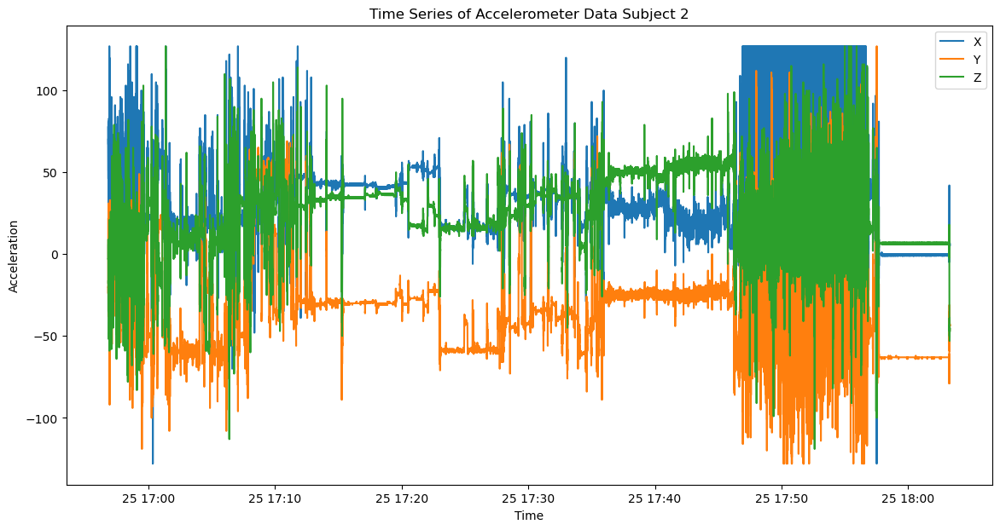

,X,Y,Z,Time
count,127638.000000,127638.000000,127638.000000,127638
mean,32.911790,-29.260071,23.917156,2021-11-25 17:30:03.328124928
min,-128.000000,-128.000000,-119.000000,2021-11-25 16:56:49
25%,17.000000,-54.000000,7.000000,2021-11-25 17:13:26.164062720
50%,31.000000,-30.000000,26.000000,2021-11-25 17:30:03.328124928
75%,43.000000,-23.000000,37.000000,2021-11-25 17:46:40.492187392
max,127.000000,127.000000,127.000000,2021-11-25 18:03:17.656250
std,27.037958,29.265947,21.775750,NaN


Duration: 0 days 01:06:28.656250


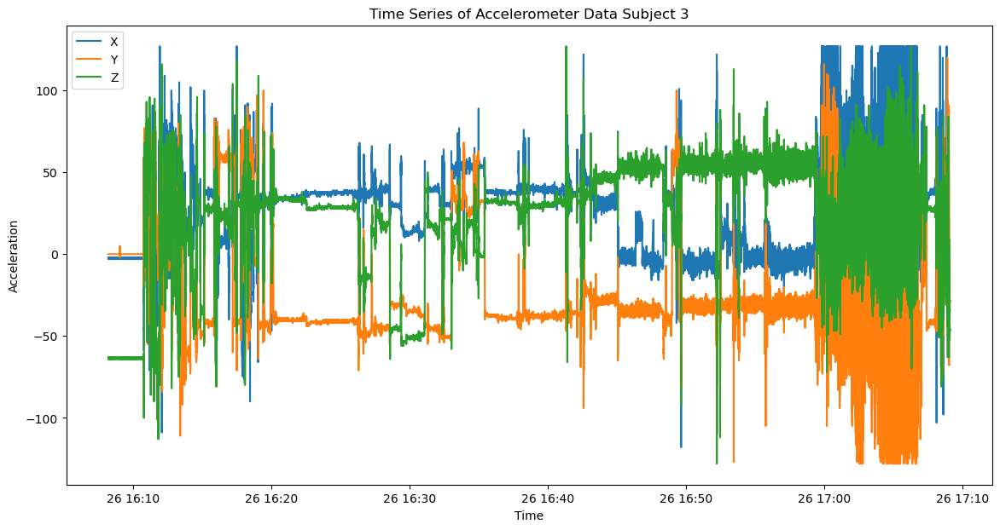

,X,Y,Z,Time
count,116886.000000,116886.000000,116886.000000,116886
mean,26.516683,-24.157290,22.396677,2021-11-26 16:38:39.328124672
min,-118.000000,-128.000000,-128.000000,2021-11-26 16:08:13
25%,4.000000,-40.000000,15.000000,2021-11-26 16:23:26.164062720
50%,33.000000,-34.000000,30.000000,2021-11-26 16:38:39.328124928
75%,39.000000,-18.000000,47.000000,2021-11-26 16:53:52.492187392
max,127.000000,120.000000,127.000000,2021-11-26 17:09:05.656250
std,24.659314,29.092026,32.530677,NaN


Duration: 0 days 01:00:52.656250


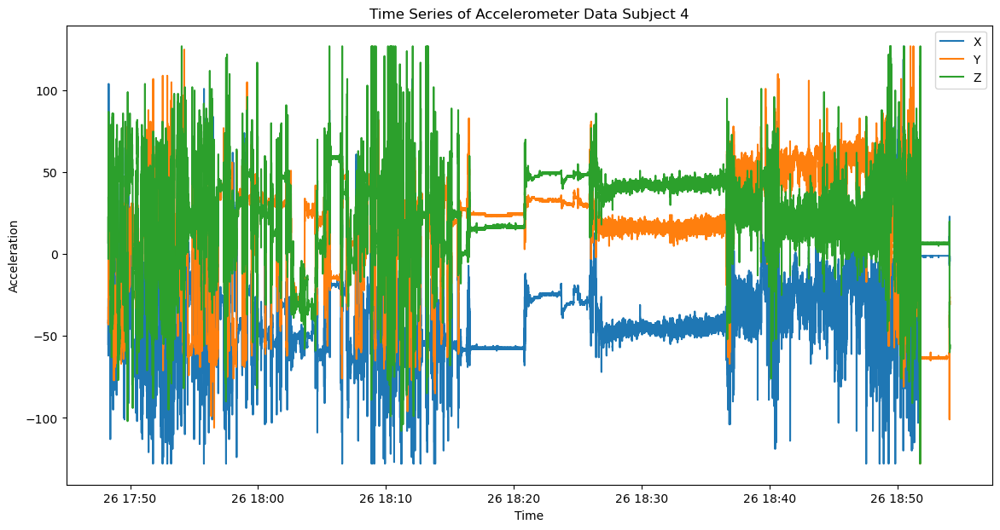

,X,Y,Z,Time
count,126390.000000,126390.000000,126390.000000,126390
mean,-36.214914,17.700237,25.109036,2021-11-26 18:21:11.828125184
min,-128.000000,-128.000000,-128.000000,2021-11-26 17:48:17
25%,-51.000000,13.000000,14.000000,2021-11-26 18:04:44.414062592
50%,-40.000000,24.000000,27.000000,2021-11-26 18:21:11.828124928
75%,-24.000000,35.000000,43.000000,2021-11-26 18:37:39.242187264
max,127.000000,127.000000,127.000000,2021-11-26 18:54:06.656250
std,21.300787,31.367015,23.507228,NaN


Duration: 0 days 01:05:49.656250


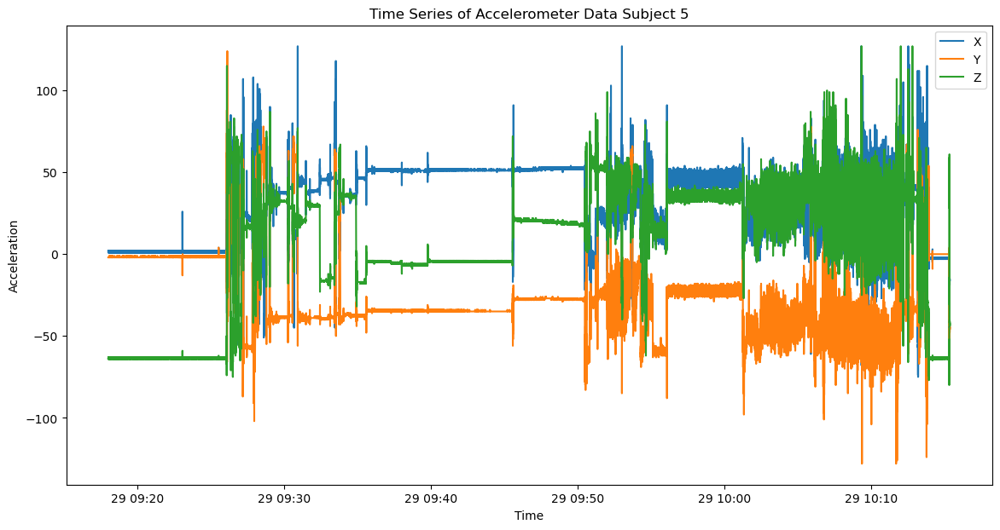

,X,Y,Z,Time
count,110070.000000,110070.000000,110070.000000,110070
mean,31.505624,-25.992923,6.226074,2021-11-29 09:46:40.828125184
min,-75.000000,-128.000000,-80.000000,2021-11-29 09:18:01
25%,15.000000,-39.000000,-5.000000,2021-11-29 09:32:20.914062592
50%,38.000000,-34.000000,19.000000,2021-11-29 09:46:40.828124928
75%,51.000000,-19.000000,34.000000,2021-11-29 10:01:00.742187520
max,127.000000,124.000000,127.000000,2021-11-29 10:15:20.656250
std,20.826172,22.458980,36.836491,NaN


Duration: 0 days 00:57:19.656250


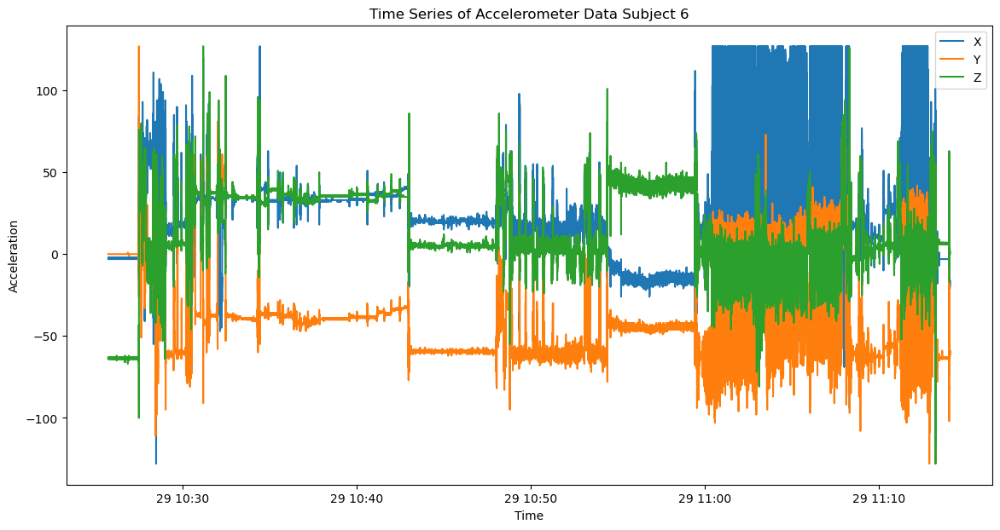

,X,Y,Z,Time
count,92814.000000,92814.000000,92814.000000,92814
mean,26.450751,-38.127222,13.762644,2021-11-29 10:49:53.203124480
min,-128.000000,-128.000000,-128.000000,2021-11-29 10:25:43
25%,13.000000,-59.000000,1.000000,2021-11-29 10:37:48.101562624
50%,22.000000,-42.000000,6.000000,2021-11-29 10:49:53.203124992
75%,35.000000,-33.000000,36.000000,2021-11-29 11:01:58.304687360
max,127.000000,127.000000,127.000000,2021-11-29 11:14:03.406250
std,28.781404,25.281603,25.023679,NaN


Duration: 0 days 00:48:20.406250


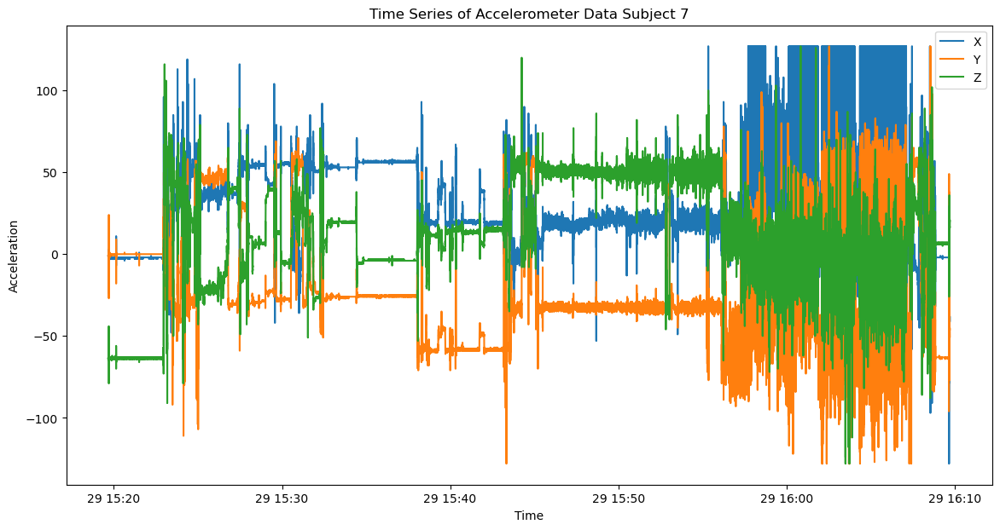

,X,Y,Z,Time
count,96084.000000,96084.000000,96084.000000,96084
mean,31.998064,-21.357052,11.893094,2021-11-29 15:44:41.296875264
min,-128.000000,-128.000000,-128.000000,2021-11-29 15:19:40
25%,17.000000,-35.000000,-4.000000,2021-11-29 15:32:10.648437504
50%,23.000000,-30.000000,12.000000,2021-11-29 15:44:41.296875008
75%,53.000000,-4.000000,42.000000,2021-11-29 15:57:11.945312512
max,127.000000,127.000000,127.000000,2021-11-29 16:09:42.593750
std,29.831662,32.793814,31.708010,NaN


Duration: 0 days 00:50:02.593750


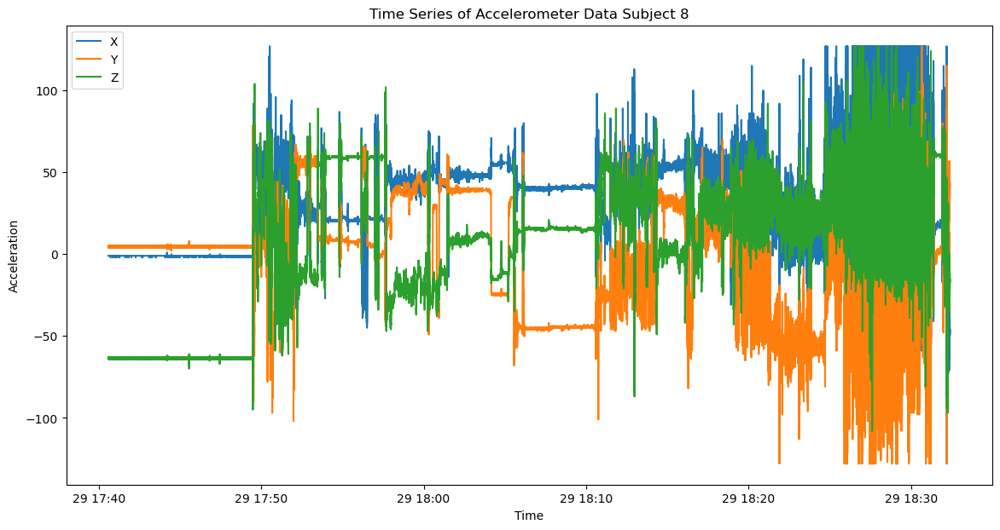

,X,Y,Z,Time
count,99450.000000,99450.000000,99450.000000,99450
mean,32.698552,-1.823851,4.083338,2021-11-29 18:06:28.890624512
min,-128.000000,-128.000000,-108.000000,2021-11-29 17:40:35
25%,13.000000,-33.000000,-17.000000,2021-11-29 17:53:31.945312512
50%,39.000000,5.000000,13.000000,2021-11-29 18:06:28.890625024
75%,48.000000,26.000000,31.000000,2021-11-29 18:19:25.835937280
max,127.000000,127.000000,127.000000,2021-11-29 18:32:22.781250
std,27.076875,34.109494,38.619437,NaN


Duration: 0 days 00:51:47.781250


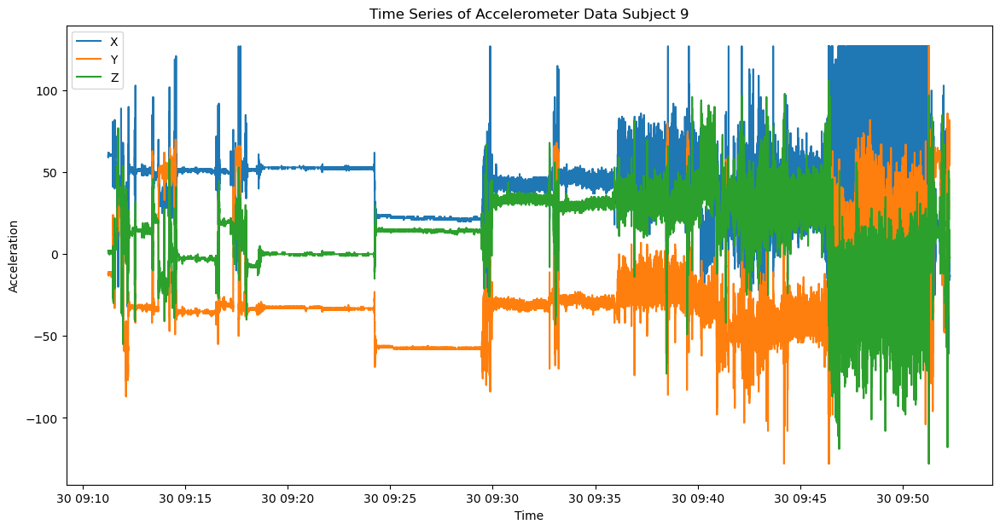

,X,Y,Z,Time
count,78810.000000,78810.000000,78810.000000,78810
mean,41.361845,-26.364738,13.901320,2021-11-30 09:31:46.390624768
min,-128.000000,-128.000000,-128.000000,2021-11-30 09:11:15
25%,23.000000,-38.000000,0.000000,2021-11-30 09:21:30.695312640
50%,44.000000,-32.000000,14.000000,2021-11-30 09:31:46.390625024
75%,52.000000,-24.000000,31.000000,2021-11-30 09:42:02.085937408
max,127.000000,127.000000,106.000000,2021-11-30 09:52:17.781250
std,21.902274,27.233678,21.098077,NaN


Duration: 0 days 00:41:02.781250


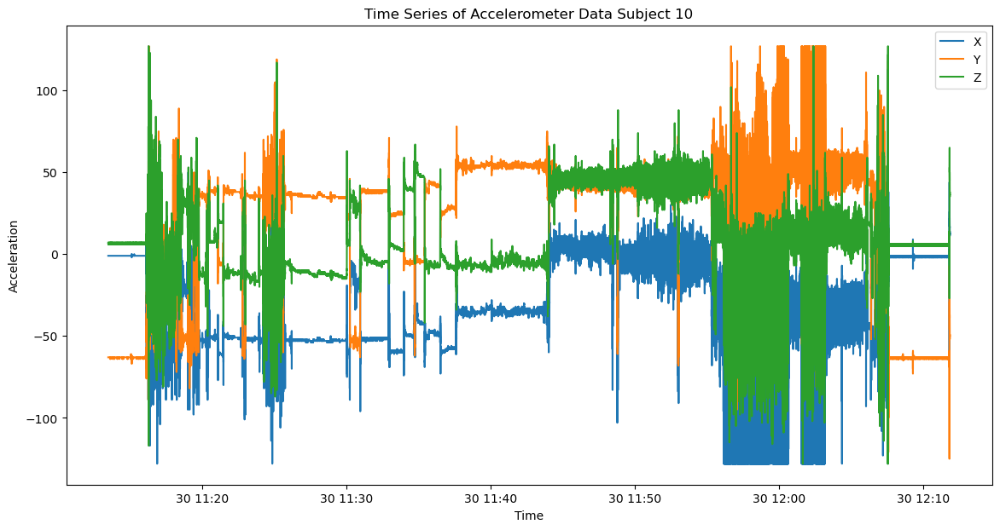

,X,Y,Z,Time
count,112122.000000,112122.000000,112122.000000,112122
mean,-31.462657,20.646617,8.049179,2021-11-30 11:42:39.890625280
min,-128.000000,-125.000000,-128.000000,2021-11-30 11:13:28
25%,-52.000000,-3.000000,-8.000000,2021-11-30 11:28:03.945312512
50%,-35.000000,38.000000,5.000000,2021-11-30 11:42:39.890625024
75%,-2.000000,47.000000,29.000000,2021-11-30 11:57:15.835937280
max,127.000000,127.000000,127.000000,2021-11-30 12:11:51.781250
std,28.636662,40.731110,25.781015,NaN


Duration: 0 days 00:58:23.781250


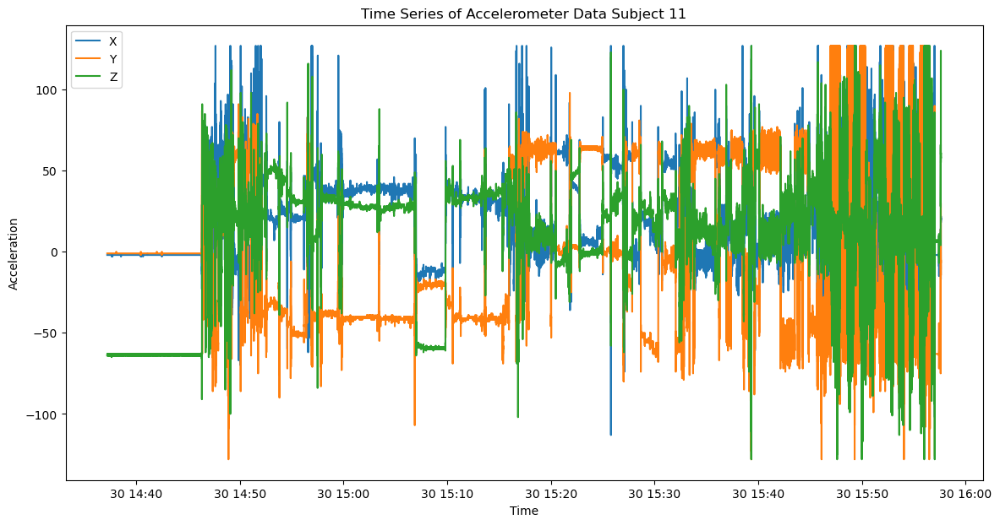

,X,Y,Z,Time
count,154368.000000,154368.000000,154368.000000,154368
mean,20.600228,-3.174350,8.539211,2021-11-30 15:17:24.984375040
min,-113.000000,-128.000000,-128.000000,2021-11-30 14:37:13
25%,-2.000000,-41.000000,-1.000000,2021-11-30 14:57:18.992187392
50%,20.000000,-7.000000,20.000000,2021-11-30 15:17:24.984375040
75%,38.000000,38.000000,32.000000,2021-11-30 15:37:30.976562688
max,127.000000,127.000000,127.000000,2021-11-30 15:57:36.968750
std,23.131760,44.084143,35.947099,NaN


Duration: 0 days 01:20:23.968750


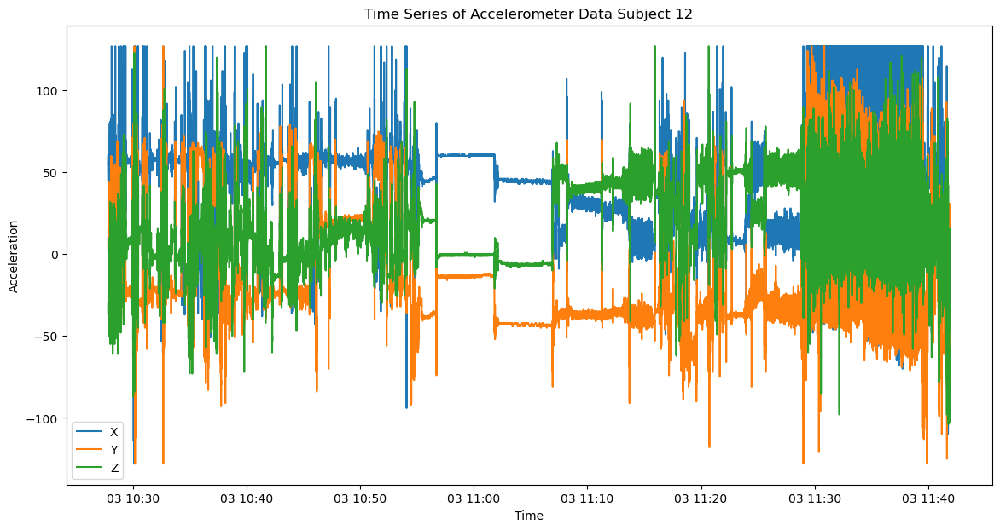

,X,Y,Z,Time
count,142254.000000,142254.000000,142254.000000,142254
mean,40.066712,-11.097509,16.327407,2021-12-03 11:04:51.703124480
min,-128.000000,-128.000000,-104.000000,2021-12-03 10:27:49
25%,19.000000,-37.000000,-1.000000,2021-12-03 10:46:20.351562496
50%,45.000000,-23.000000,13.000000,2021-12-03 11:04:51.703124992
75%,57.000000,18.000000,37.000000,2021-12-03 11:23:23.054687488
max,127.000000,127.000000,127.000000,2021-12-03 11:41:54.406250
std,29.327439,34.372591,22.234721,NaN


Duration: 0 days 01:14:05.406250


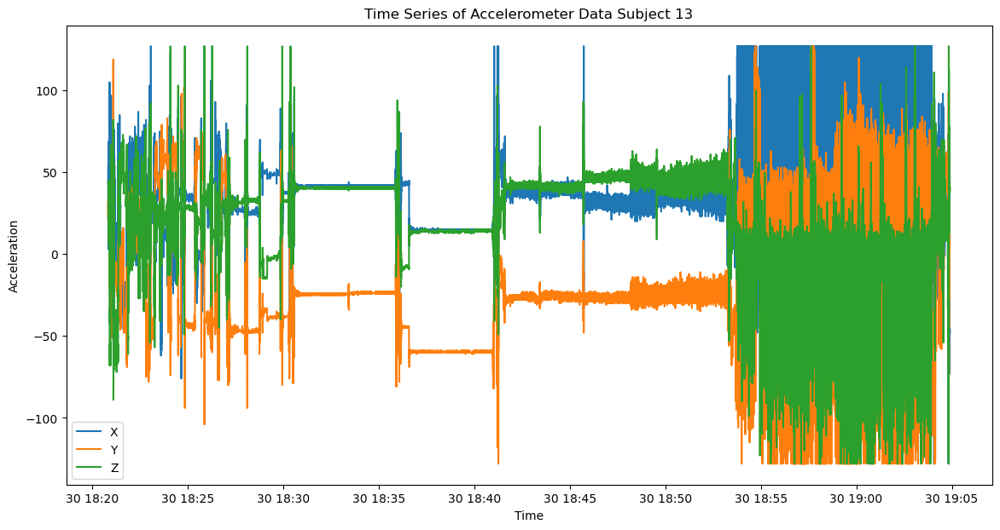

,X,Y,Z,Time
count,84600.000000,84600.000000,84600.000000,84600
mean,33.703274,-22.594196,19.448960,2021-11-30 18:42:51.859375104
min,-128.000000,-128.000000,-128.000000,2021-11-30 18:20:50
25%,15.000000,-44.000000,3.000000,2021-11-30 18:31:50.929687296
50%,35.000000,-26.000000,30.000000,2021-11-30 18:42:51.859375104
75%,41.000000,-21.000000,41.000000,2021-11-30 18:53:52.789062656
max,127.000000,127.000000,127.000000,2021-11-30 19:04:53.718750
std,34.052573,35.664436,29.755496,NaN


Duration: 0 days 00:44:03.718750


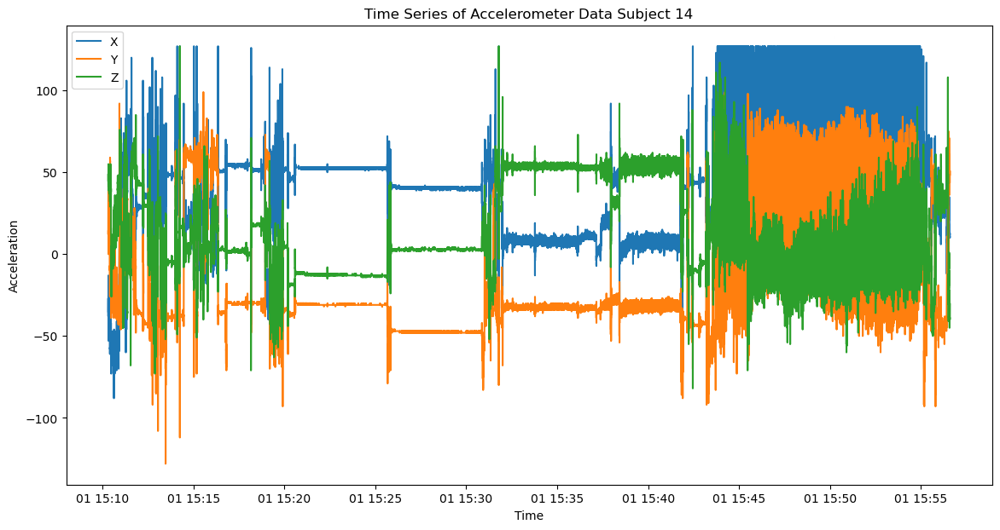

,X,Y,Z,Time
count,88836.000000,88836.000000,88836.000000,88836
mean,37.119434,-16.140720,13.529245,2021-12-01 15:33:27.046874624
min,-88.000000,-128.000000,-82.000000,2021-12-01 15:10:19
25%,10.000000,-36.000000,-7.000000,2021-12-01 15:21:53.023437312
50%,40.000000,-31.000000,3.000000,2021-12-01 15:33:27.046875136
75%,52.000000,7.000000,35.000000,2021-12-01 15:45:01.070312704
max,127.000000,99.000000,127.000000,2021-12-01 15:56:35.093750
std,31.274155,33.475042,26.044491,NaN


Duration: 0 days 00:46:16.093750


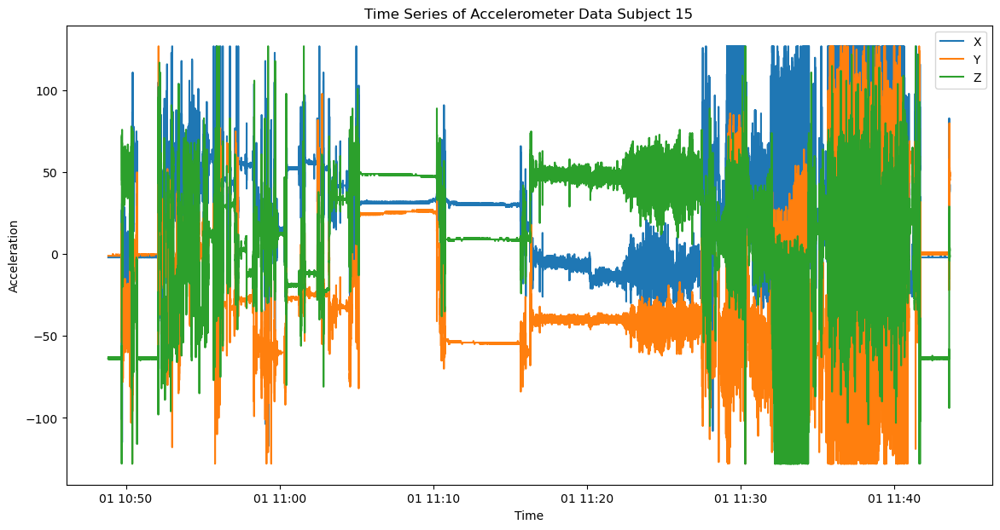

,X,Y,Z,Time
count,105150.000000,105150.000000,105150.000000,105150
mean,24.931840,-22.922026,12.670385,2021-12-01 11:16:13.953124864
min,-128.000000,-128.000000,-128.000000,2021-12-01 10:48:51
25%,-2.000000,-49.000000,-8.000000,2021-12-01 11:02:32.476562688
50%,29.000000,-33.000000,14.000000,2021-12-01 11:16:13.953125120
75%,42.000000,0.000000,47.000000,2021-12-01 11:29:55.429687296
max,127.000000,127.000000,127.000000,2021-12-01 11:43:36.906250
std,33.774237,36.531416,36.920796,NaN


Duration: 0 days 00:54:45.906250


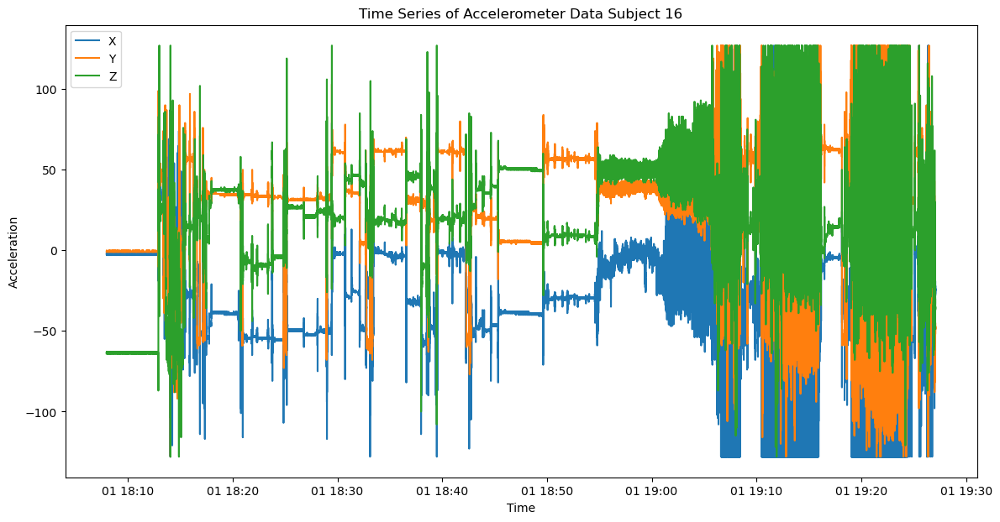

,X,Y,Z,Time
count,151890.000000,151890.000000,151890.000000,151890
mean,-29.468734,28.035684,19.421509,2021-12-01 18:47:31.265625088
min,-128.000000,-128.000000,-128.000000,2021-12-01 18:07:58
25%,-49.000000,6.000000,9.000000,2021-12-01 18:27:44.632812544
50%,-29.000000,34.000000,21.000000,2021-12-01 18:47:31.265625088
75%,-3.000000,56.000000,44.000000,2021-12-01 19:07:17.898437376
max,127.000000,127.000000,127.000000,2021-12-01 19:27:04.531250
std,33.455009,34.041850,32.145813,NaN


Duration: 0 days 01:19:06.531250


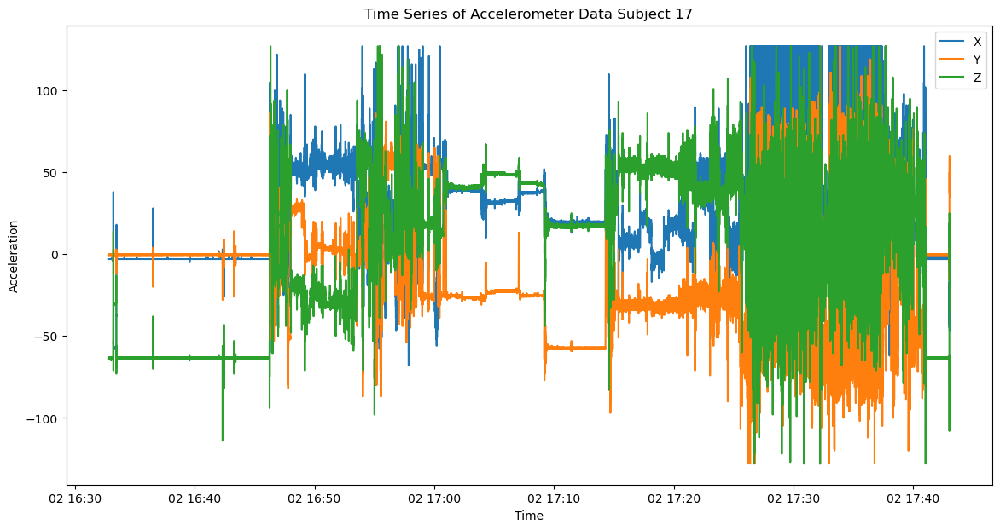

,X,Y,Z,Time
count,134916.000000,134916.000000,134916.000000,134916
mean,25.004714,-11.807925,3.644349,2021-12-02 17:07:55.046875136
min,-128.000000,-128.000000,-128.000000,2021-12-02 16:32:47
25%,-3.000000,-30.000000,-31.000000,2021-12-02 16:50:21.023437312
50%,19.000000,-19.000000,17.000000,2021-12-02 17:07:55.046875136
75%,41.000000,0.000000,42.000000,2021-12-02 17:25:29.070312704
max,127.000000,127.000000,127.000000,2021-12-02 17:43:03.093750
std,33.232313,31.443491,43.739623,NaN


Duration: 0 days 01:10:16.093750


In [27]:
subject_acc_paths = [f'{weee_dataset_path}/{test_subject_id}/E4/ACC.csv' for test_subject_id in subject_ids]

for id, subject_acc_path in enumerate(subject_acc_paths, 1):
    subject_acc_df = load_acc_csv(subject_acc_path)
    plot_accelerometer_data(subject_acc_df, id)

### Filter and export raw acceleration data

In [12]:
raw_acc_data = []
for subject_id in subject_ids:
    acc_path = f'{weee_dataset_path}/{subject_id}/E4/ACC.csv'
    acc_df = load_acc_csv(acc_path)
    acc_df['subject_id'] = subject_id
    raw_acc_data.append(acc_df)

# Concatenate all dataframes into a single dataframe
raw_acc_df = pd.concat(raw_acc_data, ignore_index=True)
raw_acc_df

,X,Y,Z,Time,subject_id
0,20.0,0.0,60.0,2021-12-03 16:57:44.000000,P01
1,19.0,0.0,59.0,2021-12-03 16:57:44.031250,P01
2,19.0,1.0,61.0,2021-12-03 16:57:44.062500,P01
3,20.0,1.0,60.0,2021-12-03 16:57:44.093750,P01
4,20.0,0.0,60.0,2021-12-03 16:57:44.125000,P01
...,...,...,...,...,...
1895503,-42.0,35.0,-33.0,2021-12-02 17:43:02.968750,P17
1895504,-42.0,36.0,-32.0,2021-12-02 17:43:03.000000,P17
1895505,-43.0,37.0,-32.0,2021-12-02 17:43:03.031250,P17
1895506,-44.0,36.0,-33.0,2021-12-02 17:43:03.062500,P17


In [13]:
raw_acc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1895508 entries, 0 to 1895507
Data columns (total 5 columns):
 #   Column      Dtype         
---  ------      -----         
 0   X           float64       
 1   Y           float64       
 2   Z           float64       
 3   Time        datetime64[ns]
 4   subject_id  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 72.3+ MB


In [ ]:
raw_acc_path = f'{weee_dataset_path}/processed/raw_acceleration.csv'
raw_acc_df.to_csv(raw_acc_path, index=False)

### Aggregate to 1 Hz

In [14]:
def agg_acc_data(subject_id):
    subject_acc_path = f'{weee_dataset_path}/{subject_id}/E4/ACC.csv'
    subject_acc_df = load_acc_csv(subject_acc_path)
    return subject_acc_df.set_index('Time').resample('1s').mean().reset_index()

In [15]:
test_subject_id = 'P01'
test_acc_agg_df = agg_acc_data(test_subject_id)
test_acc_agg_df

,Time,X,Y,Z
0,2021-12-03 16:57:44,21.625000,-0.093750,59.656250
1,2021-12-03 16:57:45,14.968750,4.906250,61.000000
2,2021-12-03 16:57:46,17.812500,6.812500,60.500000
3,2021-12-03 16:57:47,16.437500,1.375000,60.562500
4,2021-12-03 16:57:48,18.093750,0.968750,60.593750
...,...,...,...,...
2284,2021-12-03 17:35:48,17.875000,47.343750,-10.062500
2285,2021-12-03 17:35:49,4.000000,59.312500,9.281250
2286,2021-12-03 17:35:50,2.750000,59.062500,7.718750
2287,2021-12-03 17:35:51,31.968750,39.937500,36.656250


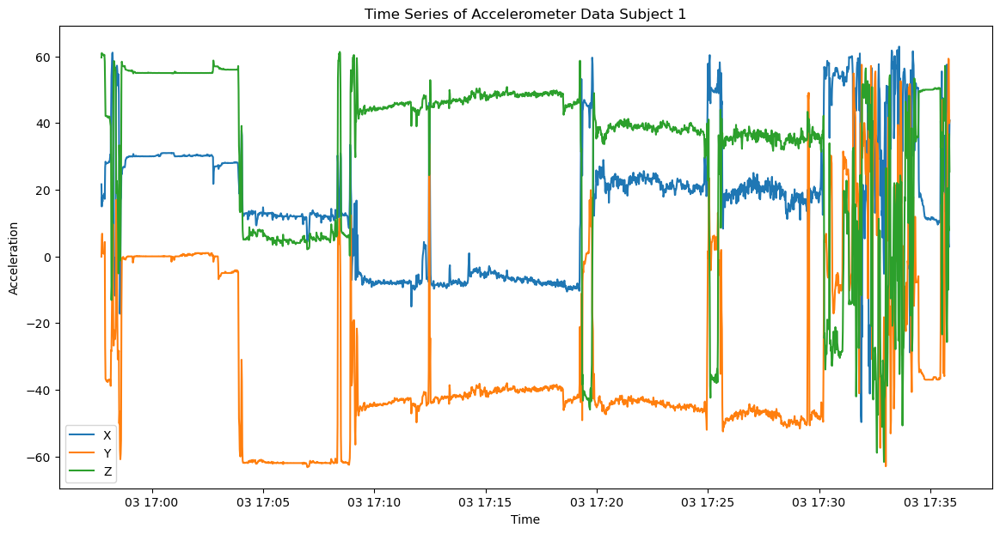

,Time,X,Y,Z
count,2289,2289.000000,2289.000000,2289.000000
mean,2021-12-03 17:16:47.999999744,16.577510,-31.367757,32.504365
min,2021-12-03 16:57:44,-49.718750,-63.250000,-61.656250
25%,2021-12-03 17:07:16,-4.656250,-46.312500,24.281250
50%,2021-12-03 17:16:48,18.468750,-42.250000,39.531250
75%,2021-12-03 17:26:20,28.125000,-5.468750,48.625000
max,2021-12-03 17:35:52,62.937500,59.312500,61.343750
std,NaN,18.884626,25.748717,24.476768


Duration: 0 days 00:38:08


In [30]:
plot_accelerometer_data(test_acc_agg_df)

## BVP/PPG

### Methods

In [16]:
def load_bvp_csv(path):
    df = pd.read_csv(path, header=None)
    initial_time = df.iloc[0, 0]
    sample_rate = df.iloc[1, 0]
    data = df.iloc[2:].reset_index(drop=True)
    data.columns = ['PPG']
    data['Time'] = initial_time + (data.index / sample_rate)
    data['Time'] = pd.to_datetime(data['Time'], unit='s')
    return data

In [17]:
test_bvp_path = f'{weee_dataset_path}/{test_subject_id}/E4/BVP.csv'

test_bvp_df = load_bvp_csv(test_bvp_path)
test_bvp_df

,PPG,Time
0,-0.00,2021-12-03 16:57:44.000000
1,-0.00,2021-12-03 16:57:44.015625
2,-0.00,2021-12-03 16:57:44.031250
3,-0.00,2021-12-03 16:57:44.046875
4,-0.00,2021-12-03 16:57:44.062500
...,...,...
146504,-2.45,2021-12-03 17:35:53.125000
146505,0.02,2021-12-03 17:35:53.140625
146506,2.11,2021-12-03 17:35:53.156250
146507,3.83,2021-12-03 17:35:53.171875


In [25]:
pd.read_csv(test_bvp_path, header=None)

,0
0,1.638551e+09
1,6.400000e+01
2,-0.000000e+00
3,-0.000000e+00
4,-0.000000e+00
...,...
146506,-2.450000e+00
146507,2.000000e-02
146508,2.110000e+00
146509,3.830000e+00


In [30]:
def butter_bandpass_filter(data, lowcut, highcut, fs, order=3):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    y = filtfilt(b, a, data)
    return y

def extract_ppg_features(ppg_csv_path, sample_rate=64):
    ppg_df = load_bvp_csv(ppg_csv_path)

    hrdata = ppg_df['PPG'].to_numpy() # numpy.ndarray
    timestamps = ppg_df['Time'].to_numpy() # numpy.ndarray

    # Apply Butterworth Bandpass Filter
    filtered_ppg = butter_bandpass_filter(hrdata, 0.7, 3.5, sample_rate)
    
    # Process the filtered PPG signal using HeartPy
    working_data, measures = hp.process(filtered_ppg, sample_rate)
    
    # Extract features
    features = {
        'heart_rate': measures['bpm'], # Heart Rate
        'ibi': measures['ibi'], # Interbeat Interval
        'sdnn': measures['sdnn'], # Standard Deviation of Normal to Normal Intervals
        'rmssd': measures['rmssd'], # Root Mean Square of Successive Differences
        'pnn20': measures['pnn20'], # Percentage of Normal to Normal Intervals differing more than 20ms
        'pnn50': measures['pnn50'], # Percentage of Normal to Normal Intervals differing more than 50ms
        'hr_mad': measures['hr_mad'], # Mean Absolute Deviation of Heart Rate
        'sd1': measures['sd1'], # Standard Deviation of the First Derivative of the PPG Signal
        'sd2': measures['sd2'], # Standard Deviation of the Second Derivative of the PPG Signal
        'sd1/sd2': measures['sd1/sd2'], # Ratio of Standard Deviation of the First to Second Derivative of the PPG Signal
        'breathingrate': measures['breathingrate'] # Breathing Rate
    }
    
    # Convert features to DataFrame
    features_df = pd.DataFrame([features])
    
    # Apply a 10-second central moving average to smooth the extracted features
    features_df = features_df.rolling(window=10, center=True).mean()
    
    return features_df

# Example usage
# test_features_df = extract_ppg_features(test_bvp_df)
# test_features_df


In [27]:
test_ppg_features_df = extract_ppg_features(test_bvp_path)
test_ppg_features_df

,heart_rate,ibi,sdnn,rmssd,pnn20,pnn50,hr_mad,sd1,sd2,sd1/sd2,breathingrate
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
def process_bvp_data(df, sample_rate=64):
    ppg = df['PPG'].to_numpy()
    signals, info = nk.ppg_process(ppg, sampling_rate=sample_rate)
    signals['Time'] = df['Time']
    return signals, info

In [20]:
def plot_bvp_data(df, sample_rate=64):
    signals, info = process_bvp_data(df)
    # print(signals)
    # print(info)

    # Visualize the processing
    nk.ppg_plot(signals, info)

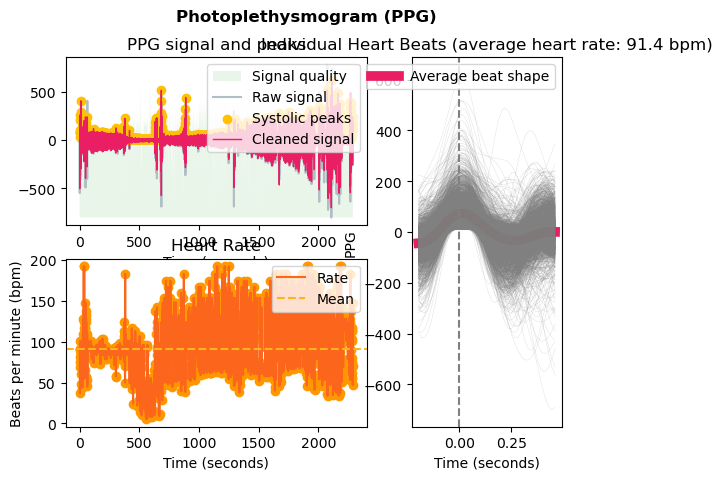

In [21]:
plot_bvp_data(test_bvp_df)

In [20]:
def extract_heart_rate(df, sample_rate=64):
    signals, info = process_bvp_data(df, sample_rate)
    heart_rate = pd.DataFrame({'heart_rate':signals['PPG_Rate']})
    heart_rate['Time'] = df['Time']
    return heart_rate

In [37]:
test_heart_rate = extract_heart_rate(test_bvp_df)
test_heart_rate

,heart_rate,Time
0,89.740342,2021-12-03 16:57:44.000000
1,89.740342,2021-12-03 16:57:44.015625
2,89.740342,2021-12-03 16:57:44.031250
3,89.740342,2021-12-03 16:57:44.046875
4,89.740342,2021-12-03 16:57:44.062500
...,...,...
146504,147.692308,2021-12-03 17:35:53.125000
146505,147.692308,2021-12-03 17:35:53.140625
146506,147.692308,2021-12-03 17:35:53.156250
146507,147.692308,2021-12-03 17:35:53.171875


In [38]:
def plot_heart_rate(df, subject_id=1):
    plt.figure(figsize=(14, 7))
    plt.plot(df['Time'], df['heart_rate'])
    plt.xlabel('Time')
    plt.ylabel('Heart Rate')
    plt.title(f'Time Series of Heart Rate Subject {subject_id}')
    plt.show()

    display(df.describe())

    print(f'Duration: {df["Time"].iloc[-1] - df["Time"].iloc[0]}')

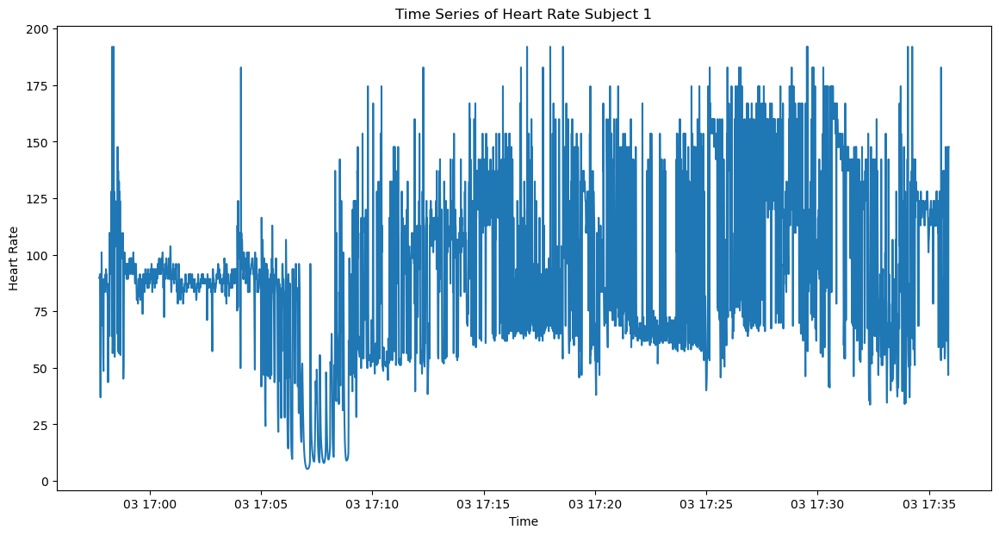

,heart_rate,Time
count,146509.000000,146509
mean,91.367942,2021-12-03 17:16:48.593750272
min,5.274725,2021-12-03 16:57:44
25%,67.577859,2021-12-03 17:07:16.296875008
50%,89.299008,2021-12-03 17:16:48.593750016
75%,114.480222,2021-12-03 17:26:20.890625024
max,192.000000,2021-12-03 17:35:53.187500
std,34.285773,NaN


Duration: 0 days 00:38:09.187500


In [39]:
plot_heart_rate(test_heart_rate)

### Plot heart rates

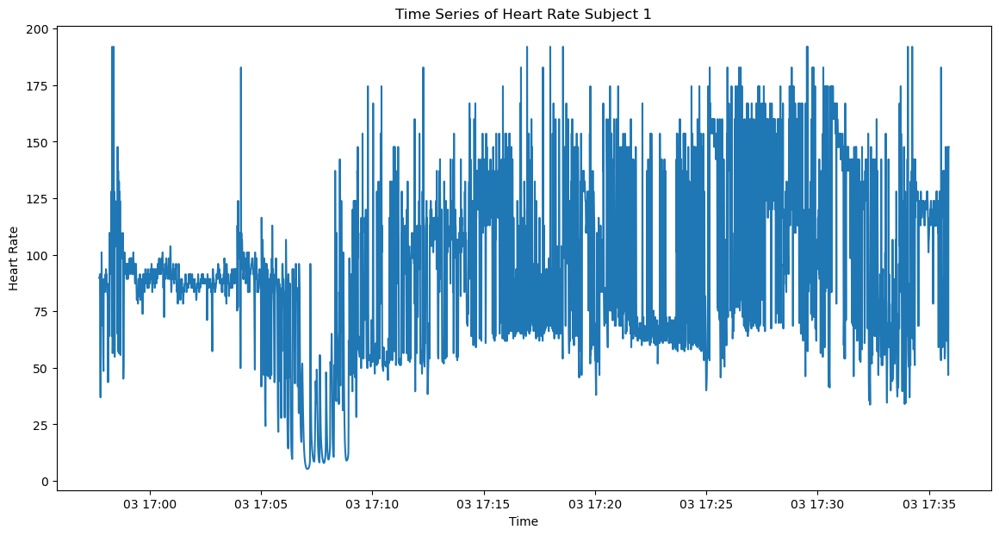

,heart_rate,Time
count,146509.000000,146509
mean,91.367942,2021-12-03 17:16:48.593750272
min,5.274725,2021-12-03 16:57:44
25%,67.577859,2021-12-03 17:07:16.296875008
50%,89.299008,2021-12-03 17:16:48.593750016
75%,114.480222,2021-12-03 17:26:20.890625024
max,192.000000,2021-12-03 17:35:53.187500
std,34.285773,NaN


Duration: 0 days 00:38:09.187500


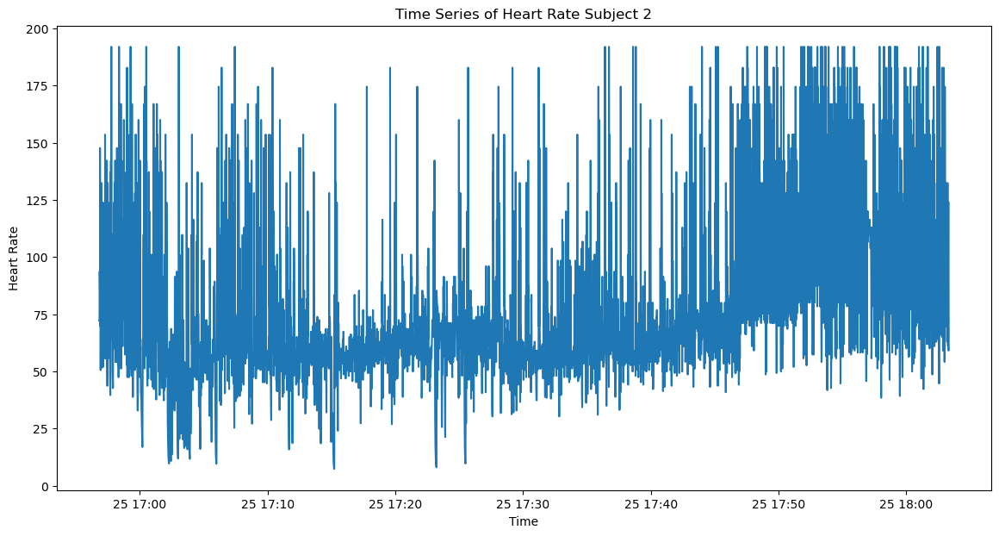

,heart_rate,Time
count,255354.000000,255354
mean,73.878591,2021-11-25 17:30:03.945312768
min,7.272727,2021-11-25 16:56:49
25%,55.721318,2021-11-25 17:13:26.472656384
50%,66.140666,2021-11-25 17:30:03.945312512
75%,85.417599,2021-11-25 17:46:41.417968640
max,192.000000,2021-11-25 18:03:18.890625
std,29.020024,NaN


Duration: 0 days 01:06:29.890625


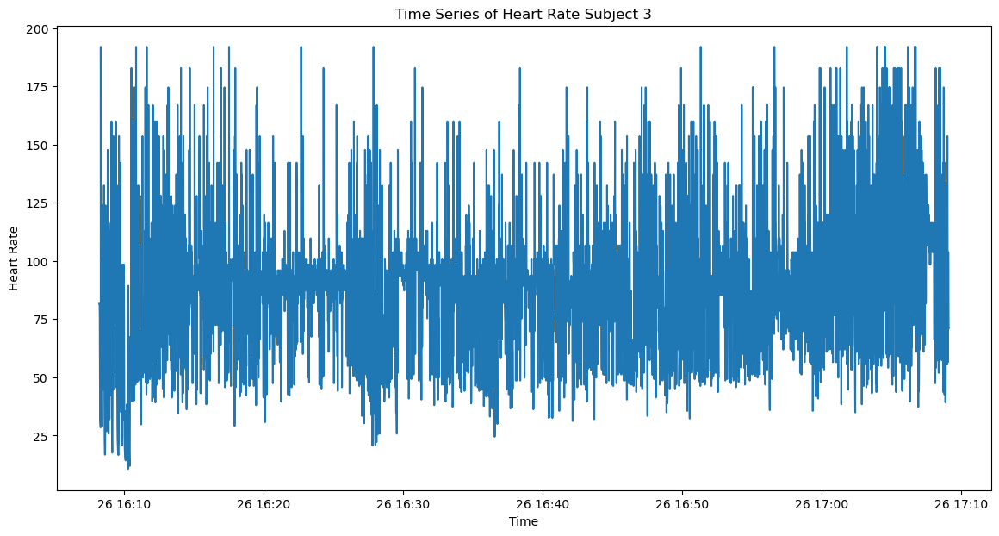

,heart_rate,Time
count,233827.000000,233827
mean,83.498527,2021-11-26 16:38:39.765624832
min,10.637119,2021-11-26 16:08:13
25%,66.216092,2021-11-26 16:23:26.382812416
50%,85.743103,2021-11-26 16:38:39.765625088
75%,96.660879,2021-11-26 16:53:53.148437504
max,192.000000,2021-11-26 17:09:06.531250
std,25.047419,NaN


Duration: 0 days 01:00:53.531250


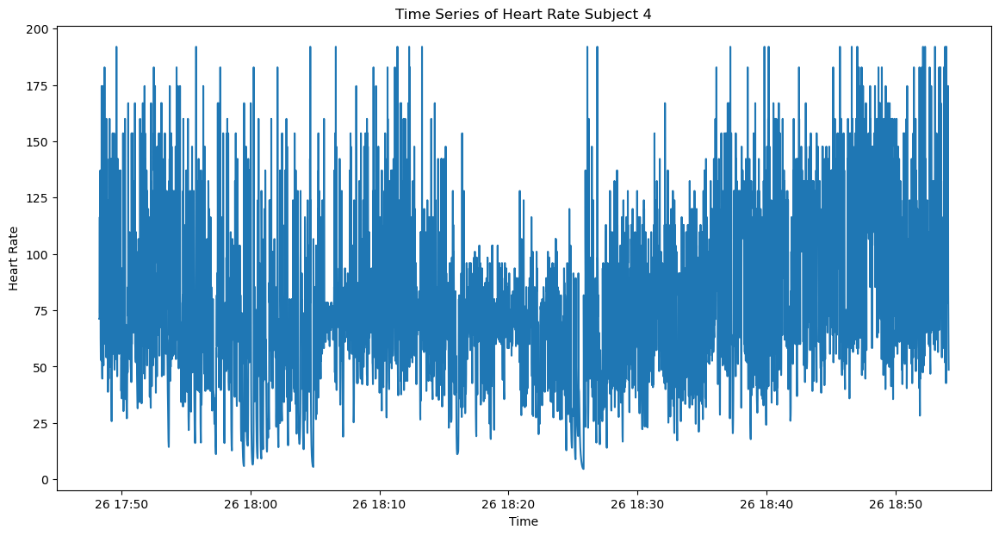

,heart_rate,Time
count,252857.000000,252857
mean,73.726702,2021-11-26 18:21:12.437500160
min,4.565993,2021-11-26 17:48:17
25%,53.191056,2021-11-26 18:04:44.718749952
50%,70.909144,2021-11-26 18:21:12.437499904
75%,90.909605,2021-11-26 18:37:40.156250112
max,192.000000,2021-11-26 18:54:07.875000
std,31.186995,NaN


Duration: 0 days 01:05:50.875000


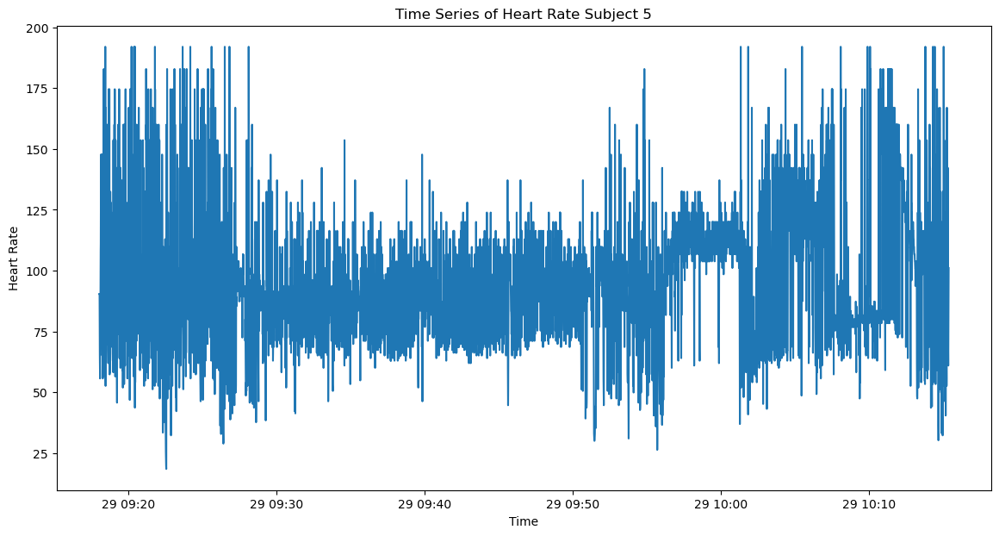

,heart_rate,Time
count,220198.000000,220198
mean,91.640105,2021-11-29 09:46:41.289061632
min,18.461538,2021-11-29 09:18:01
25%,77.057855,2021-11-29 09:32:21.144531200
50%,87.979801,2021-11-29 09:46:41.289062400
75%,105.996459,2021-11-29 10:01:01.433593600
max,192.000000,2021-11-29 10:15:21.578125
std,23.339931,NaN


Duration: 0 days 00:57:20.578125


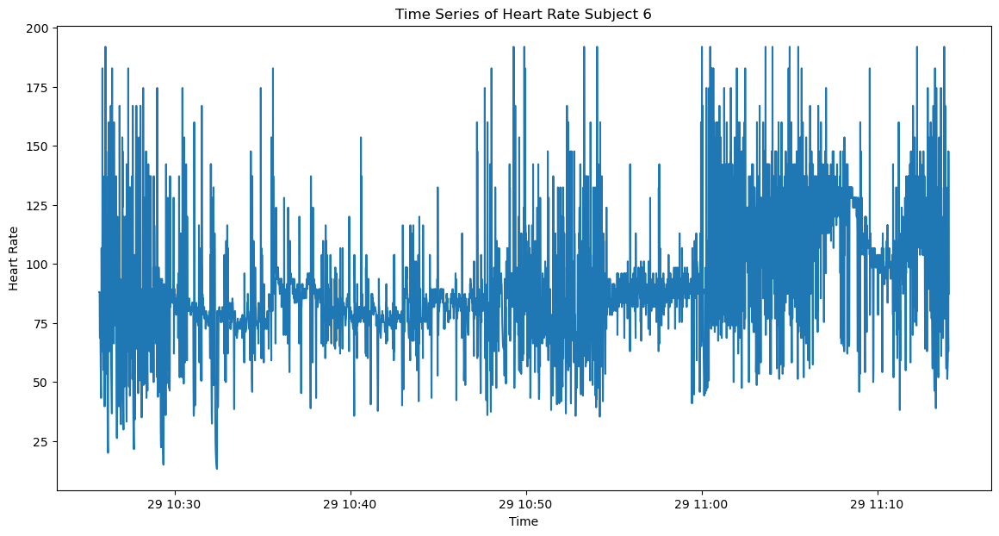

,heart_rate,Time
count,185680.000000,185680
mean,89.120498,2021-11-29 10:49:53.617187328
min,13.061224,2021-11-29 10:25:43
25%,76.294809,2021-11-29 10:37:48.308593664
50%,85.333333,2021-11-29 10:49:53.617187328
75%,100.171061,2021-11-29 11:01:58.925781248
max,192.000000,2021-11-29 11:14:04.234375
std,23.559815,NaN


Duration: 0 days 00:48:21.234375


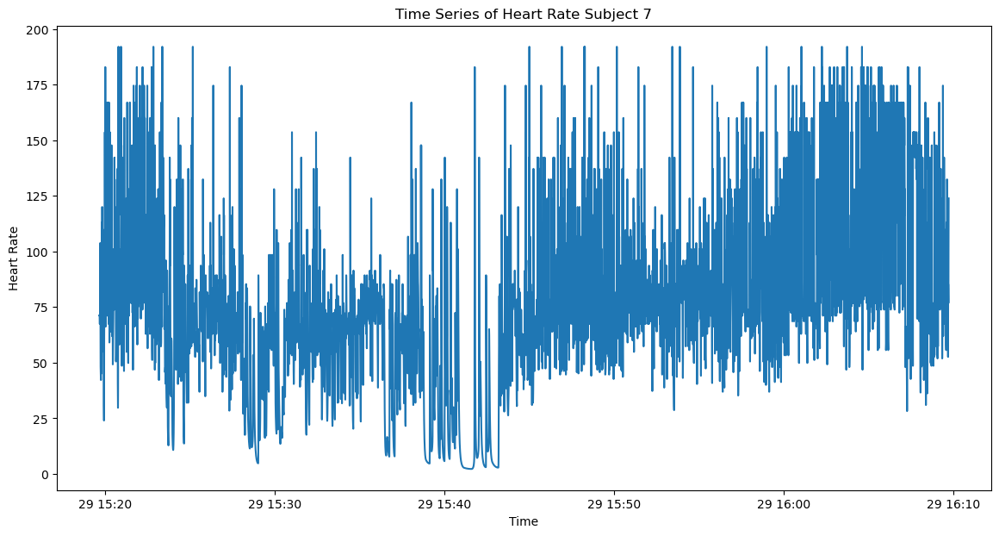

,heart_rate,Time
count,192203.000000,192203
mean,73.635223,2021-11-29 15:44:41.578124544
min,2.242991,2021-11-29 15:19:40
25%,54.857143,2021-11-29 15:32:10.789062400
50%,72.539879,2021-11-29 15:44:41.578125056
75%,89.589285,2021-11-29 15:57:12.367187456
max,192.000000,2021-11-29 16:09:43.156250
std,35.213998,NaN


Duration: 0 days 00:50:03.156250


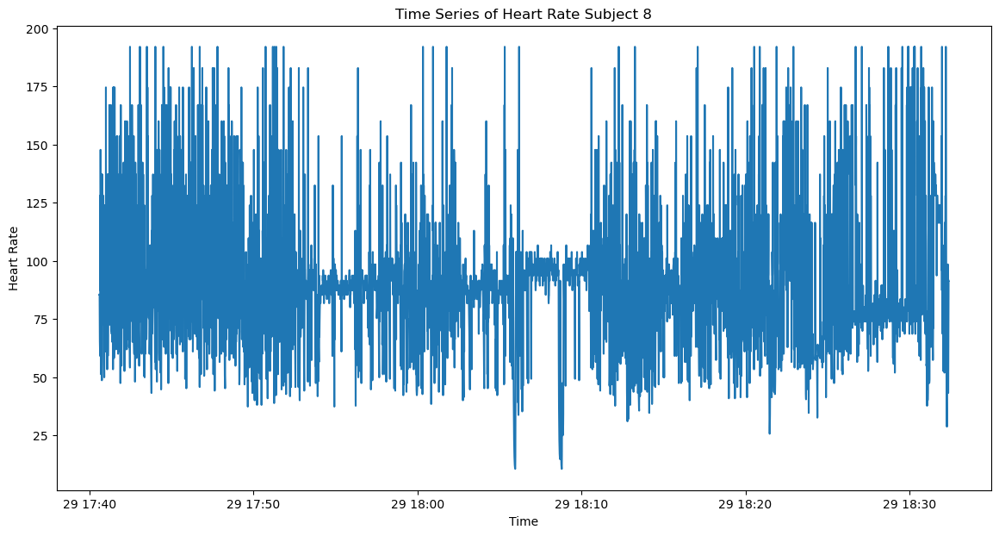

,heart_rate,Time
count,198957.000000,198957
mean,87.033344,2021-11-29 18:06:29.343748864
min,10.491803,2021-11-29 17:40:35
25%,71.305794,2021-11-29 17:53:32.171875072
50%,87.199851,2021-11-29 18:06:29.343749888
75%,98.368121,2021-11-29 18:19:26.515624960
max,192.000000,2021-11-29 18:32:23.687500
std,25.002412,NaN


Duration: 0 days 00:51:48.687500


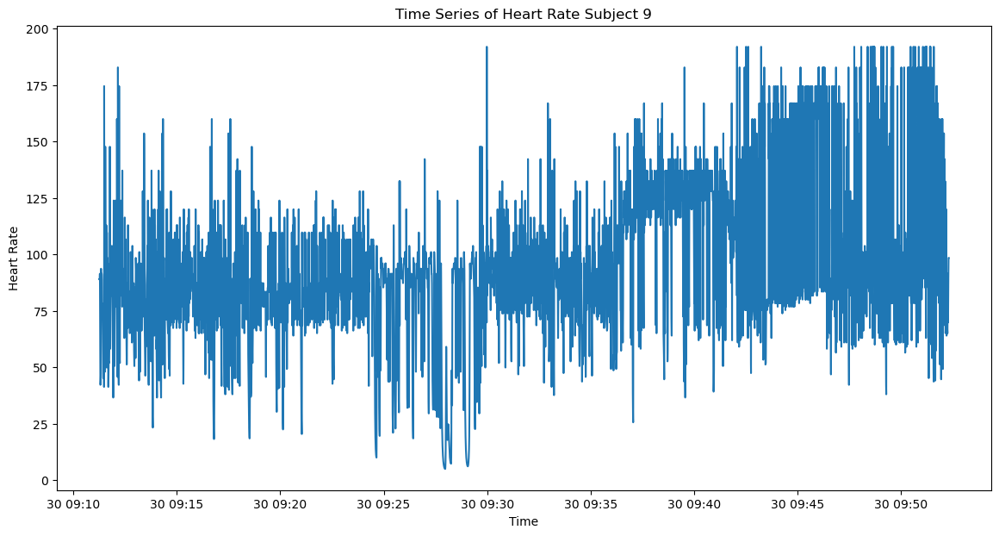

,heart_rate,Time
count,157674.000000,157674
mean,90.772277,2021-11-30 09:31:46.820311808
min,4.942085,2021-11-30 09:11:15
25%,75.294118,2021-11-30 09:21:30.910156288
50%,87.272727,2021-11-30 09:31:46.820312320
75%,103.783784,2021-11-30 09:42:02.730468608
max,192.000000,2021-11-30 09:52:18.640625
std,30.272087,NaN


Duration: 0 days 00:41:03.640625


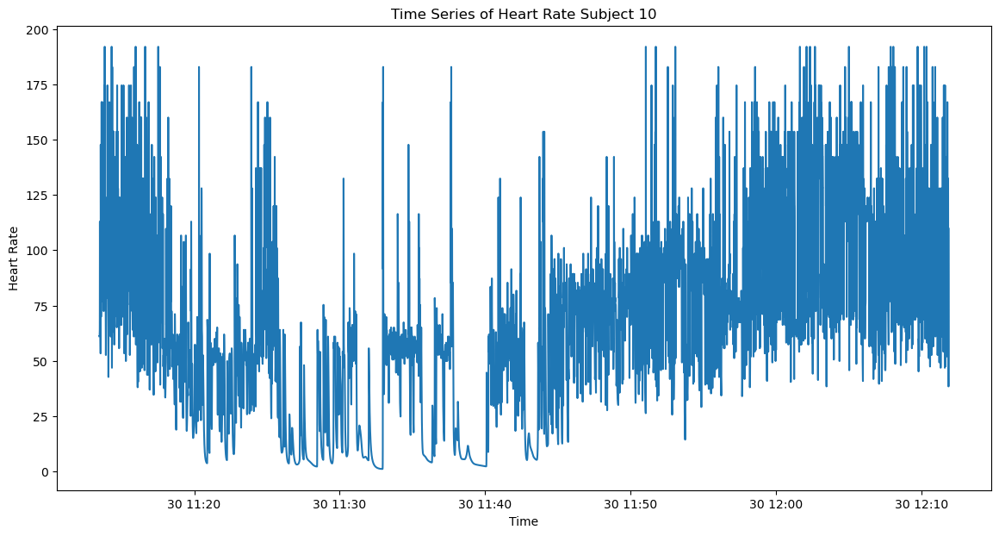

,heart_rate,Time
count,224323.000000,224323
mean,63.203336,2021-11-30 11:42:40.515625472
min,1.081081,2021-11-30 11:13:28
25%,36.783083,2021-11-30 11:28:04.257812480
50%,61.443117,2021-11-30 11:42:40.515624960
75%,86.193572,2021-11-30 11:57:16.773437440
max,192.000000,2021-11-30 12:11:53.031250
std,38.340607,NaN


Duration: 0 days 00:58:25.031250


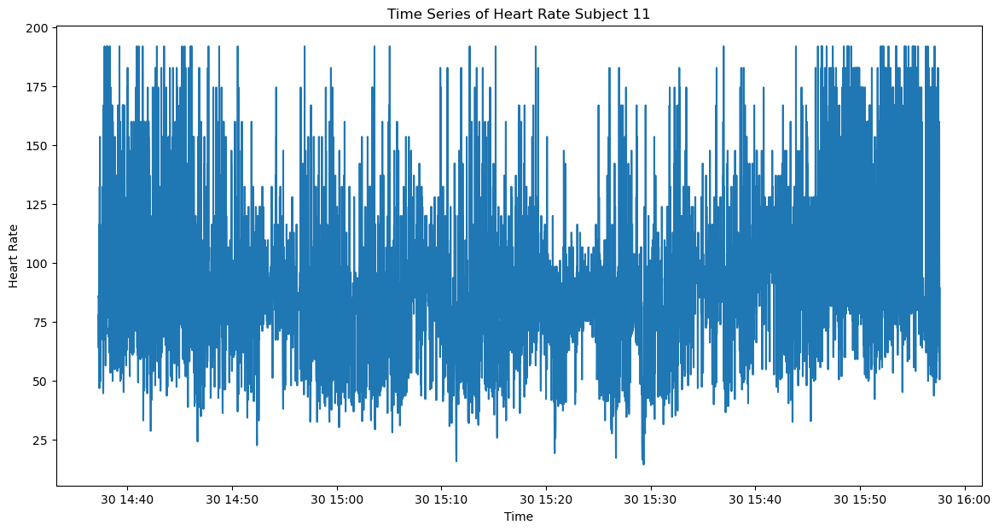

,heart_rate,Time
count,308825.000000,308825
mean,87.674707,2021-11-30 15:17:25.687499008
min,14.382022,2021-11-30 14:37:13
25%,71.206980,2021-11-30 14:57:19.343749888
50%,85.537681,2021-11-30 15:17:25.687500032
75%,99.483206,2021-11-30 15:37:32.031249920
max,192.000000,2021-11-30 15:57:38.375000
std,27.816083,NaN


Duration: 0 days 01:20:25.375000


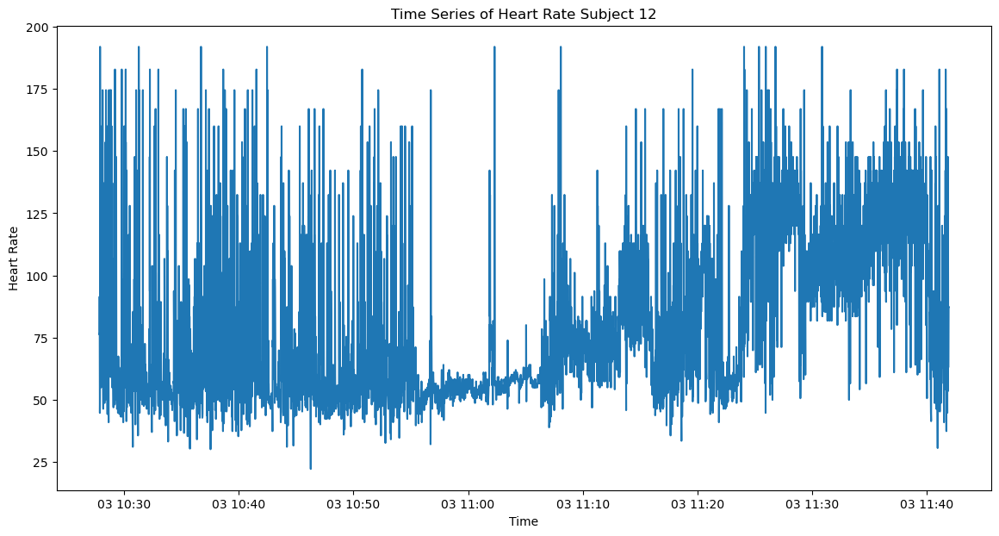

,heart_rate,Time
count,284592.000000,284592
mean,77.339014,2021-12-03 11:04:52.367188224
min,22.068966,2021-12-03 10:27:49
25%,55.041749,2021-12-03 10:46:20.683593728
50%,67.216845,2021-12-03 11:04:52.367187456
75%,98.931472,2021-12-03 11:23:24.050781184
max,192.000000,2021-12-03 11:41:55.734375
std,28.253716,NaN


Duration: 0 days 01:14:06.734375


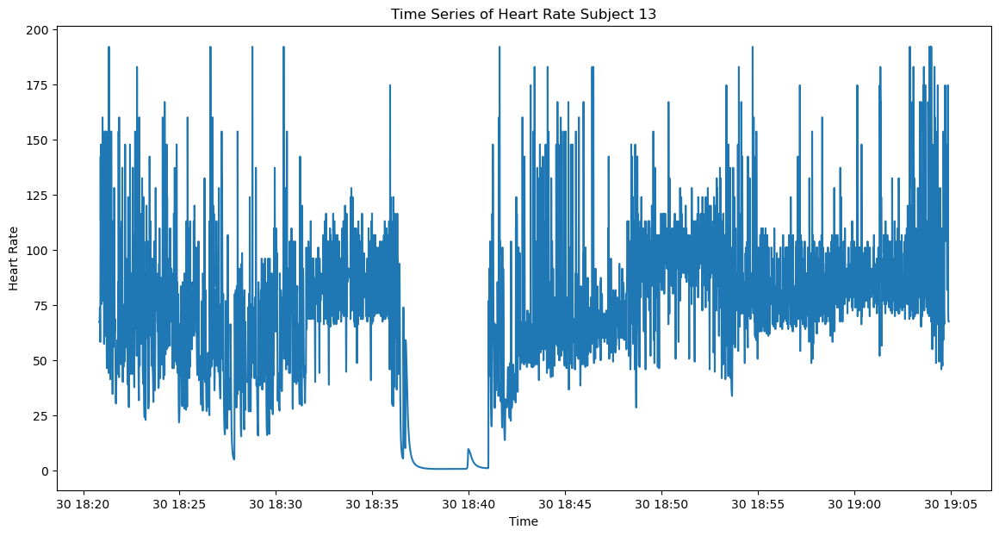

,heart_rate,Time
count,169224.000000,169224
mean,68.925848,2021-11-30 18:42:52.054687744
min,0.610590,2021-11-30 18:20:50
25%,51.465413,2021-11-30 18:31:51.027343616
50%,74.601464,2021-11-30 18:42:52.054687488
75%,88.689784,2021-11-30 18:53:53.082031360
max,192.000000,2021-11-30 19:04:54.109375
std,32.739796,NaN


Duration: 0 days 00:44:04.109375


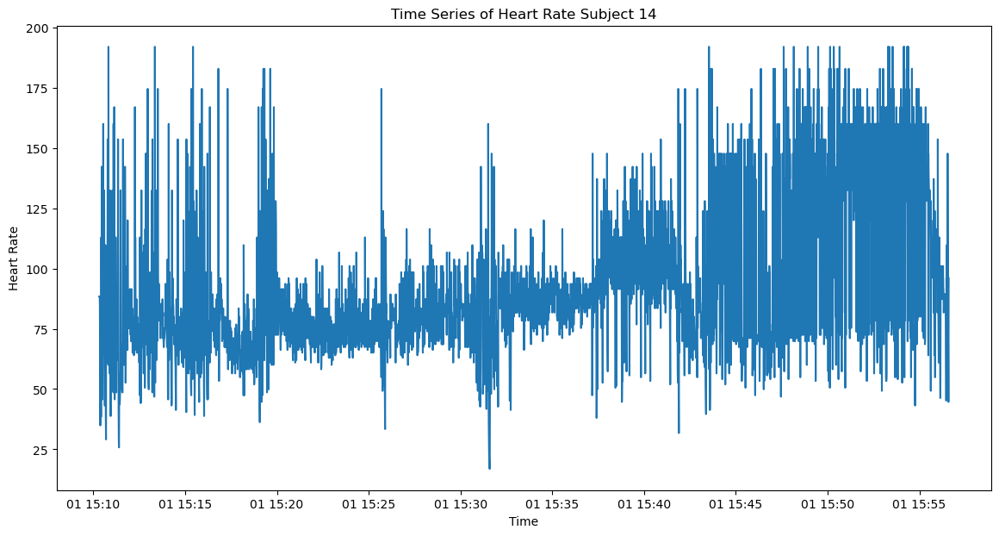

,heart_rate,Time
count,177705.000000,177705
mean,89.557379,2021-12-01 15:33:27.312500736
min,16.842105,2021-12-01 15:10:19
25%,71.951125,2021-12-01 15:21:53.156250112
50%,82.961507,2021-12-01 15:33:27.312499968
75%,98.596021,2021-12-01 15:45:01.468750080
max,192.000000,2021-12-01 15:56:35.625000
std,26.844978,NaN


Duration: 0 days 00:46:16.625000


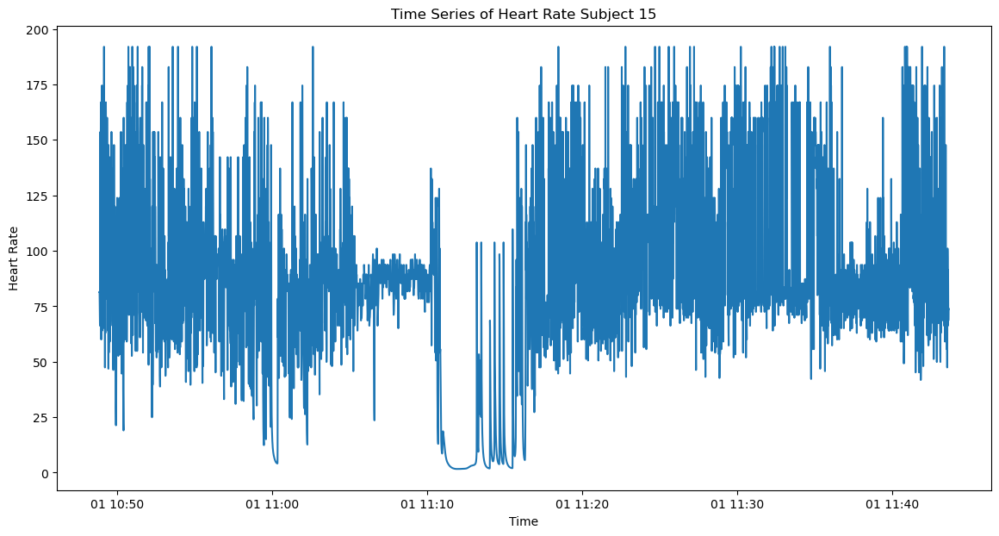

,heart_rate,Time
count,210375.000000,210375
mean,83.315237,2021-12-01 11:16:14.546873856
min,1.641026,2021-12-01 10:48:51
25%,67.643888,2021-12-01 11:02:32.773437440
50%,84.185292,2021-12-01 11:16:14.546874880
75%,102.565959,2021-12-01 11:29:56.320312320
max,192.000000,2021-12-01 11:43:38.093750
std,36.427404,NaN


Duration: 0 days 00:54:47.093750


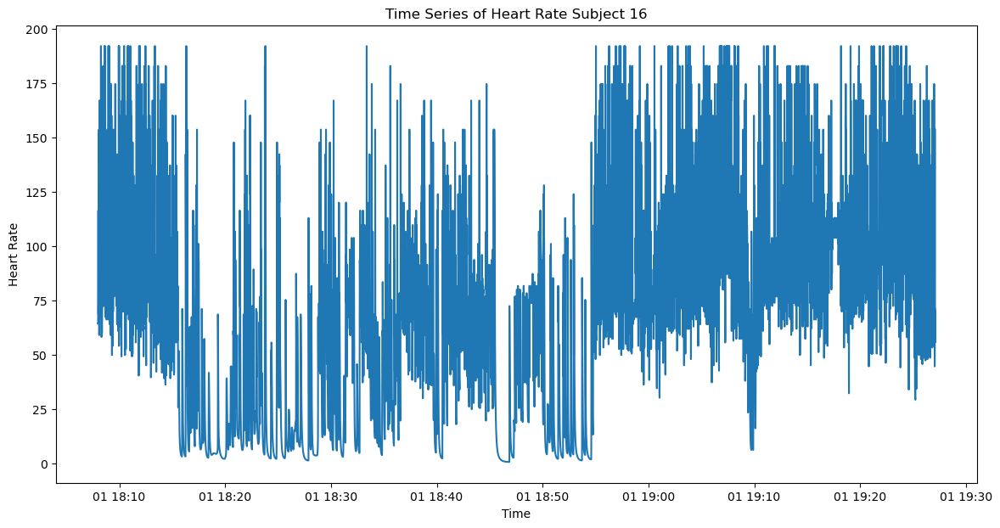

,heart_rate,Time
count,303842.000000,303842
mean,67.435218,2021-12-01 18:47:31.757812992
min,0.703554,2021-12-01 18:07:58
25%,28.114746,2021-12-01 18:27:44.878906368
50%,71.479422,2021-12-01 18:47:31.757812480
75%,95.331082,2021-12-01 19:07:18.636718592
max,192.000000,2021-12-01 19:27:05.515625
std,43.391604,NaN


Duration: 0 days 01:19:07.515625


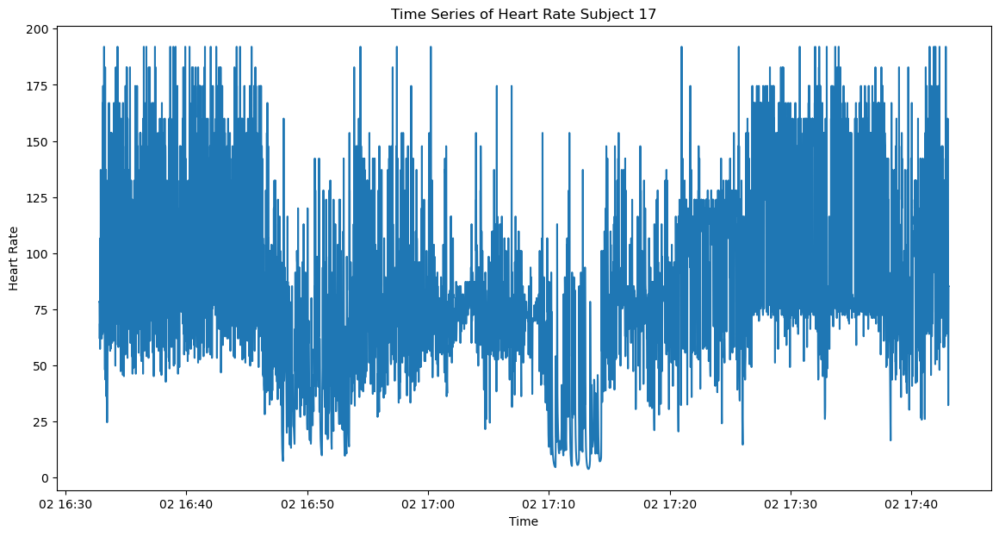

,heart_rate,Time
count,269907.000000,269907
mean,80.459326,2021-12-02 17:07:55.640624896
min,3.840000,2021-12-02 16:32:47
25%,60.127580,2021-12-02 16:50:21.320312320
50%,76.800000,2021-12-02 17:07:55.640624896
75%,99.922749,2021-12-02 17:25:29.960937472
max,192.000000,2021-12-02 17:43:04.281250
std,34.441546,NaN


Duration: 0 days 01:10:17.281250


In [40]:
subject_bvp_paths = [f'{weee_dataset_path}/{test_subject_id}/E4/BVP.csv' for test_subject_id in subject_ids]

for id, subject_bvp_path in enumerate(subject_bvp_paths, 1):
    subject_bvp_df = load_bvp_csv(subject_bvp_path)
    subject_heart_rate_df = extract_heart_rate(subject_bvp_df)
    plot_heart_rate(subject_heart_rate_df, id)

### Aggregate to 1 Hz

In [41]:
def agg_heart_rate_data(subject_id):
    subject_bvp_path = f'{weee_dataset_path}/{subject_id}/E4/BVP.csv'
    subject_bvp_df = load_bvp_csv(subject_bvp_path)
    subject_heart_rate_df = extract_heart_rate(subject_bvp_df)
    return subject_heart_rate_df.set_index('Time').resample('1s').mean().reset_index()

In [42]:
test_subject_id = 'P01'
test_heart_rate_agg_df = agg_heart_rate_data(test_subject_id)
test_heart_rate_agg_df

,Time,heart_rate
0,2021-12-03 16:57:44,89.740342
1,2021-12-03 16:57:45,90.688804
2,2021-12-03 16:57:46,63.750026
3,2021-12-03 16:57:47,41.812265
4,2021-12-03 16:57:48,84.533634
...,...,...
2285,2021-12-03 17:35:49,114.913870
2286,2021-12-03 17:35:50,95.795740
2287,2021-12-03 17:35:51,52.991904
2288,2021-12-03 17:35:52,108.081866


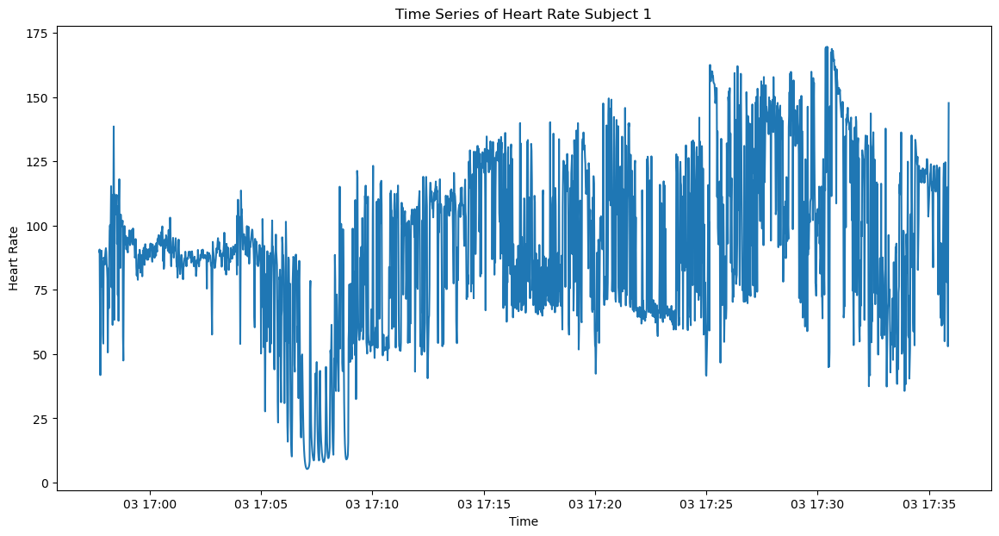

,Time,heart_rate
count,2290,2290.000000
mean,2021-12-03 17:16:48.499999744,91.387542
min,2021-12-03 16:57:44,5.277847
25%,2021-12-03 17:07:16.249999872,70.331276
50%,2021-12-03 17:16:48.500000,90.031369
75%,2021-12-03 17:26:20.750000128,112.724142
max,2021-12-03 17:35:53,169.594011
std,NaN,31.709217


Duration: 0 days 00:38:09


In [43]:
plot_heart_rate(test_heart_rate_agg_df)

## TEMP

### Methods

In [44]:
def load_temp_csv(path):
    df = pd.read_csv(path, header=None)
    initial_time = df.iloc[0, 0]
    sample_rate = df.iloc[1, 0]
    data = df.iloc[2:].reset_index(drop=True)
    data.columns = ['TEMP']
    data['Time'] = initial_time + (data.index / sample_rate)
    data['Time'] = pd.to_datetime(data['Time'], unit='s')
    return data

In [45]:
test_temp_path = f'{weee_dataset_path}/{test_subject_id}/E4/TEMP.csv'

test_temp_df = load_temp_csv(test_temp_path)
test_temp_df

,TEMP,Time
0,32.39,2021-12-03 16:57:44.000
1,32.39,2021-12-03 16:57:44.250
2,32.39,2021-12-03 16:57:44.500
3,32.39,2021-12-03 16:57:44.750
4,32.39,2021-12-03 16:57:45.000
...,...,...
9155,28.27,2021-12-03 17:35:52.750
9156,27.75,2021-12-03 17:35:53.000
9157,27.75,2021-12-03 17:35:53.250
9158,27.75,2021-12-03 17:35:53.500


In [46]:
def plot_temp_data(df, subject_id=1):
    plt.figure(figsize=(14, 7))
    plt.plot(df['Time'], df['TEMP'])
    plt.xlabel('Time')
    plt.ylabel('Temperature')
    plt.title(f'Time Series of Temperature Subject {subject_id}')
    plt.show()

    display(df.describe())

    print(f'Duration: {df["Time"].iloc[-1] - df["Time"].iloc[0]}')

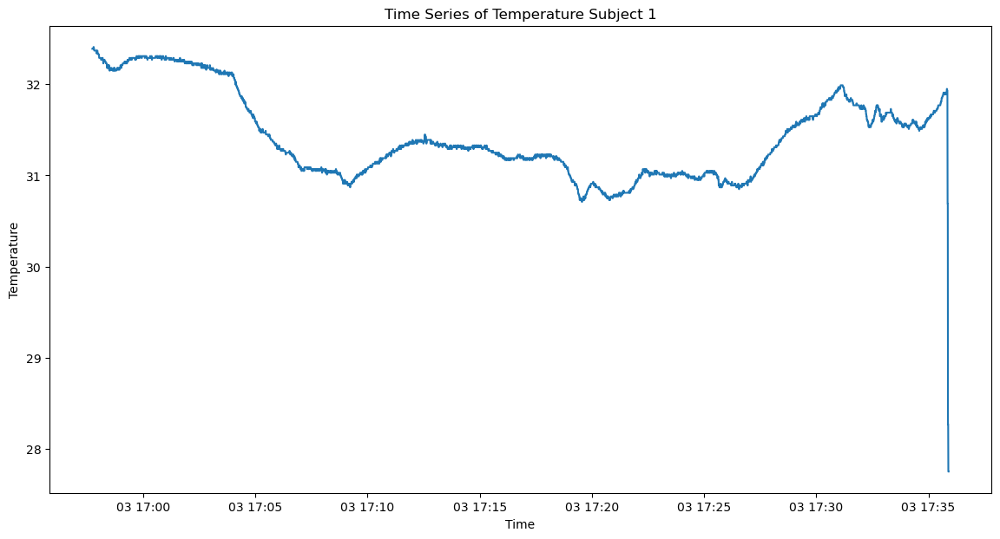

,TEMP,Time
count,9160.000000,9160
mean,31.423319,2021-12-03 17:16:48.874999808
min,27.750000,2021-12-03 16:57:44
25%,31.050000,2021-12-03 17:07:16.437499904
50%,31.310000,2021-12-03 17:16:48.875000064
75%,31.730000,2021-12-03 17:26:21.312499968
max,32.410000,2021-12-03 17:35:53.750000
std,0.469331,NaN


Duration: 0 days 00:38:09.750000


In [47]:
plot_temp_data(test_temp_df)

### Plot TEMPs

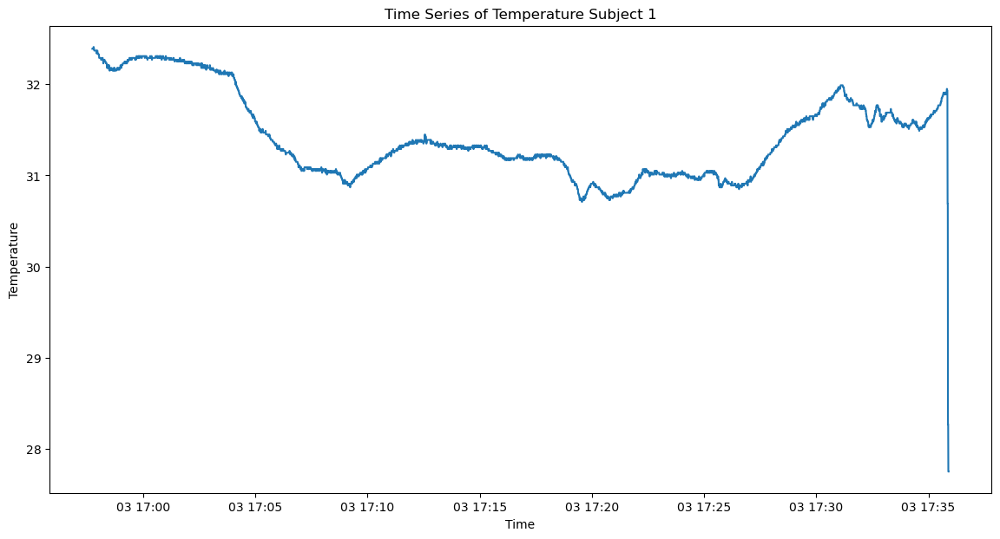

,TEMP,Time
count,9160.000000,9160
mean,31.423319,2021-12-03 17:16:48.874999808
min,27.750000,2021-12-03 16:57:44
25%,31.050000,2021-12-03 17:07:16.437499904
50%,31.310000,2021-12-03 17:16:48.875000064
75%,31.730000,2021-12-03 17:26:21.312499968
max,32.410000,2021-12-03 17:35:53.750000
std,0.469331,NaN


Duration: 0 days 00:38:09.750000


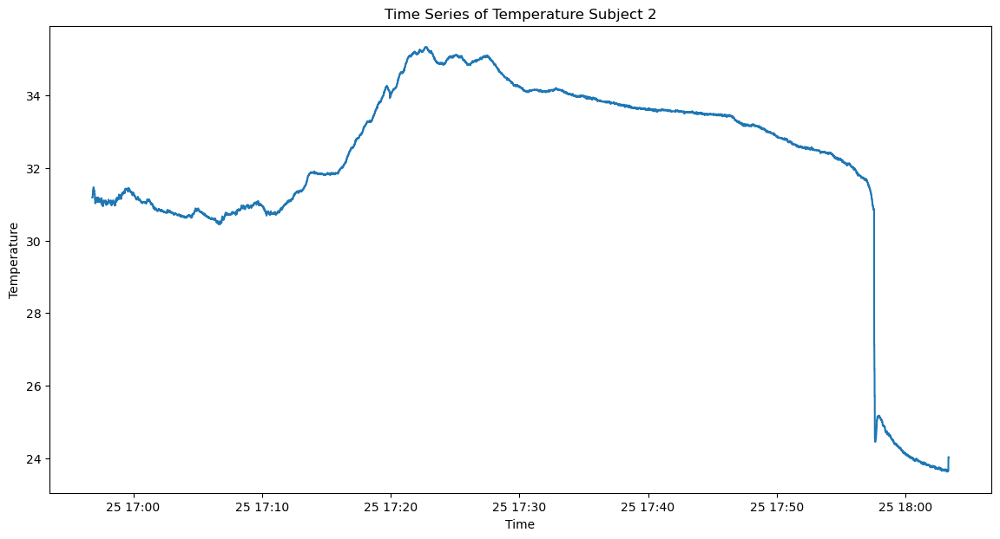

,TEMP,Time
count,15968.000000,15968
mean,32.080554,2021-11-25 17:30:04.874999808
min,23.630000,2021-11-25 16:56:49
25%,31.030000,2021-11-25 17:13:26.937499904
50%,32.790000,2021-11-25 17:30:04.875000064
75%,33.910000,2021-11-25 17:46:42.812500224
max,35.340000,2021-11-25 18:03:20.750000
std,2.808400,NaN


Duration: 0 days 01:06:31.750000


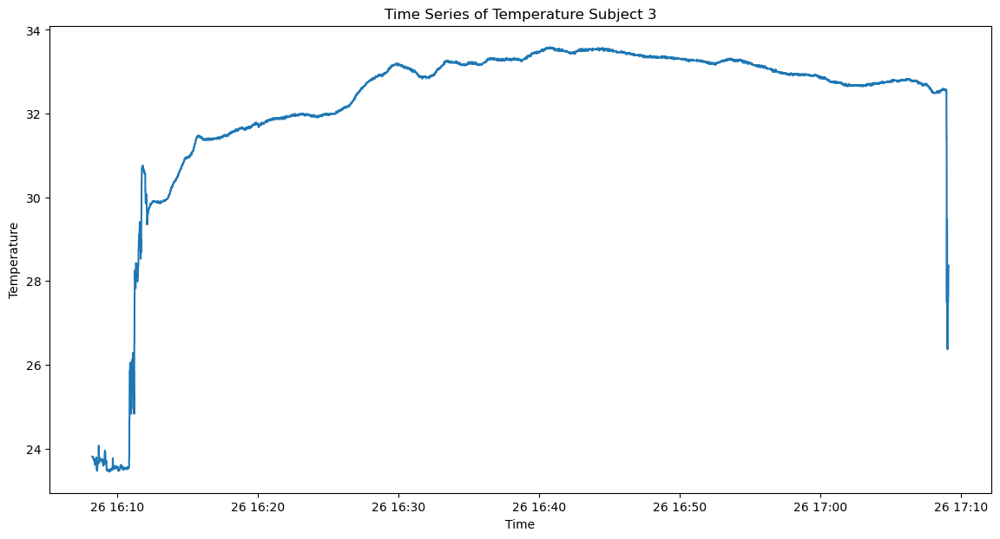

,TEMP,Time
count,14616.000000,14616
mean,32.183016,2021-11-26 16:38:39.875000064
min,23.450000,2021-11-26 16:08:13
25%,31.950000,2021-11-26 16:23:26.437499904
50%,32.890000,2021-11-26 16:38:39.875000064
75%,33.270000,2021-11-26 16:53:53.312499968
max,33.590000,2021-11-26 17:09:06.750000
std,2.127962,NaN


Duration: 0 days 01:00:53.750000


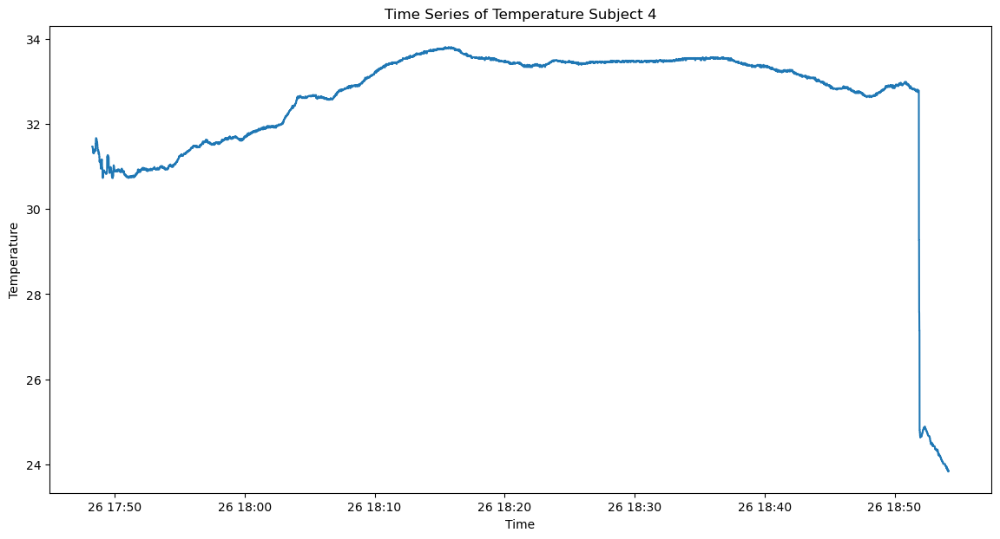

,TEMP,Time
count,15808.000000,15808
mean,32.525339,2021-11-26 18:21:12.874999808
min,23.830000,2021-11-26 17:48:17
25%,31.950000,2021-11-26 18:04:44.937499904
50%,33.150000,2021-11-26 18:21:12.875000064
75%,33.470000,2021-11-26 18:37:40.812500224
max,33.810000,2021-11-26 18:54:08.750000
std,1.757955,NaN


Duration: 0 days 01:05:51.750000


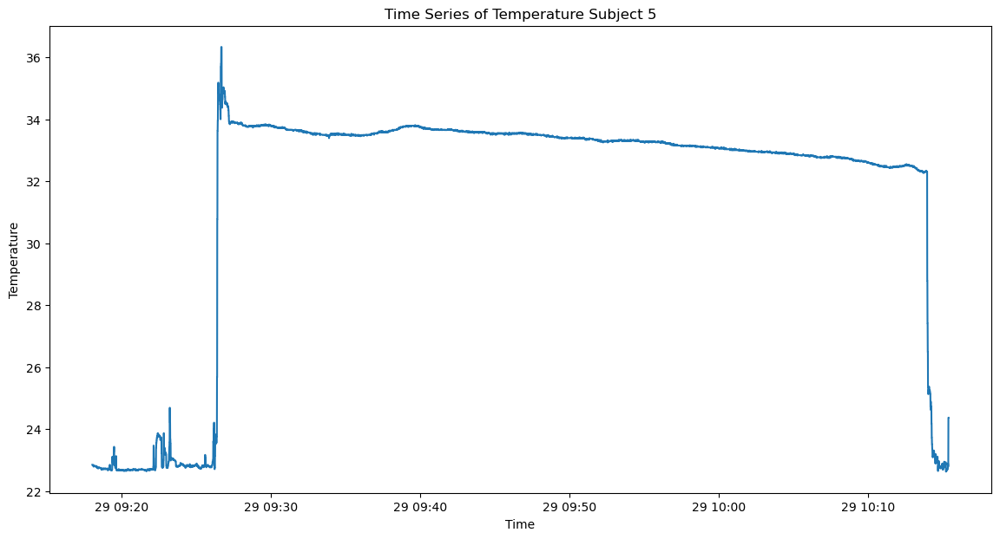

,TEMP,Time
count,13768.000000,13768
mean,31.531488,2021-11-29 09:46:41.874999808
min,22.630000,2021-11-29 09:18:01
25%,32.650000,2021-11-29 09:32:21.437499904
50%,33.270000,2021-11-29 09:46:41.875000064
75%,33.550000,2021-11-29 10:01:02.312499968
max,36.330000,2021-11-29 10:15:22.750000
std,3.919774,NaN


Duration: 0 days 00:57:21.750000


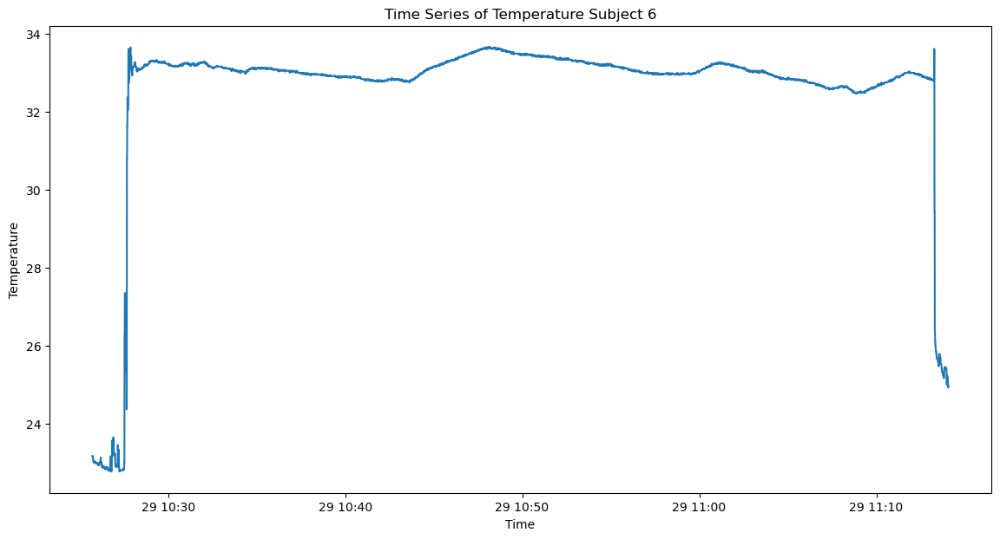

,TEMP,Time
count,11608.000000,11608
mean,32.539076,2021-11-29 10:49:53.874999808
min,22.770000,2021-11-29 10:25:43
25%,32.840000,2021-11-29 10:37:48.437499904
50%,33.030000,2021-11-29 10:49:53.875000064
75%,33.210000,2021-11-29 11:01:59.312499968
max,33.660000,2021-11-29 11:14:04.750000
std,2.166456,NaN


Duration: 0 days 00:48:21.750000


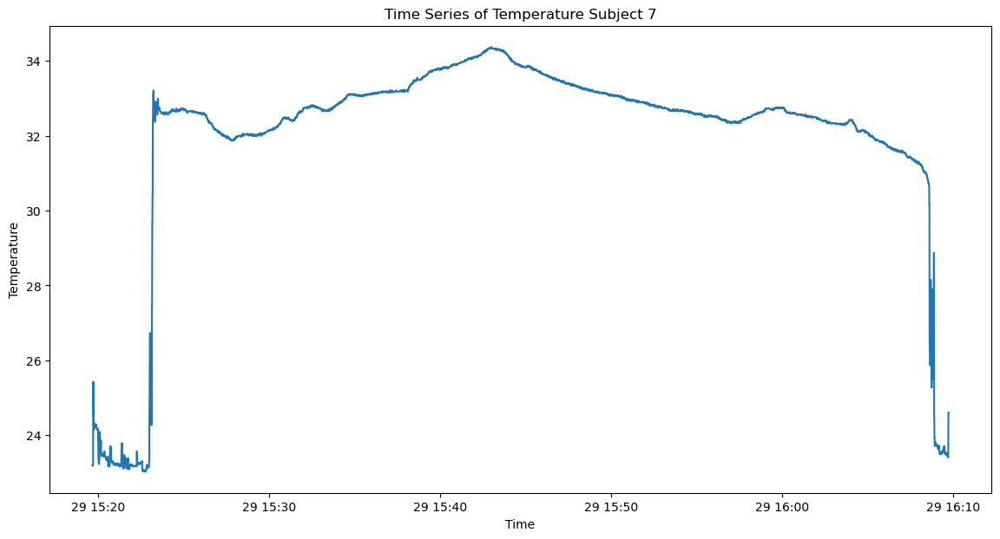

,TEMP,Time
count,12016.000000,12016
mean,31.965576,2021-11-29 15:44:41.874999808
min,23.030000,2021-11-29 15:19:40
25%,32.210000,2021-11-29 15:32:10.937499904
50%,32.650000,2021-11-29 15:44:41.875000064
75%,33.160000,2021-11-29 15:57:12.812500224
max,34.370000,2021-11-29 16:09:43.750000
std,2.735289,NaN


Duration: 0 days 00:50:03.750000


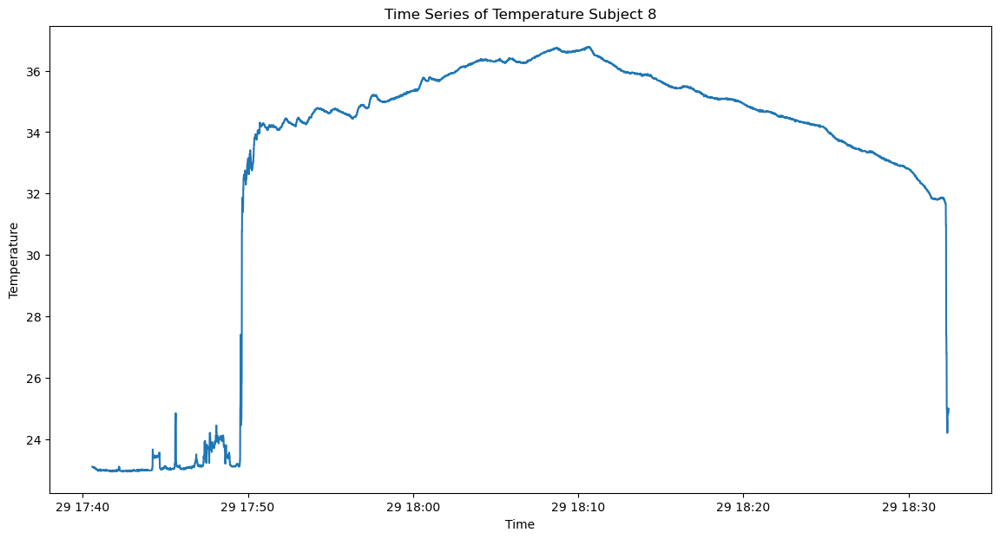

,TEMP,Time
count,12440.000000,12440
mean,32.858579,2021-11-29 18:06:29.874999808
min,22.950000,2021-11-29 17:40:35
25%,33.000000,2021-11-29 17:53:32.437499904
50%,34.670000,2021-11-29 18:06:29.875000064
75%,35.750000,2021-11-29 18:19:27.312499968
max,36.770000,2021-11-29 18:32:24.750000
std,4.599967,NaN


Duration: 0 days 00:51:49.750000


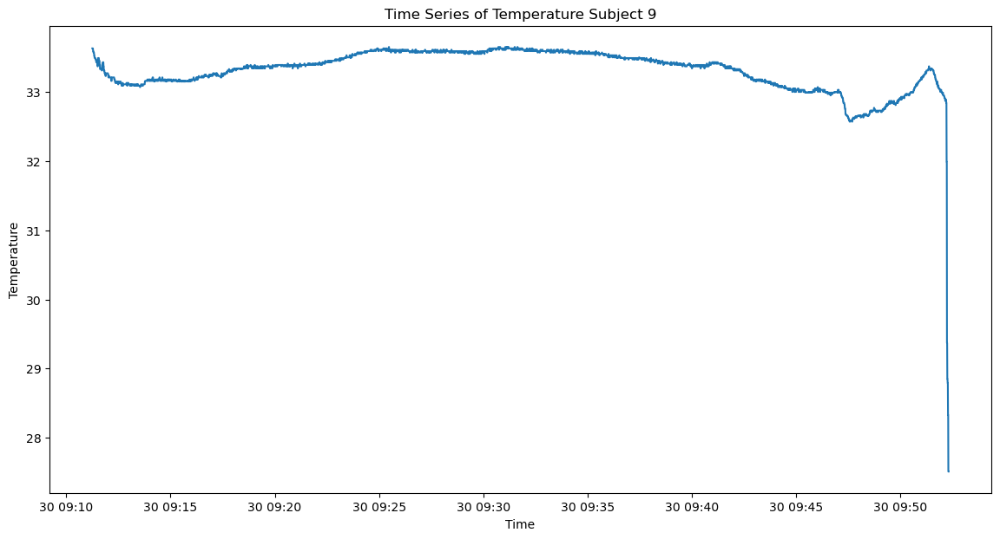

,TEMP,Time
count,9856.000000,9856
mean,33.316696,2021-11-30 09:31:46.875000064
min,27.510000,2021-11-30 09:11:15
25%,33.160000,2021-11-30 09:21:30.937499904
50%,33.390000,2021-11-30 09:31:46.875000064
75%,33.570000,2021-11-30 09:42:02.812500224
max,33.650000,2021-11-30 09:52:18.750000
std,0.334615,NaN


Duration: 0 days 00:41:03.750000


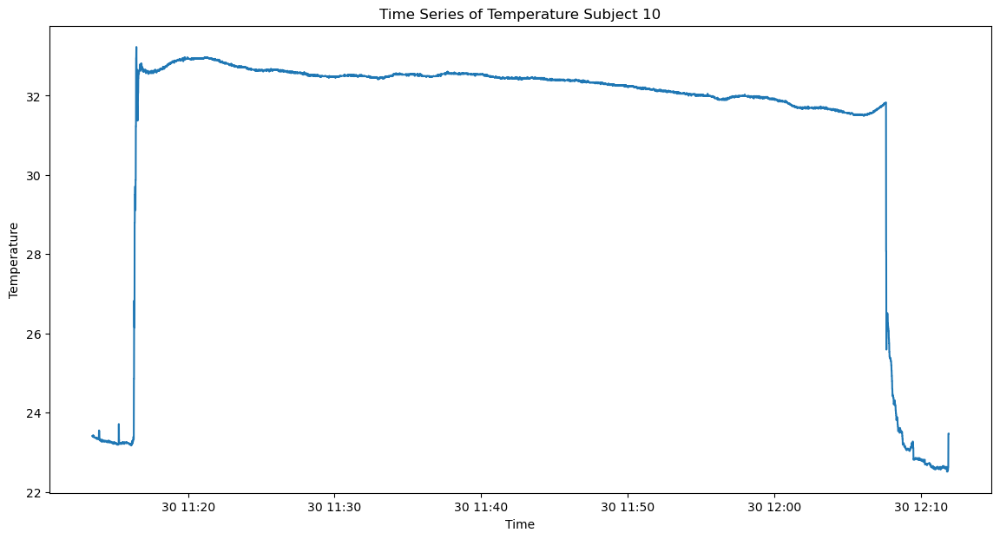

,TEMP,Time
count,14024.000000,14024
mean,31.212108,2021-11-30 11:42:40.874999808
min,22.510000,2021-11-30 11:13:28
25%,31.870000,2021-11-30 11:28:04.437499904
50%,32.390000,2021-11-30 11:42:40.875000064
75%,32.530000,2021-11-30 11:57:17.312499968
max,33.230000,2021-11-30 12:11:53.750000
std,2.993898,NaN


Duration: 0 days 00:58:25.750000


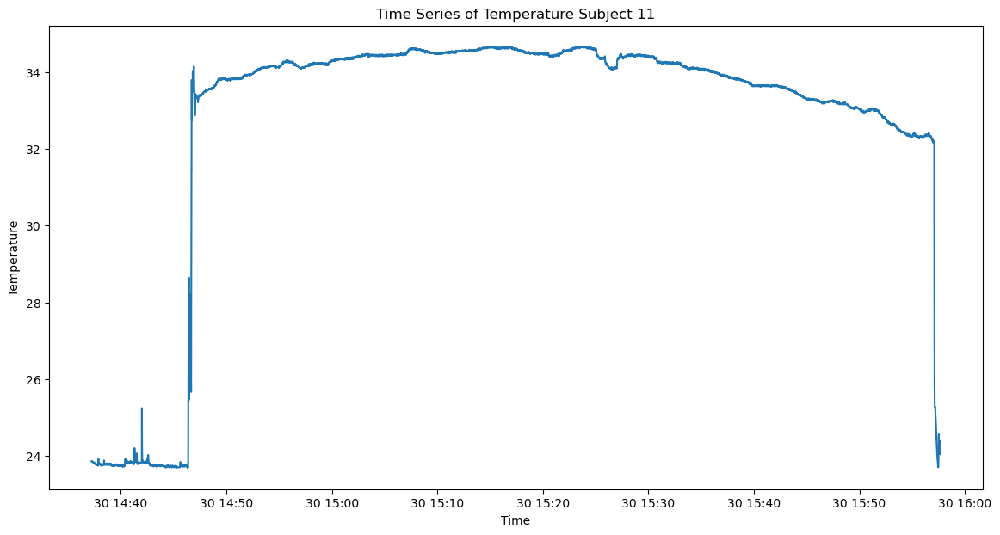

,TEMP,Time
count,19312.000000,19312
mean,32.722939,2021-11-30 15:17:26.874999808
min,23.690000,2021-11-30 14:37:13
25%,33.230000,2021-11-30 14:57:19.937499904
50%,34.110000,2021-11-30 15:17:26.875000064
75%,34.430000,2021-11-30 15:37:33.812500224
max,34.660000,2021-11-30 15:57:40.750000
std,3.380478,NaN


Duration: 0 days 01:20:27.750000


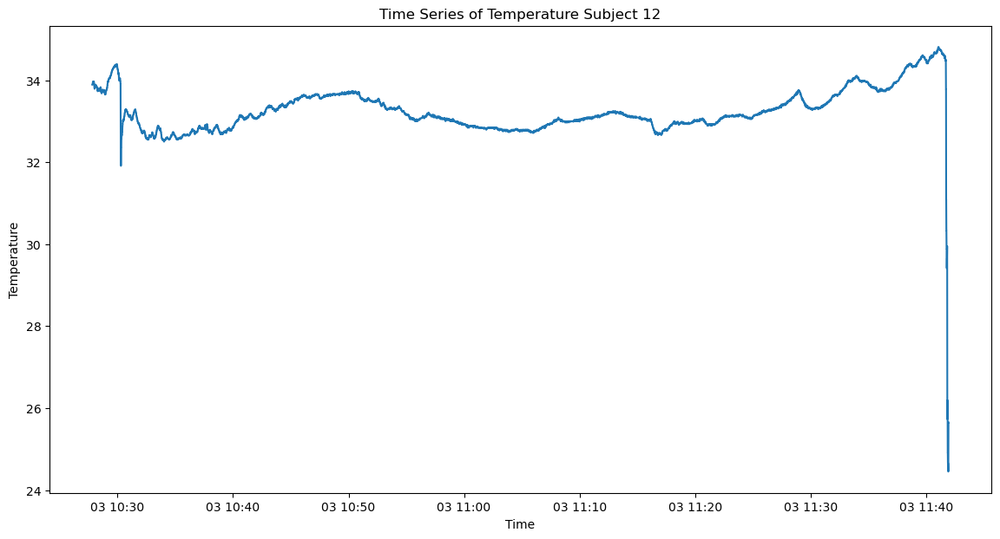

,TEMP,Time
count,17792.000000,17792
mean,33.246268,2021-12-03 11:04:52.874999808
min,24.450000,2021-12-03 10:27:49
25%,32.930000,2021-12-03 10:46:20.937499904
50%,33.130000,2021-12-03 11:04:52.875000064
75%,33.550000,2021-12-03 11:23:24.812500224
max,34.810000,2021-12-03 11:41:56.750000
std,0.581789,NaN


Duration: 0 days 01:14:07.750000


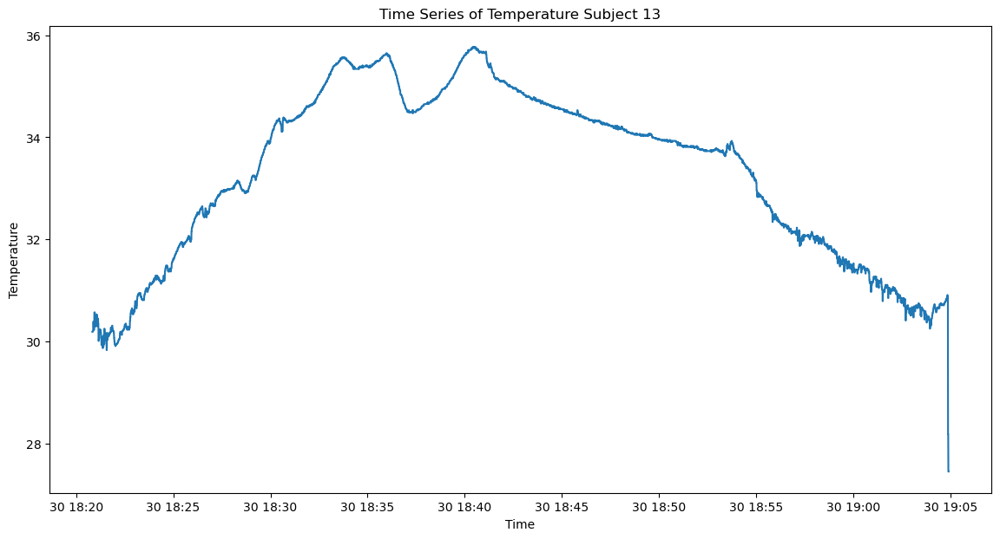

,TEMP,Time
count,10576.000000,10576
mean,33.319887,2021-11-30 18:42:51.874999808
min,27.450000,2021-11-30 18:20:50
25%,31.910000,2021-11-30 18:31:50.937499904
50%,33.810000,2021-11-30 18:42:51.875000064
75%,34.650000,2021-11-30 18:53:52.812500224
max,35.770000,2021-11-30 19:04:53.750000
std,1.664482,NaN


Duration: 0 days 00:44:03.750000


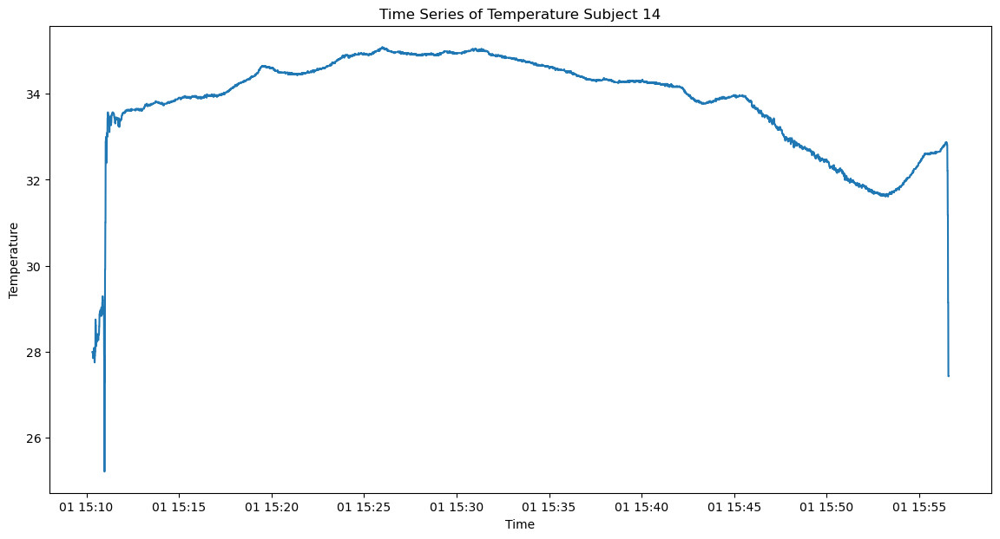

,TEMP,Time
count,11104.000000,11104
mean,33.849669,2021-12-01 15:33:26.874999808
min,25.210000,2021-12-01 15:10:19
25%,33.530000,2021-12-01 15:21:52.937499904
50%,34.210000,2021-12-01 15:33:26.875000064
75%,34.650000,2021-12-01 15:45:00.812500224
max,35.090000,2021-12-01 15:56:34.750000
std,1.174266,NaN


Duration: 0 days 00:46:15.750000


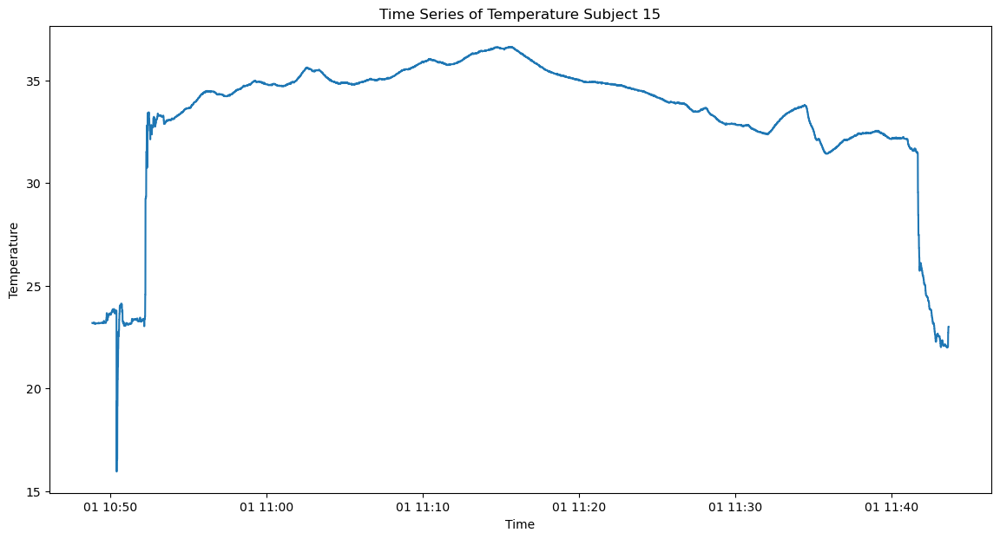

,TEMP,Time
count,13152.000000,13152
mean,33.219790,2021-12-01 11:16:14.874999808
min,15.950000,2021-12-01 10:48:51
25%,32.660000,2021-12-01 11:02:32.937499904
50%,34.370000,2021-12-01 11:16:14.875000064
75%,35.110000,2021-12-01 11:29:56.812500224
max,36.630000,2021-12-01 11:43:38.750000
std,3.506866,NaN


Duration: 0 days 00:54:47.750000


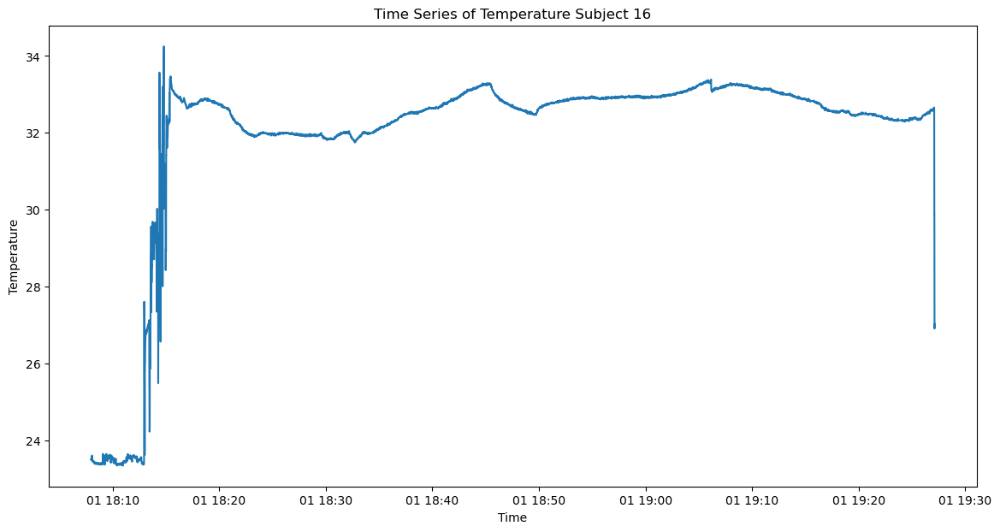

,TEMP,Time
count,19000.000000,19000
mean,31.963640,2021-12-01 18:47:32.874999808
min,23.350000,2021-12-01 18:07:58
25%,32.090000,2021-12-01 18:27:45.437499904
50%,32.650000,2021-12-01 18:47:32.875000064
75%,32.930000,2021-12-01 19:07:20.312499968
max,34.250000,2021-12-01 19:27:07.750000
std,2.347034,NaN


Duration: 0 days 01:19:09.750000


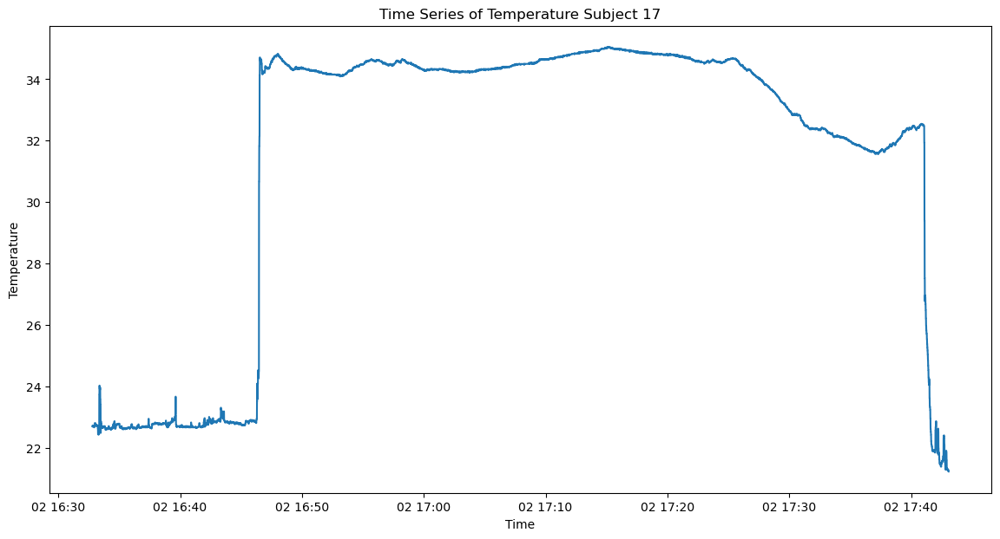

,TEMP,Time
count,16872.000000,16872
mean,31.506233,2021-12-02 17:07:55.874999808
min,21.230000,2021-12-02 16:32:47
25%,31.750000,2021-12-02 16:50:21.437499904
50%,34.270000,2021-12-02 17:07:55.875000064
75%,34.570000,2021-12-02 17:25:30.312499968
max,35.050000,2021-12-02 17:43:04.750000
std,4.768156,NaN


Duration: 0 days 01:10:17.750000


In [48]:
subject_temp_paths = [f'{weee_dataset_path}/{test_subject_id}/E4/TEMP.csv' for test_subject_id in subject_ids]

for id, subject_temp_path in enumerate(subject_temp_paths, 1):
    subject_temp_df = load_temp_csv(subject_temp_path)
    plot_temp_data(subject_temp_df, id)

### Aggregate to 1 Hz

In [49]:
def agg_temp_data(subject_id):
    subject_temp_path = f'{weee_dataset_path}/{subject_id}/E4/TEMP.csv'
    subject_temp_df = load_temp_csv(subject_temp_path)
    return subject_temp_df.set_index('Time').resample('1s').mean().reset_index()

In [50]:
test_subject_id = 'P01'
test_temp_agg_df = agg_temp_data(test_subject_id)
test_temp_agg_df

,Time,TEMP
0,2021-12-03 16:57:44,32.39
1,2021-12-03 16:57:45,32.39
2,2021-12-03 16:57:46,32.39
3,2021-12-03 16:57:47,32.41
4,2021-12-03 16:57:48,32.39
...,...,...
2285,2021-12-03 17:35:49,31.95
2286,2021-12-03 17:35:50,31.93
2287,2021-12-03 17:35:51,30.69
2288,2021-12-03 17:35:52,28.27


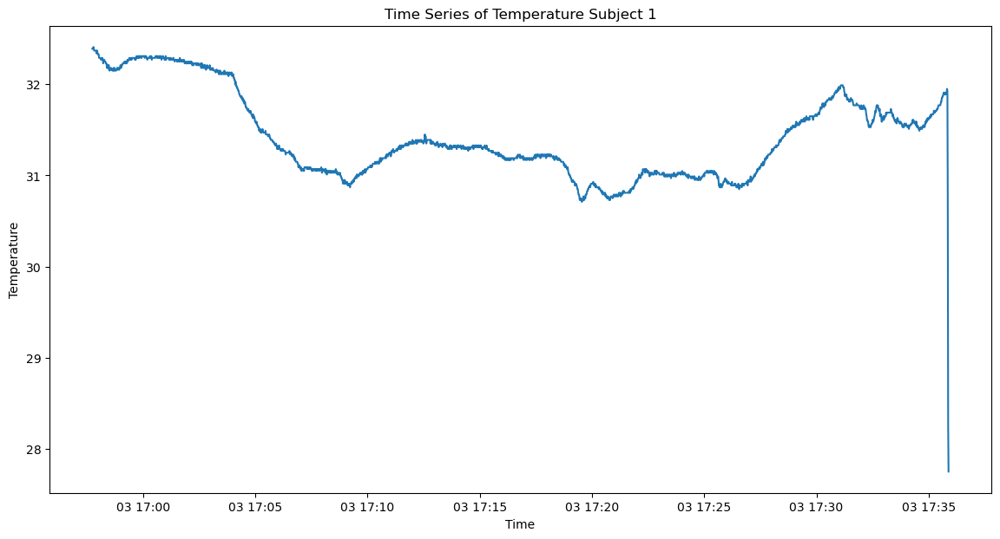

,Time,TEMP
count,2290,2290.000000
mean,2021-12-03 17:16:48.499999744,31.423319
min,2021-12-03 16:57:44,27.750000
25%,2021-12-03 17:07:16.249999872,31.050000
50%,2021-12-03 17:16:48.500000,31.310000
75%,2021-12-03 17:26:20.750000128,31.730000
max,2021-12-03 17:35:53,32.410000
std,NaN,0.469408


Duration: 0 days 00:38:09


In [51]:
plot_temp_data(test_temp_agg_df)

# VO2 Mask

### Methods

In [54]:
def load_vo2_csv(path):
    df = pd.read_csv(path)
    data = df[[
        'VO2[mL/kg/min]',
        'VO2[mL/min]',
        'HR[bpm]',
        'Time',
        'Time[s]'
    ]].copy()
    data['Time'] = pd.to_datetime(data['Time'])
    return data

In [55]:
test_vo2_path = f'{weee_dataset_path}/{test_subject_id}/VO2/DataAverage.csv'

test_vo2_df = load_vo2_csv(test_vo2_path)
test_vo2_df

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
0,0.00,0.00,101,2021-12-03 16:58:51,1
1,0.00,0.00,101,2021-12-03 16:58:52,2
2,6.81,470.17,101,2021-12-03 16:58:53,3
3,6.81,470.17,100,2021-12-03 16:58:54,4
4,7.12,491.33,100,2021-12-03 16:58:55,5
...,...,...,...,...,...
1798,13.34,920.33,167,2021-12-03 17:28:49,1799
1799,13.34,920.33,167,2021-12-03 17:28:50,1800
1800,18.72,1291.50,167,2021-12-03 17:28:51,1801
1801,0.00,0.00,167,2021-12-03 17:28:52,1802


In [56]:
test_vo2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1803 entries, 0 to 1802
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   VO2[mL/kg/min]  1802 non-null   float64       
 1   VO2[mL/min]     1802 non-null   float64       
 2   HR[bpm]         1803 non-null   int64         
 3   Time            1803 non-null   datetime64[ns]
 4   Time[s]         1803 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(2)
memory usage: 70.6 KB


In [57]:
def plot_vo2_data(df, subject_id=1):
    fig, axs = plt.subplots(1, 2, figsize=(20, 7))

    axs[0].plot(df['Time'], df['VO2[mL/min]'], label='VO2[mL/min]')
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('VO2')
    axs[0].set_title(f'Time Series of VO2 Subject {subject_id}')
    axs[0].legend()

    axs[1].plot(df['Time'], df['HR[bpm]'], label='HR[bpm]')
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('HR')
    axs[1].set_title(f'Time Series of HR Subject {subject_id}')
    axs[1].legend()

    plt.show()

    display(df.describe())

    print(f'Duration: {df["Time"].iloc[-1] - df["Time"].iloc[0]}')

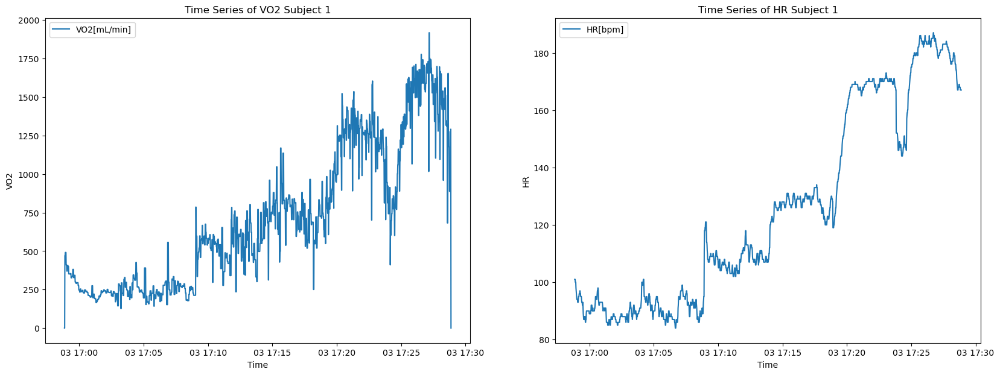

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1802.000000,1802.000000,1803.000000,1803,1803.000000
mean,10.257863,707.798246,125.412646,2021-12-03 17:13:52,902.000000
min,0.000000,0.000000,84.000000,2021-12-03 16:58:51,1.000000
25%,3.992500,275.377500,93.000000,2021-12-03 17:06:21.500000,451.500000
50%,8.790000,606.665000,118.000000,2021-12-03 17:13:52,902.000000
75%,15.425000,1064.250000,167.000000,2021-12-03 17:21:22.500000,1352.500000
max,27.800000,1918.000000,187.000000,2021-12-03 17:28:53,1803.000000
std,6.664957,459.868477,33.820993,NaN,520.625585


Duration: 0 days 00:30:02


In [58]:
plot_vo2_data(test_vo2_df)

### Plot VO2 & HRs

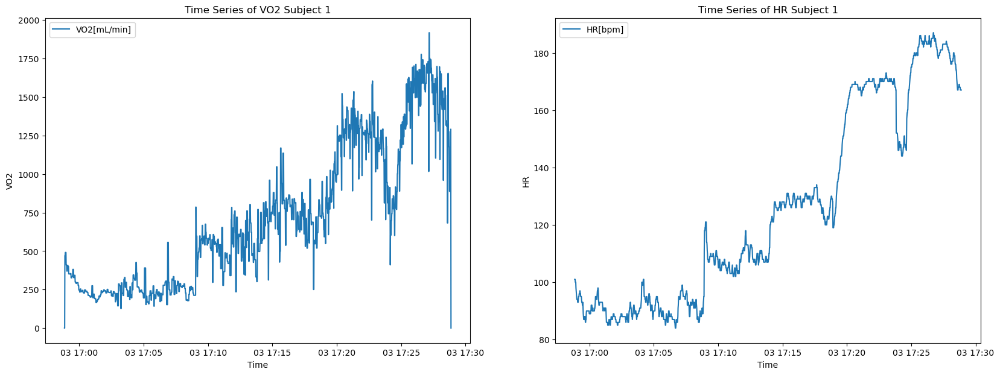

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1802.000000,1802.000000,1803.000000,1803,1803.000000
mean,10.257863,707.798246,125.412646,2021-12-03 17:13:52,902.000000
min,0.000000,0.000000,84.000000,2021-12-03 16:58:51,1.000000
25%,3.992500,275.377500,93.000000,2021-12-03 17:06:21.500000,451.500000
50%,8.790000,606.665000,118.000000,2021-12-03 17:13:52,902.000000
75%,15.425000,1064.250000,167.000000,2021-12-03 17:21:22.500000,1352.500000
max,27.800000,1918.000000,187.000000,2021-12-03 17:28:53,1803.000000
std,6.664957,459.868477,33.820993,NaN,520.625585


Duration: 0 days 00:30:02


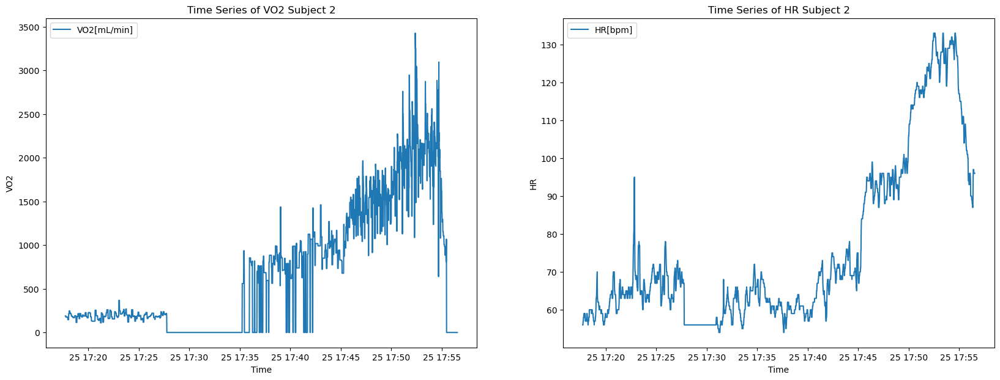

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,2147.000000,2147.000000,2148.000000,2148,2148.000000
mean,9.818850,736.413866,77.810521,2021-11-25 17:37:48.041899520,640.339851
min,0.000000,0.000000,54.000000,2021-11-25 17:17:43,1.000000
25%,2.110000,158.000000,61.000000,2021-11-25 17:26:39.750000128,269.000000
50%,7.930000,595.000000,68.000000,2021-11-25 17:38:39.500000,537.500000
75%,16.020000,1201.500000,93.000000,2021-11-25 17:47:36.249999872,1007.250000
max,45.700000,3427.330000,133.000000,2021-11-25 17:56:33,1544.000000
std,9.768042,732.595192,22.500964,NaN,442.818440


Duration: 0 days 00:38:50


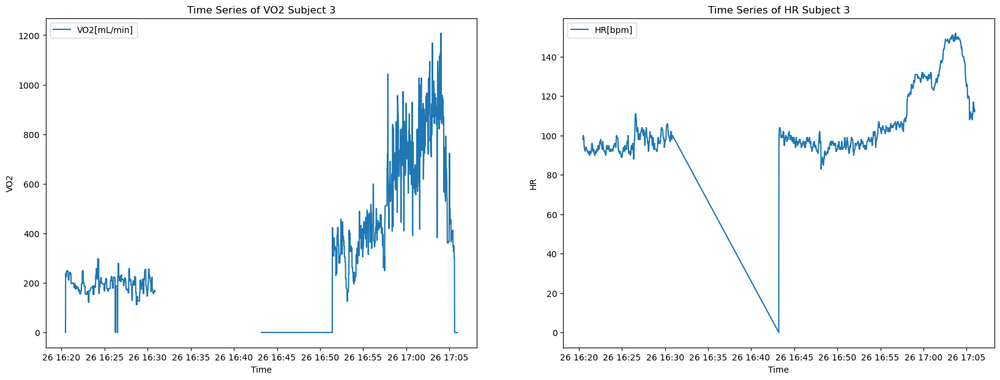

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1990.000000,1990.000000,1992.000000,1992,1992.000000
mean,4.946884,301.753131,105.507028,2021-11-26 16:45:29.264056320,567.224900
min,0.000000,0.000000,0.000000,2021-11-26 16:20:27,1.000000
25%,0.000000,0.000000,94.000000,2021-11-26 16:28:44.750000128,249.750000
50%,3.510000,214.000000,98.000000,2021-11-26 16:49:21.500000,498.500000
75%,7.150000,436.330000,108.000000,2021-11-26 16:57:39.249999872,868.250000
max,19.800000,1208.000000,152.000000,2021-11-26 17:05:57,1366.000000
std,4.683996,285.726115,16.886091,NaN,382.711815


Duration: 0 days 00:45:30


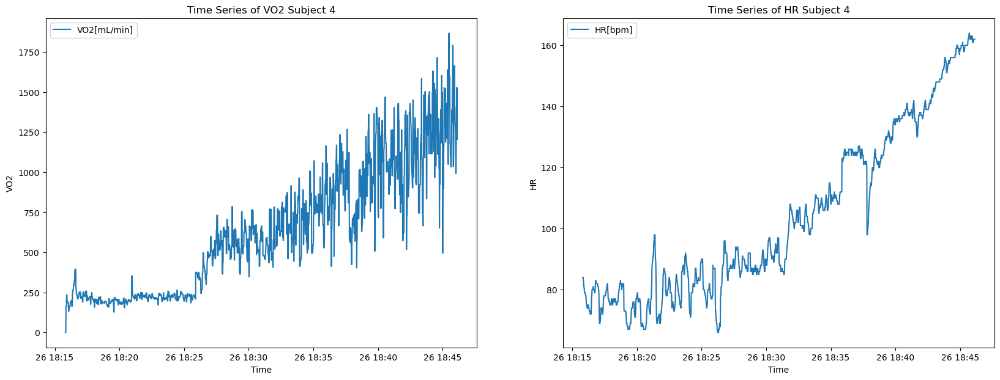

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1820.000000,1820.000000,1820.000000,1820,1820.000000
mean,9.281401,626.485637,103.990659,2021-11-26 18:30:58.500000,910.500000
min,0.000000,0.000000,66.000000,2021-11-26 18:15:49,1.000000
25%,3.430000,231.500000,81.000000,2021-11-26 18:23:23.750000128,455.750000
50%,8.520000,575.170000,94.000000,2021-11-26 18:30:58.500000,910.500000
75%,13.370000,902.415000,125.000000,2021-11-26 18:38:33.249999872,1365.250000
max,27.670000,1867.670000,164.000000,2021-11-26 18:46:08,1820.000000
std,5.800503,391.519566,27.461091,NaN,525.533063


Duration: 0 days 00:30:19


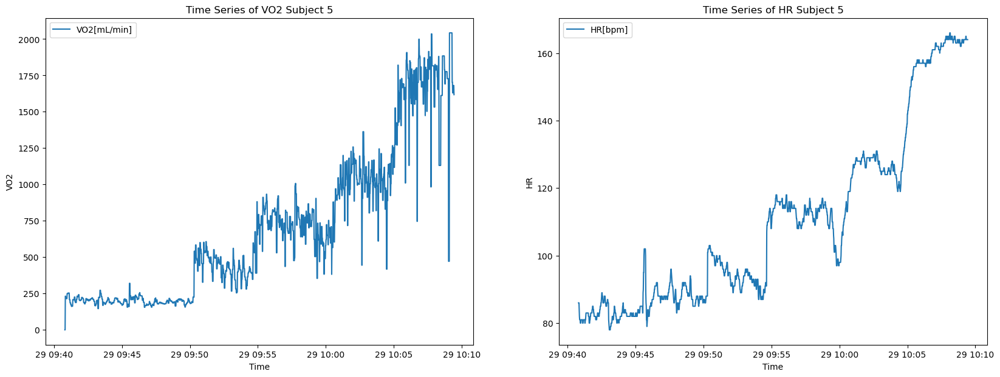

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1719.000000,1719.000000,1719.000000,1719,1719.000000
mean,10.490948,692.410471,110.112275,2021-11-29 09:55:07.000000256,860.000000
min,0.000000,0.000000,78.000000,2021-11-29 09:40:48,1.000000
25%,3.225000,212.920000,88.000000,2021-11-29 09:47:57.500000,430.500000
50%,8.360000,552.000000,103.000000,2021-11-29 09:55:07,860.000000
75%,14.980000,989.000000,126.000000,2021-11-29 10:02:16.500000,1289.500000
max,30.950000,2042.500000,166.000000,2021-11-29 10:09:26,1719.000000
std,7.896909,521.176453,26.141966,NaN,496.376873


Duration: 0 days 00:28:38


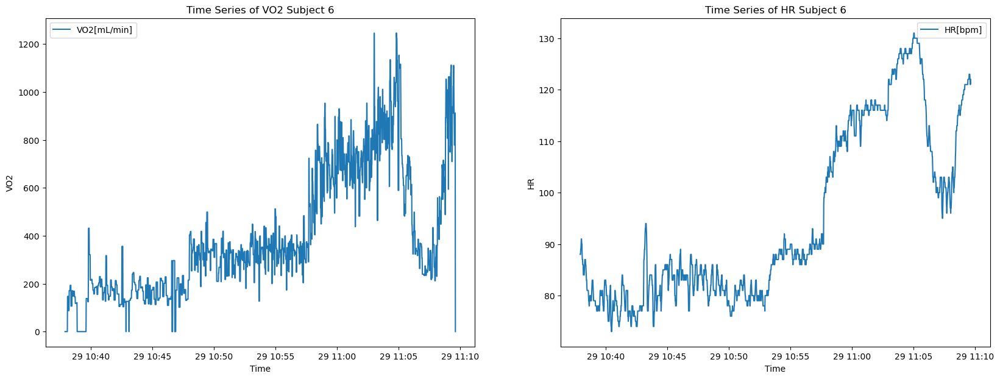

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1903.000000,1903.000000,1904.000000,1904,1904.000000
mean,4.008833,399.705439,94.650735,2021-11-29 10:53:46.500000,952.500000
min,0.000000,0.000000,73.000000,2021-11-29 10:37:55,1.000000
25%,2.005000,199.750000,81.000000,2021-11-29 10:45:50.750000128,476.750000
50%,3.350000,334.330000,87.000000,2021-11-29 10:53:46.500000,952.500000
75%,5.945000,593.000000,111.000000,2021-11-29 11:01:42.249999872,1428.250000
max,12.500000,1245.830000,131.000000,2021-11-29 11:09:38,1904.000000
std,2.650429,264.233436,16.774144,NaN,549.781775


Duration: 0 days 00:31:43


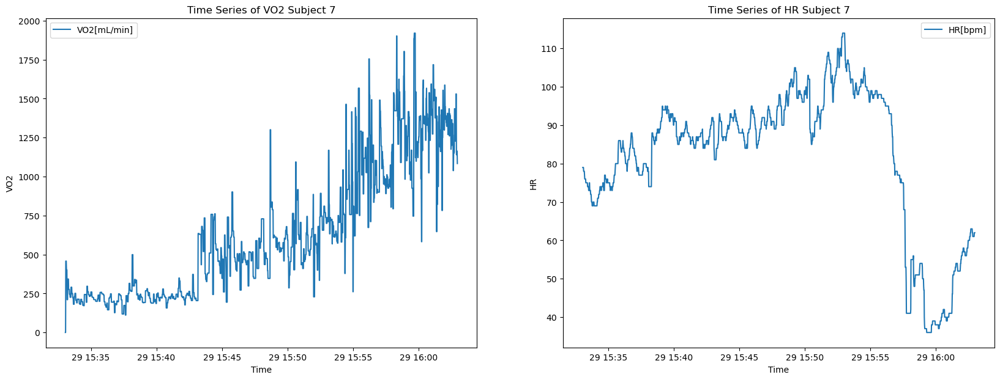

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1796.000000,1796.000000,1796.000000,1796,1796.000000
mean,8.927249,633.829209,82.048441,2021-11-29 15:48:00.500000,898.500000
min,0.000000,0.000000,36.000000,2021-11-29 15:33:03,1.000000
25%,3.460000,245.830000,75.000000,2021-11-29 15:40:31.750000128,449.750000
50%,7.500000,532.330000,87.000000,2021-11-29 15:48:00.500000,898.500000
75%,12.910000,916.500000,94.000000,2021-11-29 15:55:29.249999872,1347.250000
max,27.050000,1920.330000,114.000000,2021-11-29 16:02:58,1796.000000
std,5.976552,424.333250,18.659846,NaN,518.604859


Duration: 0 days 00:29:55


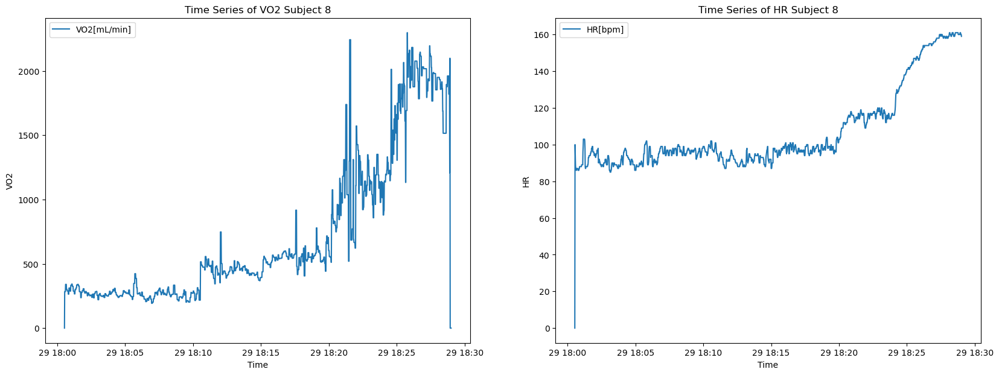

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1709.000000,1709.000000,1710.000000,1710,1710.000000
mean,7.214985,719.354658,106.832164,2021-11-29 18:14:46.500000256,855.500000
min,0.000000,0.000000,0.000000,2021-11-29 18:00:32,1.000000
25%,2.820000,281.330000,93.000000,2021-11-29 18:07:39.249999872,428.250000
50%,4.870000,485.170000,97.000000,2021-11-29 18:14:46.500000,855.500000
75%,10.400000,1037.000000,115.000000,2021-11-29 18:21:53.750000128,1282.750000
max,23.040000,2296.670000,161.000000,2021-11-29 18:29:01,1710.000000
std,5.778437,576.106005,21.970096,NaN,493.778797


Duration: 0 days 00:28:29


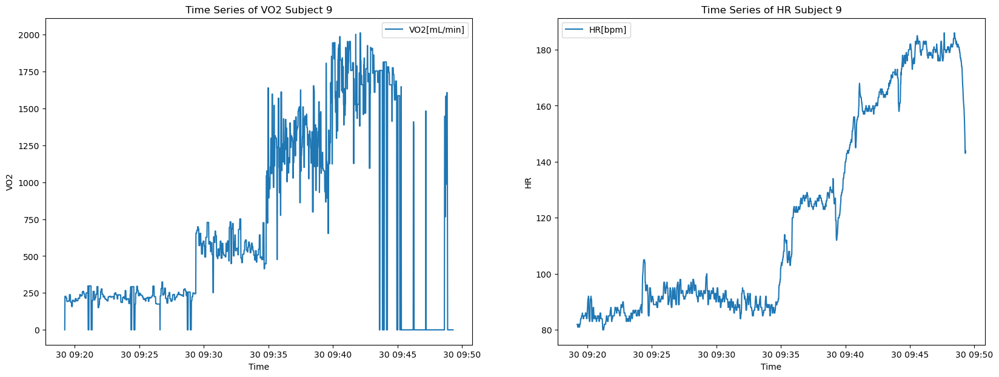

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1806.000000,1806.000000,1807.000000,1807,1807.000000
mean,8.910172,677.184568,119.830105,2021-11-30 09:34:15.999999744,904.000000
min,0.000000,0.000000,80.000000,2021-11-30 09:19:13,1.000000
25%,2.790000,211.670000,89.000000,2021-11-30 09:26:44.500000,452.500000
50%,6.390000,485.670000,97.000000,2021-11-30 09:34:16,904.000000
75%,16.350000,1242.330000,159.000000,2021-11-30 09:41:47.500000,1355.500000
max,26.470000,2011.830000,186.000000,2021-11-30 09:49:19,1807.000000
std,8.151708,619.525852,36.337678,NaN,521.780286


Duration: 0 days 00:30:06


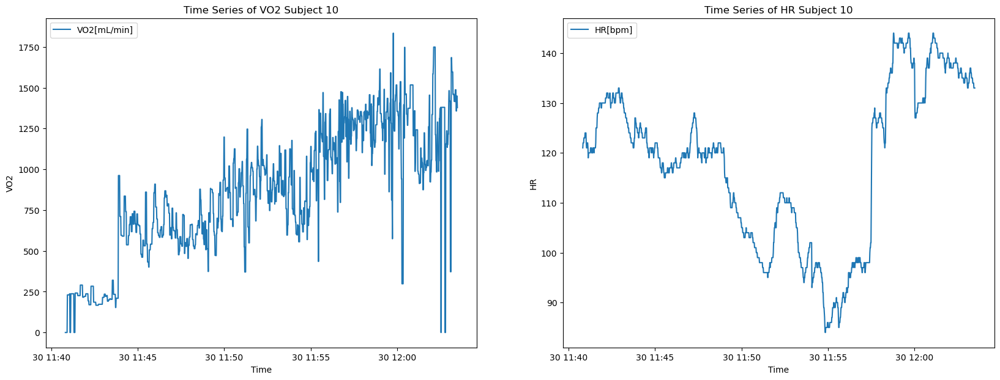

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1360.000000,1360.000000,1361.000000,1361,1361.000000
mean,9.792096,851.898015,117.671565,2021-11-30 11:52:09,681.000000
min,0.000000,0.000000,84.000000,2021-11-30 11:40:49,1.000000
25%,6.790000,590.330000,103.000000,2021-11-30 11:46:29,341.000000
50%,9.850000,856.670000,120.000000,2021-11-30 11:52:09,681.000000
75%,13.502500,1174.545000,130.000000,2021-11-30 11:57:49,1021.000000
max,21.090000,1834.670000,144.000000,2021-11-30 12:03:29,1361.000000
std,4.535769,394.614673,15.844423,NaN,393.031169


Duration: 0 days 00:22:40


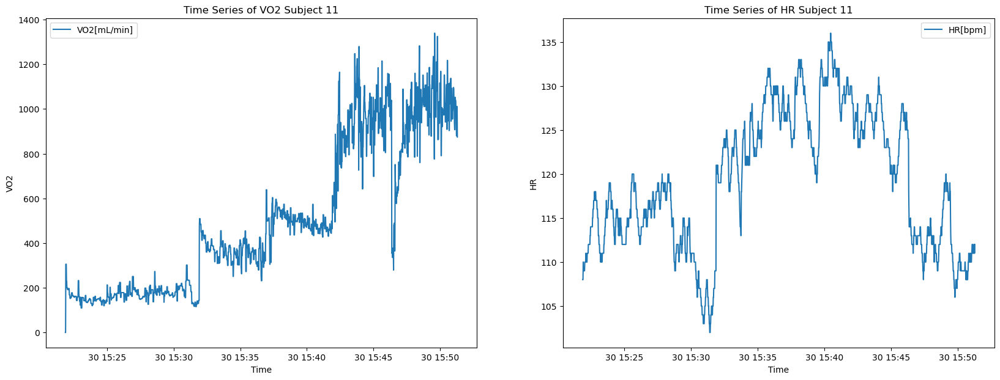

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1765.000000,1765.000000,1764.000000,1765,1765.00000
mean,9.452844,503.830453,119.277778,2021-11-30 15:36:35,883.00000
min,0.000000,0.000000,102.000000,2021-11-30 15:21:53,1.00000
25%,3.520000,187.500000,113.000000,2021-11-30 15:29:14,442.00000
50%,7.930000,422.500000,119.000000,2021-11-30 15:36:35,883.00000
75%,15.710000,837.500000,126.000000,2021-11-30 15:43:56,1324.00000
max,25.130000,1339.170000,136.000000,2021-11-30 15:51:17,1765.00000
std,6.281244,334.793681,7.722127,NaN,509.65593


Duration: 0 days 00:29:24


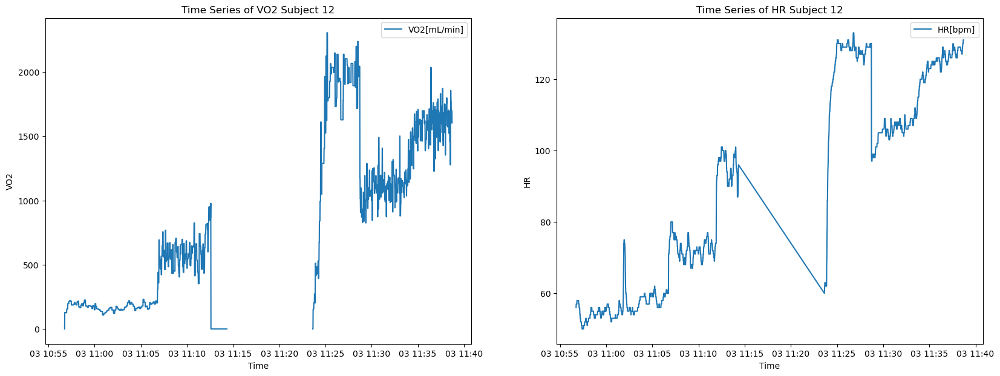

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1961.000000,1961.000000,1961.000000,1962,1962.000000
mean,12.978842,817.641866,89.976543,2021-12-03 11:17:22.707951104,493.866972
min,0.000000,0.000000,50.000000,2021-12-03 10:56:45,1.000000
25%,2.860000,180.170000,59.000000,2021-12-03 11:04:55.249999872,246.000000
50%,10.250000,645.670000,93.000000,2021-12-03 11:13:05.500000,491.000000
75%,22.310000,1405.500000,121.000000,2021-12-03 11:30:32.750000128,736.000000
max,36.570000,2304.000000,133.000000,2021-12-03 11:38:43,1056.000000
std,10.474424,659.888305,28.863533,NaN,288.172297


Duration: 0 days 00:41:58


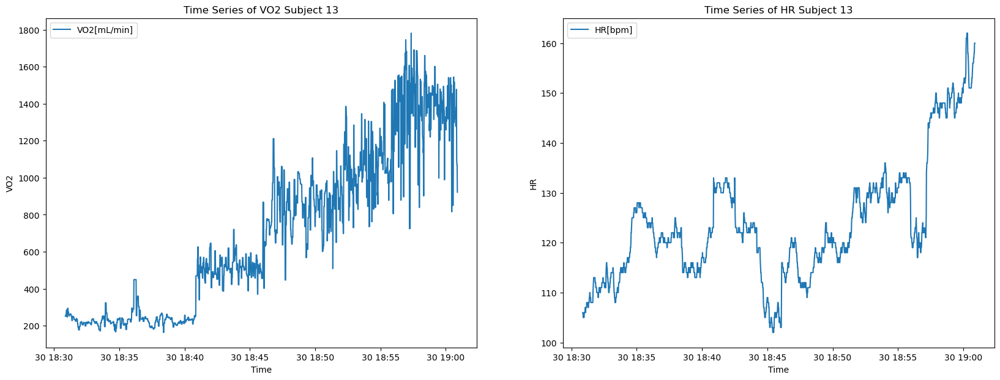

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1802.000000,1802.000000,1802.000000,1802,1802.00000
mean,9.785910,696.750622,123.665927,2021-11-30 18:45:52.500000,901.50000
min,2.290000,163.330000,102.000000,2021-11-30 18:30:52,1.00000
25%,3.410000,242.710000,115.000000,2021-11-30 18:38:22.249999872,451.25000
50%,8.610000,613.000000,122.000000,2021-11-30 18:45:52.500000,901.50000
75%,14.307500,1018.622500,130.000000,2021-11-30 18:53:22.750000128,1351.75000
max,25.030000,1781.830000,162.000000,2021-11-30 19:00:53,1802.00000
std,6.079517,432.866366,12.038318,NaN,520.33691


Duration: 0 days 00:30:01


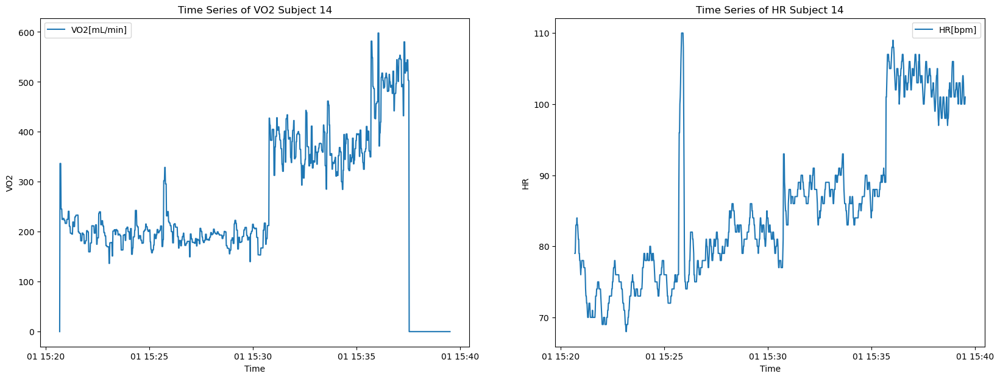

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1130.000000,1130.000000,1131.000000,1131,1131.000000
mean,4.414938,249.866796,85.564987,2021-12-01 15:30:06,566.000000
min,0.000000,0.000000,68.000000,2021-12-01 15:20:41,1.000000
25%,3.220000,182.500000,77.000000,2021-12-01 15:25:23.500000,283.500000
50%,3.650000,206.330000,84.000000,2021-12-01 15:30:06,566.000000
75%,6.350000,359.330000,90.000000,2021-12-01 15:34:48.500000,848.500000
max,10.560000,597.830000,110.000000,2021-12-01 15:39:31,1131.000000
std,2.425502,137.280978,10.675005,NaN,326.635883


Duration: 0 days 00:18:50


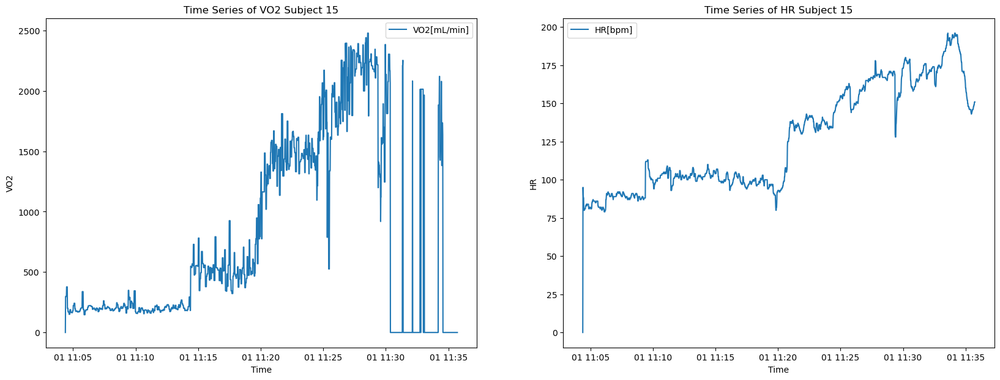

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1881.000000,1881.000000,1882.000000,1882,1882.000000
mean,9.505768,771.855375,126.194474,2021-12-01 11:20:03.499999744,941.500000
min,0.000000,0.000000,0.000000,2021-12-01 11:04:23,1.000000
25%,2.280000,185.170000,98.000000,2021-12-01 11:12:13.249999872,471.250000
50%,5.300000,430.330000,107.000000,2021-12-01 11:20:03.500000,941.500000
75%,18.000000,1462.000000,160.000000,2021-12-01 11:27:53.750000128,1411.750000
max,30.520000,2478.000000,196.000000,2021-12-01 11:35:44,1882.000000
std,9.428451,765.564790,34.002977,NaN,543.430922


Duration: 0 days 00:31:21


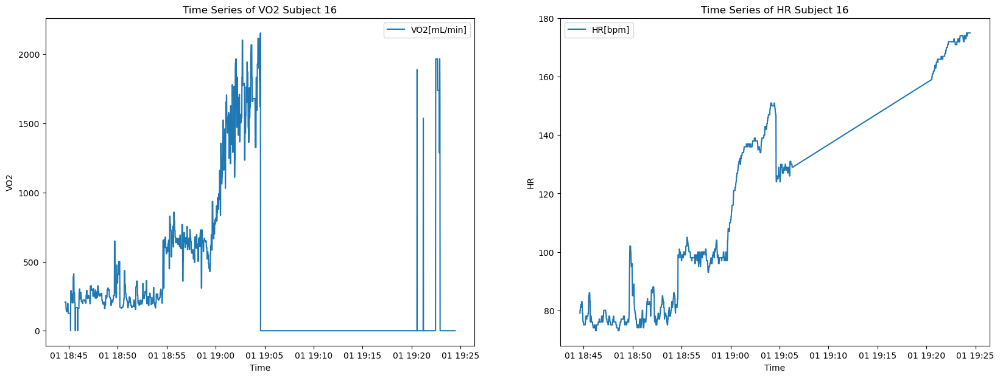

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1541.000000,1541.000000,1541.000000,1541,1541.000000
mean,7.275964,531.891389,110.696950,2021-12-01 18:59:37.726800640,570.449708
min,0.000000,0.000000,73.000000,2021-12-01 18:44:37,1.000000
25%,2.310000,168.500000,79.000000,2021-12-01 18:51:02,193.000000
50%,3.710000,271.500000,99.000000,2021-12-01 18:57:27,534.000000
75%,9.260000,676.830000,136.000000,2021-12-01 19:03:52,919.000000
max,29.470000,2154.500000,175.000000,2021-12-01 19:24:27,1304.000000
std,7.752876,566.734207,33.559227,NaN,397.205190


Duration: 0 days 00:39:50


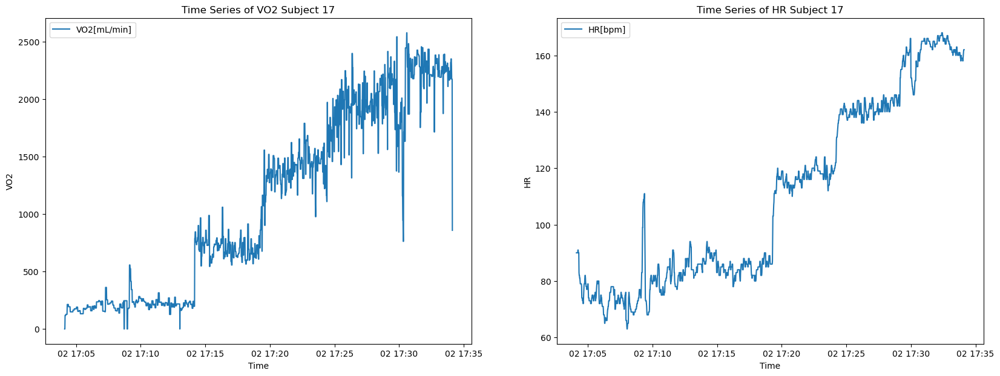

,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time,Time[s]
count,1801.000000,1801.000000,1801.000000,1801,1801.000000
mean,14.105586,1088.953853,109.886730,2021-12-02 17:19:07,901.000000
min,0.000000,0.000000,63.000000,2021-12-02 17:04:07,1.000000
25%,3.030000,234.170000,82.000000,2021-12-02 17:11:37,451.000000
50%,11.670000,901.000000,96.000000,2021-12-02 17:19:07,901.000000
75%,24.230000,1870.330000,141.000000,2021-12-02 17:26:37,1351.000000
max,33.400000,2578.830000,168.000000,2021-12-02 17:34:07,1801.000000
std,10.266226,792.550669,32.632354,NaN,520.048235


Duration: 0 days 00:30:00


In [59]:
subject_vo2_paths = [f'{weee_dataset_path}/{test_subject_id}/VO2/DataAverage.csv' for test_subject_id in subject_ids]

for id, subject_vo2_path in enumerate(subject_vo2_paths, 1):
    subject_vo2_df = load_vo2_csv(subject_vo2_path)
    plot_vo2_data(subject_vo2_df, id)

### Aggregate to 1 Hz (Already 1 Hz)

# Join data

In [98]:
def join_subject_data(subject_id):
    acc_df = agg_acc_data(subject_id)
    heart_rate_df = agg_heart_rate_data(subject_id)
    temp_df = agg_temp_data(subject_id)
    vo2_path = f'{weee_dataset_path}/{subject_id}/VO2/DataAverage.csv'
    vo2_df = load_vo2_csv(vo2_path)

    joined_df = acc_df.merge(heart_rate_df, on='Time', how='outer')
    joined_df = joined_df.merge(temp_df, on='Time', how='outer')
    joined_df = joined_df.merge(vo2_df, on='Time', how='outer')

    return joined_df

In [134]:
subject_data = {}
for subject_id in subject_ids:
    subject_data[subject_id] = join_subject_data(subject_id)

### Visualize Subject 1

In [62]:
joined_df_1 = subject_data['P01']
joined_df_1

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],HR[bpm],Time[s]
0,2021-12-03 16:57:44,21.625000,-0.093750,59.656250,89.740342,32.39,NaN,NaN,NaN,NaN
1,2021-12-03 16:57:45,14.968750,4.906250,61.000000,90.688804,32.39,NaN,NaN,NaN,NaN
2,2021-12-03 16:57:46,17.812500,6.812500,60.500000,63.750026,32.39,NaN,NaN,NaN,NaN
3,2021-12-03 16:57:47,16.437500,1.375000,60.562500,41.812265,32.41,NaN,NaN,NaN,NaN
4,2021-12-03 16:57:48,18.093750,0.968750,60.593750,84.533634,32.39,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2285,2021-12-03 17:35:49,4.000000,59.312500,9.281250,114.913870,31.95,NaN,NaN,NaN,NaN
2286,2021-12-03 17:35:50,2.750000,59.062500,7.718750,95.795740,31.93,NaN,NaN,NaN,NaN
2287,2021-12-03 17:35:51,31.968750,39.937500,36.656250,52.991904,30.69,NaN,NaN,NaN,NaN
2288,2021-12-03 17:35:52,40.857143,40.642857,25.428571,108.081866,28.27,NaN,NaN,NaN,NaN


In [63]:
joined_df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2290 entries, 0 to 2289
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Time            2290 non-null   datetime64[ns]
 1   X               2289 non-null   float64       
 2   Y               2289 non-null   float64       
 3   Z               2289 non-null   float64       
 4   heart_rate      2290 non-null   float64       
 5   TEMP            2290 non-null   float64       
 6   VO2[mL/kg/min]  1802 non-null   float64       
 7   VO2[mL/min]     1802 non-null   float64       
 8   HR[bpm]         1803 non-null   float64       
 9   Time[s]         1803 non-null   float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 179.0 KB


In [160]:
def normalize_data(df):
    df = df.copy()
    for column in df.columns:
        if column == 'Time':
            continue
        df[column] = (df[column] - df[column].mean()) / df[column].std()
    return df

In [158]:
def plot_normalized_data(df, subject_id=1):
    # Drop 'VO2[mL/kg/min]' column if it exists
    if 'VO2[mL/kg/min]' in df.columns:
        df = df.drop(columns=['VO2[mL/kg/min]'])
    
    # Normalize the data using mean and standard deviation
    normalized_df = normalize_data(df)
    
    # Plot the data
    fig, axs = plt.subplots(1, 3, figsize=(21, 7))

    # First graph: X, Y, Z, and VO2[mL/min] against time
    for column in ['X', 'Y', 'Z', 'VO2[mL/min]']:
        if column in normalized_df.columns:
            axs[0].plot(normalized_df['Time'], normalized_df[column], label=column)
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('Normalized Value')
    axs[0].set_title(f'X, Y, Z, and VO2[mL/min] for Subject {subject_id}')
    axs[0].legend()

    # Second graph: heart_rate and VO2[mL/min] against time
    for column in ['heart_rate', 'VO2[mL/min]']:
        if column in normalized_df.columns:
            axs[1].plot(normalized_df['Time'], normalized_df[column], label=column)
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('Normalized Value')
    axs[1].set_title(f'Heart Rate and VO2[mL/min] for Subject {subject_id}')
    axs[1].legend()

    # Third graph: TEMP and VO2[mL/min] against time
    for column in ['TEMP', 'VO2[mL/min]']:
        if column in normalized_df.columns:
            axs[2].plot(normalized_df['Time'], normalized_df[column], label=column)
    axs[2].set_xlabel('Time')
    axs[2].set_ylabel('Normalized Value')
    axs[2].set_title(f'Temperature and VO2[mL/min] for Subject {subject_id}')
    axs[2].legend()

    plt.tight_layout()
    plt.show()

    describe_df(normalized_df)

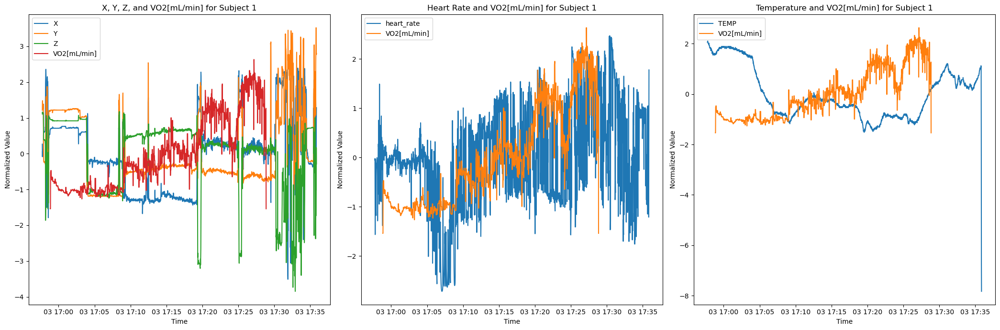

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,2290,2.289000e+03,2.289000e+03,2.289000e+03,2.290000e+03,2.290000e+03,1.802000e+03,1.803000e+03
mean,2021-12-03 17:16:48.499999744,-7.449989e-17,-6.208324e-17,-9.933319e-17,-7.446736e-17,-5.038958e-15,6.308926e-17,-1.261085e-16
min,2021-12-03 16:57:44,-3.510594e+00,-1.238207e+00,-3.846938e+00,-2.715605e+00,-7.825427e+00,-1.539132e+00,-1.224466e+00
25%,2021-12-03 17:07:16.249999872,-1.124394e+00,-5.804073e-01,-3.359559e-01,-6.640424e-01,-7.952968e-01,-9.403140e-01,-9.583588e-01
50%,2021-12-03 17:16:48.500000,1.001471e-01,-4.226325e-01,2.870839e-01,-4.276903e-02,-2.414078e-01,-2.199178e-01,-2.191729e-01
75%,2021-12-03 17:26:20.750000128,6.114757e-01,1.005837e+00,6.586096e-01,6.728832e-01,6.533360e-01,7.751167e-01,1.229631e+00
max,2021-12-03 17:35:53,2.454906e+00,3.521739e+00,1.178235e+00,2.466364e+00,2.101969e+00,2.631626e+00,1.820980e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:38:09


In [208]:
plot_normalized_data(joined_df_1)

### Visualize all subjects

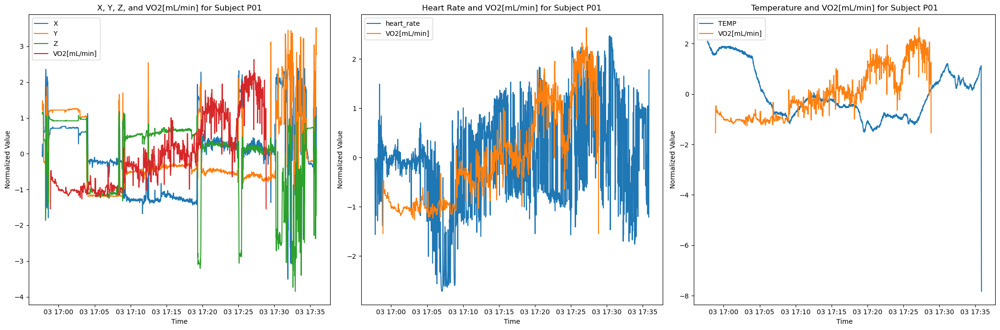

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,2290,2.289000e+03,2.289000e+03,2.289000e+03,2.290000e+03,2.290000e+03,1.802000e+03,1.803000e+03
mean,2021-12-03 17:16:48.499999744,-7.449989e-17,-6.208324e-17,-9.933319e-17,-7.446736e-17,-5.038958e-15,6.308926e-17,-1.261085e-16
min,2021-12-03 16:57:44,-3.510594e+00,-1.238207e+00,-3.846938e+00,-2.715605e+00,-7.825427e+00,-1.539132e+00,-1.224466e+00
25%,2021-12-03 17:07:16.249999872,-1.124394e+00,-5.804073e-01,-3.359559e-01,-6.640424e-01,-7.952968e-01,-9.403140e-01,-9.583588e-01
50%,2021-12-03 17:16:48.500000,1.001471e-01,-4.226325e-01,2.870839e-01,-4.276903e-02,-2.414078e-01,-2.199178e-01,-2.191729e-01
75%,2021-12-03 17:26:20.750000128,6.114757e-01,1.005837e+00,6.586096e-01,6.728832e-01,6.533360e-01,7.751167e-01,1.229631e+00
max,2021-12-03 17:35:53,2.454906e+00,3.521739e+00,1.178235e+00,2.466364e+00,2.101969e+00,2.631626e+00,1.820980e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:38:09


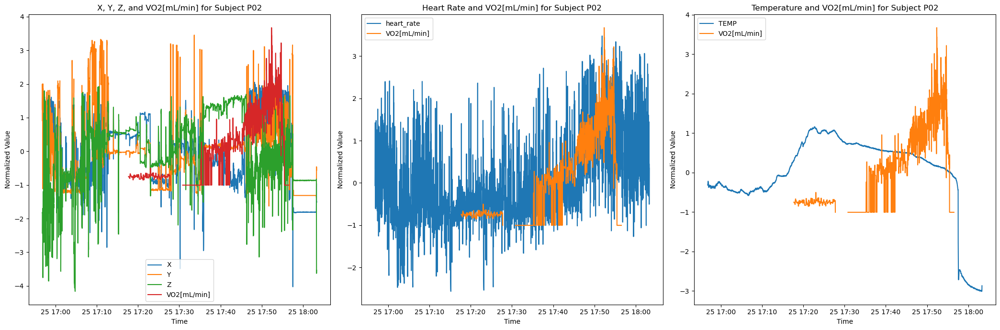

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3992,3.989000e+03,3.989000e+03,3.989000e+03,3.990000e+03,3.992000e+03,2.147000e+03,2.148000e+03
mean,2021-11-25 17:30:04.500000,2.137506e-16,4.987515e-17,4.275013e-17,-5.698588e-17,-1.680241e-15,5.295148e-17,2.646342e-17
min,2021-11-25 16:56:49,-4.025339e+00,-1.627452e+00,-4.160846e+00,-2.567769e+00,-3.008745e+00,-1.005213e+00,-1.058200e+00
25%,2021-11-25 17:13:26.750000128,-7.932022e-01,-7.727804e-01,-7.013344e-01,-6.720550e-01,-3.740403e-01,-7.895409e-01,-7.471023e-01
50%,2021-11-25 17:30:04.500000,1.233994e-01,1.016176e-02,2.498930e-02,-2.631689e-01,2.525921e-01,-1.930314e-01,-4.360045e-01
75%,2021-11-25 17:46:42.249999872,7.413331e-01,3.481399e-01,6.234169e-01,6.109789e-01,6.513582e-01,6.348474e-01,6.750590e-01
max,2021-11-25 18:03:20,2.183178e+00,3.453162e+00,1.921326e+00,3.477685e+00,1.160497e+00,3.673128e+00,2.452761e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 01:06:31


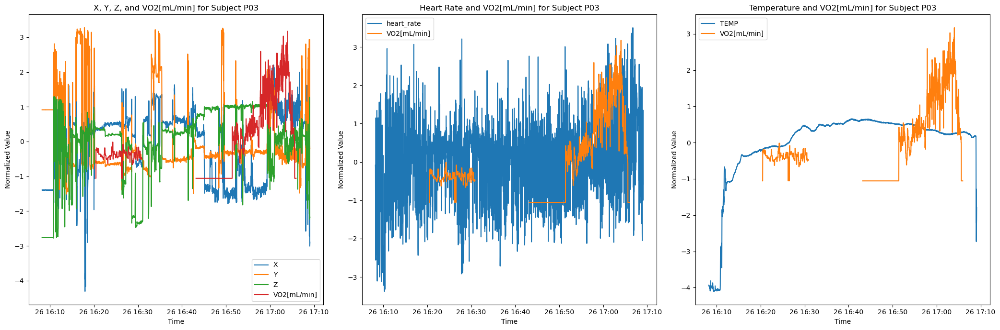

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3654,3.653000e+03,3653.000000,3.653000e+03,3.654000e+03,3.654000e+03,1.990000e+03,1.992000e+03
mean,2021-11-26 16:38:39.500000256,1.556075e-17,0.000000,6.224300e-17,-1.555649e-17,2.053457e-15,2.856453e-17,-1.141434e-16
min,2021-11-26 16:08:13,-4.305853e+00,-1.508501,-2.775029e+00,-3.374750e+00,-4.103513e+00,-1.056092e+00,-6.248162e+00
25%,2021-11-26 16:23:26.249999872,-9.298977e-01,-0.571706,-1.751615e-01,-6.484938e-01,-1.094907e-01,-1.056092e+00,-6.814501e-01
50%,2021-11-26 16:38:39.500000,3.973249e-01,-0.361430,2.150681e-01,1.221009e-01,3.322012e-01,-3.071232e-01,-4.445687e-01
75%,2021-11-26 16:53:52.750000128,6.452513e-01,-0.081455,7.110888e-01,6.039281e-01,5.107575e-01,4.709995e-01,1.476346e-01
max,2021-11-26 17:09:06,2.202585e+00,3.273521,1.298928e+00,3.501689e+00,6.611207e-01,3.171733e+00,2.753329e+00
std,NaN,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 01:00:53


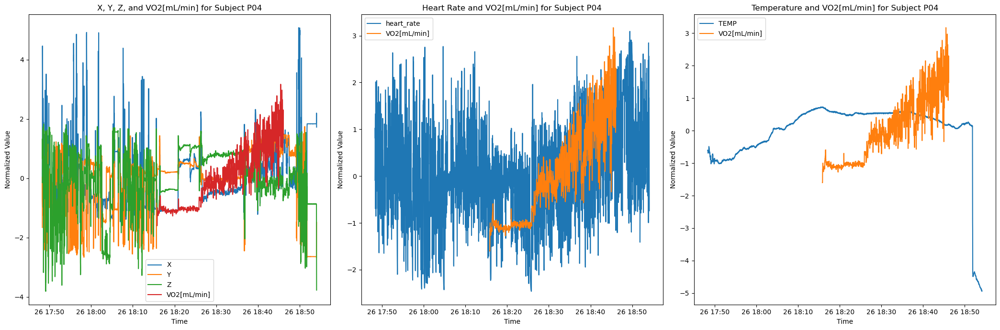

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3952,3950.000000,3.950000e+03,3.950000e+03,3.951000e+03,3.952000e+03,1820.000000,1.820000e+03
mean,2021-11-26 18:21:12.500000,0.000000,8.634443e-17,-1.151259e-16,-1.438710e-16,1.984917e-15,0.000000,2.498612e-16
min,2021-11-26 17:48:17,-1.666561,-2.681267e+00,-3.816273e+00,-2.462014e+00,-4.945812e+00,-1.600139,-1.383436e+00
25%,2021-11-26 18:04:44.750000128,-0.728393,-1.180655e-01,-4.621062e-01,-6.408278e-01,-3.272465e-01,-1.008853,-8.372085e-01
50%,2021-11-26 18:21:12.500000,-0.177057,2.065590e-01,5.065555e-02,-3.196839e-02,3.553002e-01,-0.131068,-3.638115e-01
75%,2021-11-26 18:37:40.249999872,0.538377,5.603688e-01,8.122470e-01,5.942276e-01,5.373126e-01,0.704765,7.650585e-01
max,2021-11-26 18:54:08,5.078146,1.744685e+00,1.826264e+00,3.091731e+00,7.307008e-01,3.170172,2.185250e+00
std,NaN,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,1.000000e+00


Duration: 0 days 01:05:51


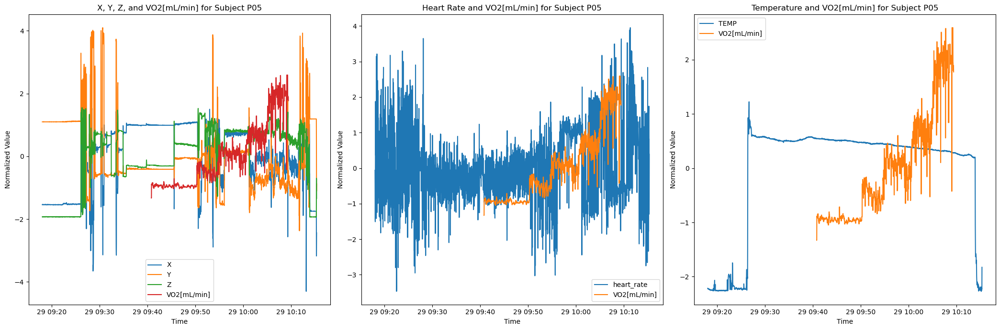

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3442,3440.000000,3.440000e+03,3.440000e+03,3.441000e+03,3.442000e+03,1.719000e+03,1.719000e+03
mean,2021-11-29 09:46:41.500000256,0.000000,-9.914550e-17,-6.609700e-17,2.147528e-16,-6.605859e-16,-6.613545e-17,1.653386e-16
min,2021-11-29 09:18:01,-4.303003,-2.371939e+00,-1.932873e+00,-3.467233e+00,-2.270671e+00,-1.328553e+00,-1.228380e+00
25%,2021-11-29 09:32:21.249999872,-0.665013,-5.784967e-01,-3.097395e-01,-6.123826e-01,2.853202e-01,-9.200156e-01,-8.458535e-01
50%,2021-11-29 09:46:41.500000,0.228327,-3.752495e-01,3.749526e-01,-1.458378e-01,4.434753e-01,-2.694106e-01,-2.720635e-01
75%,2021-11-29 10:01:01.750000128,0.989628,1.843959e-01,7.708440e-01,5.866702e-01,5.149002e-01,5.690770e-01,6.077479e-01
max,2021-11-29 10:15:22,1.576464,4.099052e+00,1.548219e+00,3.951299e+00,1.224048e+00,2.590465e+00,2.137855e+00
std,NaN,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:57:21


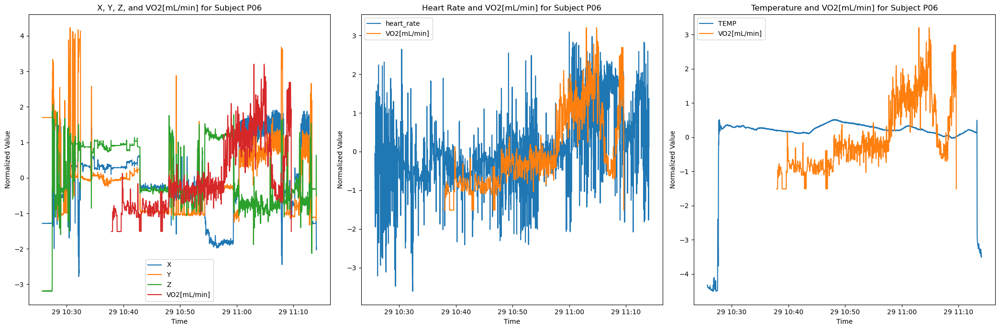

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,2902,2.901000e+03,2.901000e+03,2.901000e+03,2.902000e+03,2.902000e+03,1.903000e+03,1.904000e+03
mean,2021-11-29 10:49:53.499999744,-5.878327e-17,2.939163e-17,-9.797211e-18,2.350520e-16,-6.072178e-16,-3.584451e-16,-2.985474e-16
min,2021-11-29 10:25:43,-2.782003e+00,-1.330692e+00,-3.198243e+00,-3.611032e+00,-4.508660e+00,-1.512698e+00,-1.290721e+00
25%,2021-11-29 10:37:48.249999872,-5.159044e-01,-9.446354e-01,-6.176562e-01,-5.729251e-01,1.388833e-01,-7.567378e-01,-8.137962e-01
50%,2021-11-29 10:49:53.500000,1.007582e-01,-7.496377e-02,-3.186623e-01,-1.463694e-01,2.265728e-01,-2.474155e-01,-4.561029e-01
75%,2021-11-29 11:01:58.750000128,4.895831e-01,5.201481e-01,9.132440e-01,5.096023e-01,3.096471e-01,7.315295e-01,9.746706e-01
max,2021-11-29 11:14:04,1.911181e+00,4.230190e+00,2.060457e+00,3.091646e+00,5.173327e-01,3.202186e+00,2.166982e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:48:21


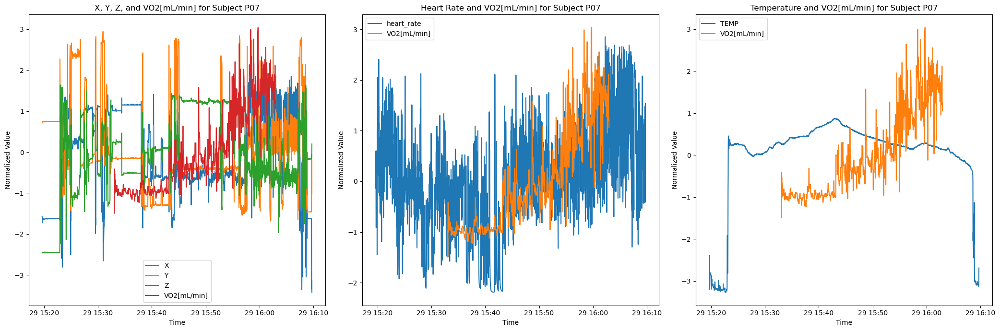

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3004,3.003000e+03,3.003000e+03,3003.000000,3.004000e+03,3.004000e+03,1.796000e+03,1.796000e+03
mean,2021-11-29 15:44:41.500000,-1.041088e-16,3.785775e-17,0.000000,2.270709e-16,6.622902e-16,-1.266000e-16,-6.330002e-17
min,2021-11-29 15:19:40,-3.418453e+00,-1.684226e+00,-2.460511,-2.189810e+00,-3.266368e+00,-1.493706e+00,-2.467782e+00
25%,2021-11-29 15:32:10.750000128,-6.424818e-01,-4.173406e-01,-0.528741,-5.009586e-01,8.934836e-02,-9.143738e-01,-3.777331e-01
50%,2021-11-29 15:44:41.500000,-1.086411e-01,-1.919706e-01,0.011508,1.680755e-02,2.501888e-01,-2.391969e-01,2.653591e-01
75%,2021-11-29 15:57:12.249999872,1.005396e+00,4.152154e-01,0.966285,5.552147e-01,4.366175e-01,6.661528e-01,6.404961e-01
max,2021-11-29 16:09:43,1.850270e+00,2.940234e+00,1.637305,2.853921e+00,8.789286e-01,3.031817e+00,1.712316e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:50:03


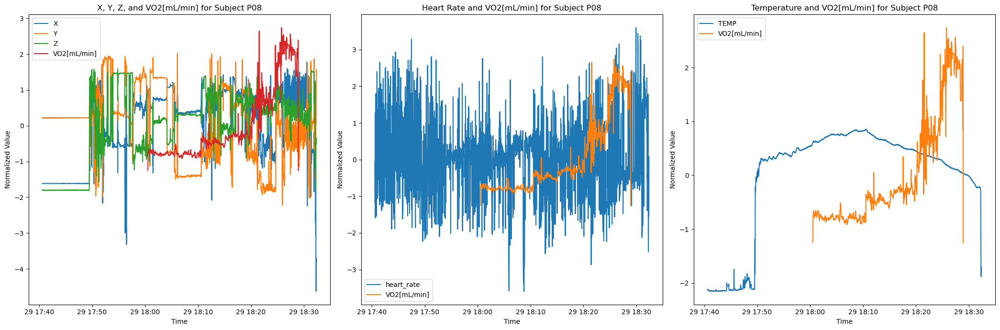

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3110,3108.000000,3.108000e+03,3108.000000,3.109000e+03,3.110000e+03,1.709000e+03,1.710000e+03
mean,2021-11-29 18:06:29.499999744,0.000000,3.657878e-17,0.000000,-1.051302e-16,1.462210e-16,3.326122e-17,8.310441e-17
min,2021-11-29 17:40:35,-4.627805,-2.212109e+00,-1.810642,-3.594222e+00,-2.153795e+00,-1.248650e+00,-4.862617e+00
25%,2021-11-29 17:53:32.249999872,-0.623090,-7.548932e-01,-0.538150,-5.837996e-01,3.074026e-02,-7.603195e-01,-6.295905e-01
50%,2021-11-29 18:06:29.500000,0.385949,2.169248e-01,0.292423,4.793800e-02,3.937426e-01,-4.064958e-01,-4.475249e-01
75%,2021-11-29 18:19:26.750000128,0.771075,6.307905e-01,0.676917,5.201943e-01,6.284986e-01,5.513661e-01,3.717706e-01
max,2021-11-29 18:32:24,1.770757,2.022606e+00,1.581560,3.598543e+00,8.502126e-01,2.737891e+00,2.465526e+00
std,NaN,1.000000,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:51:49


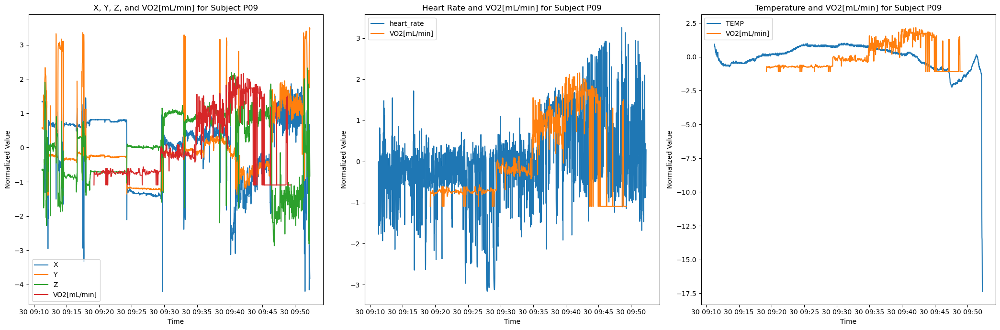

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,2464,2.463000e+03,2463.000000,2463.000000,2.464000e+03,2.464000e+03,1806.000000,1.807000e+03
mean,2021-11-30 09:31:46.500000,2.884867e-17,0.000000,0.000000,1.384174e-16,8.881784e-15,0.000000,1.887441e-16
min,2021-11-30 09:11:15,-4.199142e+00,-1.397645,-2.871377,-3.160074e+00,-1.735072e+01,-1.093069,-1.096110e+00
25%,2021-11-30 09:21:30.750000128,-8.188509e-01,-0.485305,-0.712402,-4.625388e-01,-4.682173e-01,-0.751405,-8.484336e-01
50%,2021-11-30 09:31:46.500000,3.644684e-01,-0.230867,0.021137,-8.040242e-02,2.190350e-01,-0.309131,-6.282764e-01
75%,2021-11-30 09:42:02.249999872,7.538327e-01,0.179262,0.907630,4.291375e-01,7.568846e-01,0.912223,1.077942e+00
max,2021-11-30 09:52:18,1.861019e+00,3.497251,2.317851,3.255164e+00,9.959289e-01,2.154301,1.820972e+00
std,NaN,1.000000e+00,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00


Duration: 0 days 00:41:03


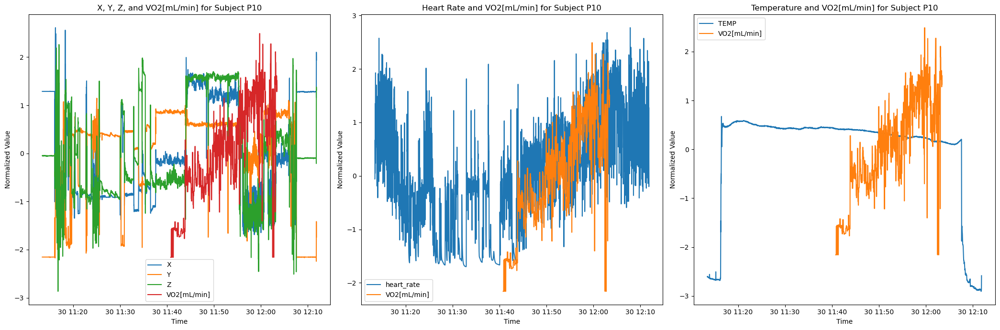

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3506,3504.000000,3.504000e+03,3.504000e+03,3.506000e+03,3.506000e+03,1.360000e+03,1.361000e+03
mean,2021-11-30 11:42:40.500000,0.000000,4.866731e-17,6.488975e-17,-6.485273e-17,2.756241e-16,2.925764e-16,-3.236859e-16
min,2021-11-30 11:13:28,-1.688264,-2.241736e+00,-2.866091e+00,-1.697441e+00,-2.906304e+00,-2.158810e+00,-2.125137e+00
25%,2021-11-30 11:28:04.249999872,-0.879973,-2.439053e-01,-7.690412e-01,-6.989346e-01,2.197208e-01,-6.628441e-01,-9.259766e-01
50%,2021-11-30 11:42:40.500000,-0.176019,4.260621e-01,-1.059269e-01,1.956198e-03,3.933889e-01,1.209277e-02,1.469561e-01
75%,2021-11-30 11:57:16.750000128,1.220331,6.208154e-01,8.352151e-01,6.728638e-01,4.401456e-01,8.176254e-01,7.780930e-01
max,2021-11-30 12:11:53,2.610737,1.145523e+00,2.261041e+00,2.769852e+00,6.739295e-01,2.490460e+00,1.661685e+00
std,NaN,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:58:25


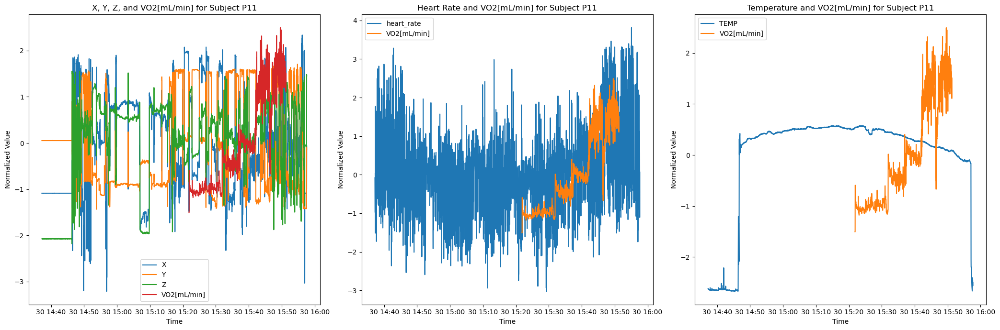

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,4828,4.824000e+03,4.824000e+03,4824.000000,4.826000e+03,4.828000e+03,1.765000e+03,1.764000e+03
mean,2021-11-30 15:17:26.500000,-5.891731e-17,-4.713385e-17,0.000000,-1.177858e-17,7.064219e-17,-6.441181e-17,8.378282e-16
min,2021-11-30 14:37:13,-3.209503e+00,-1.433977e+00,-2.179923,-3.023678e+00,-2.671881e+00,-1.504898e+00,-2.237438e+00
25%,2021-11-30 14:57:19.750000128,-9.039283e-01,-8.856367e-01,-0.296931,-5.743159e-01,1.499851e-01,-9.448519e-01,-8.129597e-01
50%,2021-11-30 15:17:26.500000,-1.812183e-03,-8.566584e-02,0.364395,-2.477624e-02,4.102831e-01,-2.429271e-01,-3.597167e-02
75%,2021-11-30 15:37:33.249999872,8.012363e-01,1.210176e+00,0.676291,4.851244e-01,5.049369e-01,9.966423e-01,8.705143e-01
max,2021-11-30 15:57:40,2.336785e+00,1.711959e+00,1.555676,3.811935e+00,5.729693e-01,2.495088e+00,2.165494e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 01:20:27


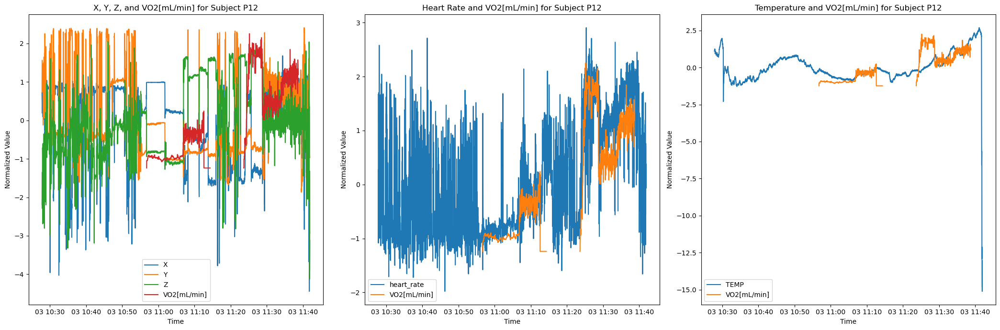

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,4448,4.446000e+03,4.446000e+03,4446.000000,4.447000e+03,4.448000e+03,1.961000e+03,1.961000e+03
mean,2021-12-03 11:04:52.500000,1.278529e-16,5.114118e-17,0.000000,2.556484e-16,1.252395e-15,2.608826e-16,5.797391e-17
min,2021-12-03 10:27:49,-4.445171e+00,-1.867764e+00,-4.125037,-1.979528e+00,-1.511806e+01,-1.239061e+00,-1.385019e+00
25%,2021-12-03 10:46:20.750000128,-6.266836e-01,-8.103262e-01,-0.807293,-8.227313e-01,-5.435668e-01,-9.660299e-01,-1.073207e+00
50%,2021-12-03 11:04:52.500000,3.089775e-01,-3.535690e-01,-0.099507,-3.271594e-01,-1.998287e-01,-2.606075e-01,1.047501e-01
75%,2021-12-03 11:23:24.249999872,8.236298e-01,8.567876e-01,0.703616,8.332544e-01,5.220213e-01,8.908449e-01,1.074832e+00
max,2021-12-03 11:41:56,1.679578e+00,2.409962e+00,2.048255,2.905673e+00,2.687571e+00,2.252439e+00,1.490582e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 01:14:07


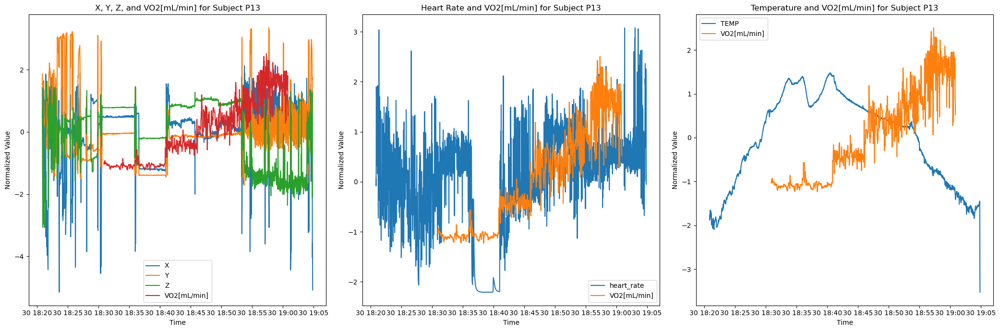

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,2645,2.644000e+03,2.644000e+03,2.644000e+03,2.645000e+03,2.644000e+03,1.802000e+03,1802.000000
mean,2021-11-30 18:42:52,3.009863e-16,4.299805e-17,-1.397437e-16,-4.298179e-17,3.009863e-16,-1.892678e-16,0.000000
min,2021-11-30 18:20:50,-5.155023e+00,-1.718093e+00,-3.072942e+00,-2.210770e+00,-3.526055e+00,-1.232299e+00,-1.799747
25%,2021-11-30 18:31:51,-2.319199e-01,-4.403772e-01,-8.605867e-01,-4.594572e-01,-8.469222e-01,-1.048916e+00,-0.719862
50%,2021-11-30 18:42:52,2.627841e-01,-1.079729e-01,3.673207e-01,2.451337e-01,2.944123e-01,-1.934792e-01,-0.138385
75%,2021-11-30 18:53:53,4.981675e-01,8.359690e-02,8.283018e-01,6.478360e-01,7.990023e-01,7.435826e-01,0.526159
max,2021-11-30 19:04:54,2.139867e+00,3.343783e+00,1.627650e+00,3.079846e+00,1.471789e+00,2.506731e+00,3.184338
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:44:04


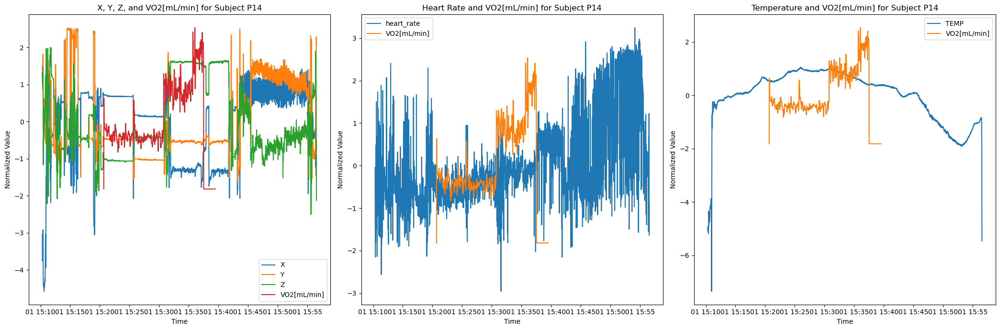

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,2777,2.777000e+03,2.777000e+03,2777.000000,2.777000e+03,2.776000e+03,1.130000e+03,1.131000e+03
mean,2021-12-01 15:33:26.999999744,-1.125815e-16,-1.023468e-16,0.000000,-4.093872e-16,-6.143021e-17,1.006078e-16,-5.025943e-17
min,2021-12-01 15:10:19,-4.582695e+00,-1.629159e+00,-2.510093,-2.959810e+00,-7.356512e+00,-1.820112e+00,-1.645431e+00
25%,2021-12-01 15:21:53,-8.266700e-01,-6.172661e-01,-0.740462,-6.674108e-01,-2.721917e-01,-4.907220e-01,-8.023403e-01
50%,2021-12-01 15:33:27,3.796137e-01,-4.856792e-01,-0.418141,-2.387681e-01,3.068153e-01,-3.171364e-01,-1.466029e-01
75%,2021-12-01 15:45:01,6.836595e-01,1.034201e+00,0.751998,4.318352e-01,6.814669e-01,7.973661e-01,4.154577e-01
max,2021-12-01 15:56:35,1.419026e+00,2.527559e+00,2.001149,3.246368e+00,1.056118e+00,2.534679e+00,2.288993e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:46:16


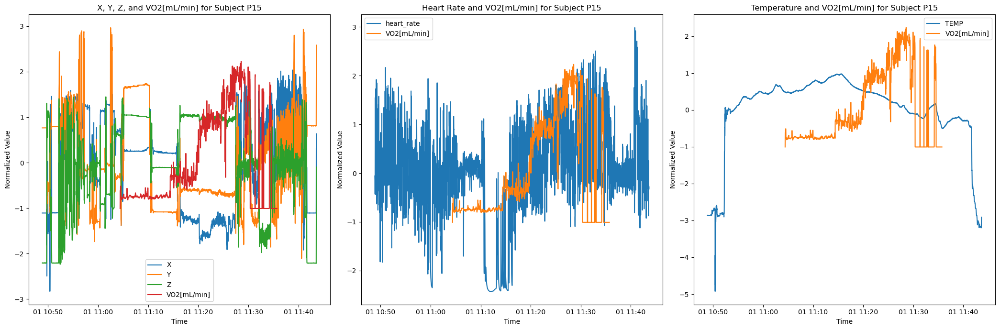

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,3288,3.286000e+03,3.286000e+03,3286.000000,3.288000e+03,3.288000e+03,1.881000e+03,1.882000e+03
mean,2021-12-01 11:16:14.499999744,3.459733e-17,2.075840e-16,0.000000,6.915258e-17,-1.469492e-15,3.021979e-17,1.208149e-16
min,2021-12-01 10:48:51,-2.829541e+00,-2.105753e+00,-2.234881,-2.423490e+00,-4.924004e+00,-1.008217e+00,-3.711277e+00
25%,2021-12-01 11:02:32.750000128,-1.107524e+00,-6.976778e-01,-0.377244,-3.660293e-01,-1.596087e-01,-7.663432e-01,-8.291766e-01
50%,2021-12-01 11:16:14.500000,2.251109e-01,-2.266850e-01,-0.005357,7.636756e-02,3.279506e-01,-4.461090e-01,-5.644939e-01
75%,2021-12-01 11:29:56.249999872,8.663692e-01,7.992022e-01,0.984392,5.769184e-01,5.389411e-01,9.014843e-01,9.941931e-01
max,2021-12-01 11:43:38,2.035798e+00,2.967567e+00,1.448406,2.982266e+00,9.723272e-01,2.228609e+00,2.052924e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:54:47


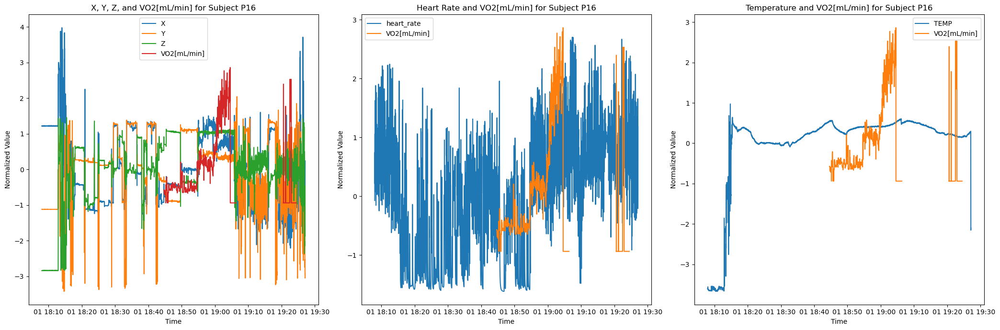

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,4750,4.747000e+03,4.747000e+03,4.747000e+03,4.748000e+03,4.750000e+03,1.541000e+03,1.541000e+03
mean,2021-12-01 18:47:32.499999744,1.676444e-16,5.987299e-18,-2.394920e-17,9.577661e-17,-7.180221e-16,-1.844368e-17,-9.221840e-17
min,2021-12-01 18:07:58,-2.209059e+00,-3.421046e+00,-2.841531e+00,-1.617892e+00,-3.669720e+00,-9.385200e-01,-1.123296e+00
25%,2021-12-01 18:27:45.249999872,-9.250306e-01,-7.651100e-01,-3.053304e-01,-9.286622e-01,5.383390e-02,-6.412025e-01,-9.445077e-01
50%,2021-12-01 18:47:32.500000,-8.168270e-02,1.941119e-01,8.800680e-02,1.590756e-01,2.924140e-01,-4.594595e-01,-3.485465e-01
75%,2021-12-01 19:07:19.750000128,1.065777e+00,5.917793e-01,7.096819e-01,7.112883e-01,4.117041e-01,2.557435e-01,7.539819e-01
max,2021-12-01 19:27:07,3.980185e+00,2.046278e+00,1.458034e+00,2.701628e+00,9.740716e-01,2.863086e+00,1.916106e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 01:19:09


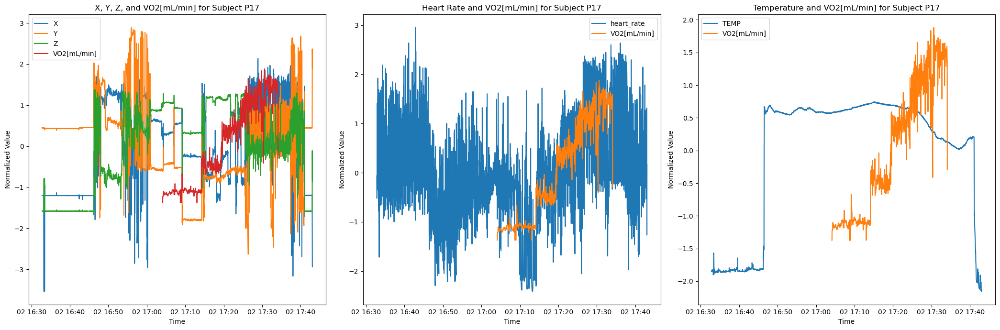

,Time,X,Y,Z,heart_rate,TEMP,VO2[mL/min],HR[bpm]
count,4218,4217.000000,4.217000e+03,4.217000e+03,4.218000e+03,4.218000e+03,1.801000e+03,1.801000e+03
mean,2021-12-02 17:07:55.500000,0.000000,-5.391835e-17,5.391835e-17,-3.908154e-16,1.024206e-15,-4.734321e-17,-4.734321e-17
min,2021-12-02 16:32:47,-3.536154,-2.632112e+00,-1.675173e+00,-2.413632e+00,-2.154988e+00,-1.373986e+00,-1.436817e+00
25%,2021-12-02 16:50:21.249999872,-1.195050,-5.964155e-01,-7.882906e-01,-5.555320e-01,5.111945e-02,-1.078523e+00,-8.545730e-01
50%,2021-12-02 17:07:55.500000,-0.050750,2.365370e-01,2.999891e-01,-7.829619e-02,5.795787e-01,-2.371506e-01,-4.255510e-01
75%,2021-12-02 17:25:29.750000128,0.847189,4.564463e-01,8.800144e-01,6.372440e-01,6.424905e-01,9.859006e-01,9.534486e-01
max,2021-12-02 17:43:04,2.136883,2.885277e+00,1.383142e+00,2.948559e+00,7.431494e-01,1.879850e+00,1.780848e+00
std,NaN,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 01:10:17


In [209]:
for subject_id in subject_ids:
    joined_df = subject_data[subject_id]
    plot_normalized_data(joined_df, subject_id)

# Drop na

In [155]:
cleaned_data = {}
for subject_id in subject_ids:
    cleaned_data[subject_id] = subject_data[subject_id].dropna()
    cleaned_data[subject_id] = cleaned_data[subject_id][cleaned_data[subject_id]['VO2[mL/min]'] != 0].sort_values('Time').reset_index(drop=True)
    cleaned_data[subject_id] = cleaned_data[subject_id].drop(columns=['X', 'Y', 'Z', 'HR[bpm]'])
    cleaned_data[subject_id].rename(columns={'Time[s]': 't'}, inplace=True)

    # print(f"Subject {subject_id}")
    # display(cleaned_data[subject_id])

## Interpolate small gaps in data

In [156]:
for subject_id in subject_ids:
    subject_df = cleaned_data[subject_id]
    gaps = subject_df[(subject_df['t'].diff() > 1) & (subject_df['t'].diff() < 10)]
    gaps_previous = subject_df.loc[gaps.index - 1].sort_index()
    gaps_with_previous = pd.concat([gaps_previous, gaps]).sort_index()

    print(f"Starting Subject {subject_id}")
    display(cleaned_data[subject_id])

    if not gaps.empty:
        print(f"Subject {subject_id} has small gaps in time:")
        # display(gaps_previous)
        # display(gaps)
        # display(gaps_with_previous)


        for start, end in zip(gaps_previous['Time'], gaps['Time']):
            mask = (subject_df['Time'] >= start) & (subject_df['Time'] <= end)
            masked_data = subject_df.loc[mask]#.drop_duplicates(subset='Time')
            masked_data.set_index('Time', inplace=True)
            # display(masked_data)
            # print(subject_df.columns)
            # print(subject_df.index.names)
            masked_data = masked_data.resample('1s').interpolate(method='time')#.reset_index()

            masked_data['Time_temp'] = masked_data.index
            masked_data.reset_index(drop=True, inplace=True)
            masked_data.rename(columns={'Time_temp': 'Time'}, inplace=True)

            print(f"Filled gap from {start} to {end}")
            display(masked_data)
            subject_df = pd.concat([subject_df, masked_data]).drop_duplicates().sort_values('Time')

        cleaned_data[subject_id] = subject_df.reset_index(drop=True)

    cleaned_data[subject_id]['t'] = cleaned_data[subject_id].index

    print(f"Final Subject {subject_id}")
    display(cleaned_data[subject_id])

Starting Subject P01


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-03 16:58:53,94.690403,32.18,6.81,470.17,3.0
1,2021-12-03 16:58:54,92.744725,32.18,6.81,470.17,4.0
2,2021-12-03 16:58:55,95.996020,32.16,7.12,491.33,5.0
3,2021-12-03 16:58:56,95.313119,32.16,7.12,491.33,6.0
4,2021-12-03 16:58:57,90.710056,32.18,7.12,491.33,7.0
...,...,...,...,...,...,...
1794,2021-12-03 17:28:47,134.920374,31.51,13.34,920.33,1797.0
1795,2021-12-03 17:28:48,159.813979,31.49,13.34,920.33,1798.0
1796,2021-12-03 17:28:49,140.897191,31.51,13.34,920.33,1799.0
1797,2021-12-03 17:28:50,154.094574,31.51,13.34,920.33,1800.0


Final Subject P01


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-03 16:58:53,94.690403,32.18,6.81,470.17,0
1,2021-12-03 16:58:54,92.744725,32.18,6.81,470.17,1
2,2021-12-03 16:58:55,95.996020,32.16,7.12,491.33,2
3,2021-12-03 16:58:56,95.313119,32.16,7.12,491.33,3
4,2021-12-03 16:58:57,90.710056,32.18,7.12,491.33,4
...,...,...,...,...,...,...
1794,2021-12-03 17:28:47,134.920374,31.51,13.34,920.33,1794
1795,2021-12-03 17:28:48,159.813979,31.49,13.34,920.33,1795
1796,2021-12-03 17:28:49,140.897191,31.51,13.34,920.33,1796
1797,2021-12-03 17:28:50,154.094574,31.51,13.34,920.33,1797


Starting Subject P02


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-25 17:17:43,64.765699,32.93,2.52,188.67,1.0
1,2021-11-25 17:17:44,59.656709,32.95,2.52,188.67,2.0
2,2021-11-25 17:17:45,110.264730,32.95,2.52,188.67,3.0
3,2021-11-25 17:17:46,84.384969,32.99,2.52,188.67,4.0
4,2021-11-25 17:17:47,60.196520,32.99,2.34,175.33,5.0
...,...,...,...,...,...,...
1697,2021-11-25 17:55:23,130.179259,32.13,12.77,957.67,1474.0
1698,2021-11-25 17:55:24,144.485839,32.09,12.77,957.67,1475.0
1699,2021-11-25 17:55:25,120.541918,32.09,10.81,810.50,1476.0
1700,2021-11-25 17:55:26,117.798884,32.11,10.81,810.50,1477.0


Subject P02 has small gaps in time:
Filled gap from 2021-11-25 17:36:54 to 2021-11-25 17:37:02


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,96.739281,33.8300,10.17,763.0,365.0,2021-11-25 17:36:54
1,91.788286,33.8275,10.17,763.0,366.0,2021-11-25 17:36:55
2,86.837290,33.8250,10.17,763.0,367.0,2021-11-25 17:36:56
3,81.886295,33.8225,10.17,763.0,368.0,2021-11-25 17:36:57
4,76.935299,33.8200,10.17,763.0,369.0,2021-11-25 17:36:58
5,71.984304,33.8175,10.17,763.0,370.0,2021-11-25 17:36:59
6,67.033308,33.8150,10.17,763.0,371.0,2021-11-25 17:37:00
7,62.082313,33.8125,10.17,763.0,372.0,2021-11-25 17:37:01
8,57.131318,33.8100,10.17,763.0,373.0,2021-11-25 17:37:02


Filled gap from 2021-11-25 17:37:08 to 2021-11-25 17:37:17


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,82.453989,33.81,10.170000,763.000000,379.0,2021-11-25 17:37:08
1,81.314485,33.81,10.252222,769.111111,380.0,2021-11-25 17:37:09
2,80.174982,33.81,10.334444,775.222222,381.0,2021-11-25 17:37:10
3,79.035479,33.81,10.416667,781.333333,382.0,2021-11-25 17:37:11
4,77.895976,33.81,10.498889,787.444444,383.0,2021-11-25 17:37:12
5,76.756472,33.81,10.581111,793.555556,384.0,2021-11-25 17:37:13
6,75.616969,33.81,10.663333,799.666667,385.0,2021-11-25 17:37:14
7,74.477466,33.81,10.745556,805.777778,386.0,2021-11-25 17:37:15
8,73.337962,33.81,10.827778,811.888889,387.0,2021-11-25 17:37:16
9,72.198459,33.81,10.910000,818.000000,388.0,2021-11-25 17:37:17


Filled gap from 2021-11-25 17:37:36 to 2021-11-25 17:37:38


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,57.664594,33.77,7.93,595.0,407.0,2021-11-25 17:37:36
1,100.943034,33.77,7.93,595.0,408.0,2021-11-25 17:37:37
2,144.221474,33.77,7.93,595.0,409.0,2021-11-25 17:37:38


Filled gap from 2021-11-25 17:37:50 to 2021-11-25 17:37:53


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,50.520492,33.730000,7.930000,595.000000,421.0,2021-11-25 17:37:50
1,53.151273,33.736667,8.876667,665.943333,422.0,2021-11-25 17:37:51
2,55.782054,33.743333,9.823333,736.886667,423.0,2021-11-25 17:37:52
3,58.412835,33.750000,10.770000,807.830000,424.0,2021-11-25 17:37:53


Filled gap from 2021-11-25 17:39:34 to 2021-11-25 17:39:41


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,57.051737,33.650000,10.53,789.83,525.0,2021-11-25 17:39:34
1,57.894206,33.647143,10.53,789.83,526.0,2021-11-25 17:39:35
2,58.736675,33.644286,10.53,789.83,527.0,2021-11-25 17:39:36
3,59.579144,33.641429,10.53,789.83,528.0,2021-11-25 17:39:37
4,60.421613,33.638571,10.53,789.83,529.0,2021-11-25 17:39:38
5,61.264082,33.635714,10.53,789.83,530.0,2021-11-25 17:39:39
6,62.106551,33.632857,10.53,789.83,531.0,2021-11-25 17:39:40
7,62.949020,33.630000,10.53,789.83,532.0,2021-11-25 17:39:41


Filled gap from 2021-11-25 17:39:48 to 2021-11-25 17:39:56


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,55.945814,33.6300,10.5300,789.8300,539.0,2021-11-25 17:39:48
1,56.501901,33.6275,10.5875,794.1425,540.0,2021-11-25 17:39:49
2,57.057989,33.6250,10.6450,798.4550,541.0,2021-11-25 17:39:50
3,57.614076,33.6225,10.7025,802.7675,542.0,2021-11-25 17:39:51
4,58.170164,33.6200,10.7600,807.0800,543.0,2021-11-25 17:39:52
5,58.726251,33.6175,10.8175,811.3925,544.0,2021-11-25 17:39:53
6,59.282339,33.6150,10.8750,815.7050,545.0,2021-11-25 17:39:54
7,59.838426,33.6125,10.9325,820.0175,546.0,2021-11-25 17:39:55
8,60.394514,33.6100,10.9900,824.3300,547.0,2021-11-25 17:39:56


Filled gap from 2021-11-25 17:40:14 to 2021-11-25 17:40:18


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,61.675175,33.610,13.18,988.67,565.0,2021-11-25 17:40:14
1,60.991815,33.605,13.18,988.67,566.0,2021-11-25 17:40:15
2,60.308455,33.600,13.18,988.67,567.0,2021-11-25 17:40:16
3,59.625094,33.595,13.18,988.67,568.0,2021-11-25 17:40:17
4,58.941734,33.590,13.18,988.67,569.0,2021-11-25 17:40:18


Filled gap from 2021-11-25 17:40:28 to 2021-11-25 17:40:33


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,70.347839,33.590,13.180,988.67,579.0,2021-11-25 17:40:28
1,68.349352,33.598,13.066,980.07,580.0,2021-11-25 17:40:29
2,66.350865,33.606,12.952,971.47,581.0,2021-11-25 17:40:30
3,64.352379,33.614,12.838,962.87,582.0,2021-11-25 17:40:31
4,62.353892,33.622,12.724,954.27,583.0,2021-11-25 17:40:32
5,60.355406,33.630,12.610,945.67,584.0,2021-11-25 17:40:33


Filled gap from 2021-11-25 17:41:18 to 2021-11-25 17:41:27


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,74.349275,33.59,12.33,924.83,629.0,2021-11-25 17:41:18
1,72.478507,33.59,12.33,924.83,630.0,2021-11-25 17:41:19
2,70.607739,33.59,12.33,924.83,631.0,2021-11-25 17:41:20
3,68.736971,33.59,12.33,924.83,632.0,2021-11-25 17:41:21
4,66.866203,33.59,12.33,924.83,633.0,2021-11-25 17:41:22
5,64.995435,33.59,12.33,924.83,634.0,2021-11-25 17:41:23
6,63.124668,33.59,12.33,924.83,635.0,2021-11-25 17:41:24
7,61.253900,33.59,12.33,924.83,636.0,2021-11-25 17:41:25
8,59.383132,33.59,12.33,924.83,637.0,2021-11-25 17:41:26
9,57.512364,33.59,12.33,924.83,638.0,2021-11-25 17:41:27


Filled gap from 2021-11-25 17:41:56 to 2021-11-25 17:41:59


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,61.852476,33.57,14.23,1067.17,667.0,2021-11-25 17:41:56
1,77.409501,33.57,14.23,1067.17,668.0,2021-11-25 17:41:57
2,92.966525,33.57,14.23,1067.17,669.0,2021-11-25 17:41:58
3,108.523549,33.57,14.23,1067.17,670.0,2021-11-25 17:41:59


Filled gap from 2021-11-25 17:42:10 to 2021-11-25 17:42:14


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,64.138095,33.590,14.2300,1067.17,681.0,2021-11-25 17:42:10
1,66.956564,33.585,15.4275,1156.96,682.0,2021-11-25 17:42:11
2,69.775034,33.580,16.6250,1246.75,683.0,2021-11-25 17:42:12
3,72.593503,33.575,17.8225,1336.54,684.0,2021-11-25 17:42:13
4,75.411972,33.570,19.0200,1426.33,685.0,2021-11-25 17:42:14


Final Subject P02


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-25 17:17:43,64.765699,32.93,2.52,188.67,0
1,2021-11-25 17:17:44,59.656709,32.95,2.52,188.67,1
2,2021-11-25 17:17:45,110.264730,32.95,2.52,188.67,2
3,2021-11-25 17:17:46,84.384969,32.99,2.52,188.67,3
4,2021-11-25 17:17:47,60.196520,32.99,2.34,175.33,4
...,...,...,...,...,...,...
1748,2021-11-25 17:55:23,130.179259,32.13,12.77,957.67,1748
1749,2021-11-25 17:55:24,144.485839,32.09,12.77,957.67,1749
1750,2021-11-25 17:55:25,120.541918,32.09,10.81,810.50,1750
1751,2021-11-25 17:55:26,117.798884,32.11,10.81,810.50,1751


Starting Subject P03


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-26 16:20:29,94.432874,31.79,3.91,238.33,3.0
1,2021-11-26 16:20:30,91.592501,31.79,3.91,238.33,4.0
2,2021-11-26 16:20:31,87.187083,31.79,3.91,238.33,5.0
3,2021-11-26 16:20:32,70.435003,31.79,3.70,226.00,6.0
4,2021-11-26 16:20:33,86.314510,31.81,3.70,226.00,7.0
...,...,...,...,...,...,...
1464,2021-11-26 17:05:32,84.980649,32.77,5.73,349.33,1341.0
1465,2021-11-26 17:05:33,86.222632,32.79,5.73,349.33,1342.0
1466,2021-11-26 17:05:34,145.568204,32.79,4.95,301.67,1343.0
1467,2021-11-26 17:05:35,88.444994,32.79,4.95,301.67,1344.0


Subject P03 has small gaps in time:
Filled gap from 2021-11-26 16:26:14 to 2021-11-26 16:26:17


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,88.199090,32.150000,3.07,187.33,348.0,2021-11-26 16:26:14
1,95.967908,32.153333,3.07,187.33,349.0,2021-11-26 16:26:15
2,103.736726,32.156667,3.07,187.33,350.0,2021-11-26 16:26:16
3,111.505544,32.160000,3.07,187.33,351.0,2021-11-26 16:26:17


Filled gap from 2021-11-26 16:26:28 to 2021-11-26 16:26:32


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,118.041507,32.1800,3.070,187.330,362.0,2021-11-26 16:26:28
1,112.391507,32.1875,3.235,197.415,363.0,2021-11-26 16:26:29
2,106.741507,32.1950,3.400,207.500,364.0,2021-11-26 16:26:30
3,101.091507,32.2025,3.565,217.585,365.0,2021-11-26 16:26:31
4,95.441507,32.2100,3.730,227.670,366.0,2021-11-26 16:26:32


Final Subject P03


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-26 16:20:29,94.432874,31.79,3.91,238.33,0
1,2021-11-26 16:20:30,91.592501,31.79,3.91,238.33,1
2,2021-11-26 16:20:31,87.187083,31.79,3.91,238.33,2
3,2021-11-26 16:20:32,70.435003,31.79,3.70,226.00,3
4,2021-11-26 16:20:33,86.314510,31.81,3.70,226.00,4
...,...,...,...,...,...,...
1469,2021-11-26 17:05:32,84.980649,32.77,5.73,349.33,1469
1470,2021-11-26 17:05:33,86.222632,32.79,5.73,349.33,1470
1471,2021-11-26 17:05:34,145.568204,32.79,4.95,301.67,1471
1472,2021-11-26 17:05:35,88.444994,32.79,4.95,301.67,1472


Starting Subject P04


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-26 18:15:52,49.766810,33.81,2.39,161.17,4.0
1,2021-11-26 18:15:53,81.434072,33.81,2.39,161.17,5.0
2,2021-11-26 18:15:54,54.867651,33.79,2.39,161.17,6.0
3,2021-11-26 18:15:55,41.315618,33.79,3.48,235.17,7.0
4,2021-11-26 18:15:56,52.495231,33.79,3.48,235.17,8.0
...,...,...,...,...,...,...
1812,2021-11-26 18:46:04,47.723382,32.89,17.87,1206.17,1816.0
1813,2021-11-26 18:46:05,41.151103,32.87,22.65,1528.67,1817.0
1814,2021-11-26 18:46:06,58.187300,32.84,22.65,1528.67,1818.0
1815,2021-11-26 18:46:07,56.858230,32.84,17.83,1203.83,1819.0


Final Subject P04


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-26 18:15:52,49.766810,33.81,2.39,161.17,0
1,2021-11-26 18:15:53,81.434072,33.81,2.39,161.17,1
2,2021-11-26 18:15:54,54.867651,33.79,2.39,161.17,2
3,2021-11-26 18:15:55,41.315618,33.79,3.48,235.17,3
4,2021-11-26 18:15:56,52.495231,33.79,3.48,235.17,4
...,...,...,...,...,...,...
1812,2021-11-26 18:46:04,47.723382,32.89,17.87,1206.17,1812
1813,2021-11-26 18:46:05,41.151103,32.87,22.65,1528.67,1813
1814,2021-11-26 18:46:06,58.187300,32.84,22.65,1528.67,1814
1815,2021-11-26 18:46:07,56.858230,32.84,17.83,1203.83,1815


Starting Subject P05


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 09:40:50,87.248361,33.66,3.51,231.67,3.0
1,2021-11-29 09:40:51,82.068570,33.65,3.51,231.67,4.0
2,2021-11-29 09:40:52,82.150101,33.65,3.32,219.17,5.0
3,2021-11-29 09:40:53,79.642533,33.66,3.32,219.17,6.0
4,2021-11-29 09:40:54,79.430233,33.66,3.32,219.17,7.0
...,...,...,...,...,...,...
1712,2021-11-29 10:09:22,67.053198,32.65,24.69,1629.67,1715.0
1713,2021-11-29 10:09:23,63.751060,32.65,25.47,1680.83,1716.0
1714,2021-11-29 10:09:24,79.662134,32.66,25.47,1680.83,1717.0
1715,2021-11-29 10:09:25,80.332120,32.65,25.47,1680.83,1718.0


Final Subject P05


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 09:40:50,87.248361,33.66,3.51,231.67,0
1,2021-11-29 09:40:51,82.068570,33.65,3.51,231.67,1
2,2021-11-29 09:40:52,82.150101,33.65,3.32,219.17,2
3,2021-11-29 09:40:53,79.642533,33.66,3.32,219.17,3
4,2021-11-29 09:40:54,79.430233,33.66,3.32,219.17,4
...,...,...,...,...,...,...
1712,2021-11-29 10:09:22,67.053198,32.65,24.69,1629.67,1712
1713,2021-11-29 10:09:23,63.751060,32.65,25.47,1680.83,1713
1714,2021-11-29 10:09:24,79.662134,32.66,25.47,1680.83,1714
1715,2021-11-29 10:09:25,80.332120,32.65,25.47,1680.83,1715


Starting Subject P06


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 10:38:07,84.144495,32.95,1.47,147.00,13.0
1,2021-11-29 10:38:08,81.702406,32.95,1.47,147.00,14.0
2,2021-11-29 10:38:09,81.968764,32.97,1.47,147.00,15.0
3,2021-11-29 10:38:10,83.444366,32.97,1.47,147.00,16.0
4,2021-11-29 10:38:11,84.838723,32.95,0.88,87.83,17.0
...,...,...,...,...,...,...
1829,2021-11-29 11:09:32,107.283045,32.57,7.80,778.00,1898.0
1830,2021-11-29 11:09:33,109.025717,32.57,7.80,778.00,1899.0
1831,2021-11-29 11:09:34,132.602551,32.57,8.79,876.00,1900.0
1832,2021-11-29 11:09:35,90.012905,32.55,8.79,876.00,1901.0


Subject P06 has small gaps in time:
Filled gap from 2021-11-29 10:42:51 to 2021-11-29 10:42:53


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,76.375936,32.840,1.26,126.0,297.0,2021-11-29 10:42:51
1,76.898622,32.835,1.26,126.0,298.0,2021-11-29 10:42:52
2,77.421309,32.830,1.26,126.0,299.0,2021-11-29 10:42:53


Filled gap from 2021-11-29 10:43:05 to 2021-11-29 10:43:08


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,84.951968,32.830000,1.260000,126.000000,311.0,2021-11-29 10:43:05
1,85.842981,32.816667,1.276667,127.666667,312.0,2021-11-29 10:43:06
2,86.733994,32.803333,1.293333,129.333333,313.0,2021-11-29 10:43:07
3,87.625007,32.790000,1.310000,131.000000,314.0,2021-11-29 10:43:08


Filled gap from 2021-11-29 10:46:35 to 2021-11-29 10:46:40


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,85.333333,33.410,2.97,296.33,521.0,2021-11-29 10:46:35
1,83.300495,33.414,2.97,296.33,522.0,2021-11-29 10:46:36
2,81.267657,33.418,2.97,296.33,523.0,2021-11-29 10:46:37
3,79.234819,33.422,2.97,296.33,524.0,2021-11-29 10:46:38
4,77.201981,33.426,2.97,296.33,525.0,2021-11-29 10:46:39
5,75.169143,33.430,2.97,296.33,526.0,2021-11-29 10:46:40


Filled gap from 2021-11-29 10:46:49 to 2021-11-29 10:46:55


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,88.815278,33.450000,2.970,296.330,535.0,2021-11-29 10:46:49
1,88.240305,33.453333,2.765,275.775,536.0,2021-11-29 10:46:50
2,87.665332,33.456667,2.560,255.220,537.0,2021-11-29 10:46:51
3,87.090359,33.460000,2.355,234.665,538.0,2021-11-29 10:46:52
4,86.515386,33.463333,2.150,214.110,539.0,2021-11-29 10:46:53
5,85.940413,33.466667,1.945,193.555,540.0,2021-11-29 10:46:54
6,85.365440,33.470000,1.740,173.000,541.0,2021-11-29 10:46:55


Final Subject P06


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 10:38:07,84.144495,32.95,1.47,147.00,0
1,2021-11-29 10:38:08,81.702406,32.95,1.47,147.00,1
2,2021-11-29 10:38:09,81.968764,32.97,1.47,147.00,2
3,2021-11-29 10:38:10,83.444366,32.97,1.47,147.00,3
4,2021-11-29 10:38:11,84.838723,32.95,0.88,87.83,4
...,...,...,...,...,...,...
1841,2021-11-29 11:09:32,107.283045,32.57,7.80,778.00,1841
1842,2021-11-29 11:09:33,109.025717,32.57,7.80,778.00,1842
1843,2021-11-29 11:09:34,132.602551,32.57,8.79,876.00,1843
1844,2021-11-29 11:09:35,90.012905,32.55,8.79,876.00,1844


Starting Subject P07


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 15:33:05,26.471037,32.68,6.45,458.00,3.0
1,2021-11-29 15:33:06,24.926721,32.66,6.45,458.00,4.0
2,2021-11-29 15:33:07,32.515462,32.71,6.45,458.00,5.0
3,2021-11-29 15:33:08,58.374537,32.66,5.65,401.50,6.0
4,2021-11-29 15:33:09,77.541614,32.71,5.65,401.50,7.0
...,...,...,...,...,...,...
1789,2021-11-29 16:02:54,152.471615,32.34,16.05,1139.67,1792.0
1790,2021-11-29 16:02:55,150.210349,32.34,16.05,1139.67,1793.0
1791,2021-11-29 16:02:56,98.310236,32.33,16.39,1163.83,1794.0
1792,2021-11-29 16:02:57,159.758990,32.34,16.39,1163.83,1795.0


Final Subject P07


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 15:33:05,26.471037,32.68,6.45,458.00,0
1,2021-11-29 15:33:06,24.926721,32.66,6.45,458.00,1
2,2021-11-29 15:33:07,32.515462,32.71,6.45,458.00,2
3,2021-11-29 15:33:08,58.374537,32.66,5.65,401.50,3
4,2021-11-29 15:33:09,77.541614,32.71,5.65,401.50,4
...,...,...,...,...,...,...
1789,2021-11-29 16:02:54,152.471615,32.34,16.05,1139.67,1789
1790,2021-11-29 16:02:55,150.210349,32.34,16.05,1139.67,1790
1791,2021-11-29 16:02:56,98.310236,32.33,16.39,1163.83,1791
1792,2021-11-29 16:02:57,159.758990,32.34,16.39,1163.83,1792


Starting Subject P08


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 18:00:33,80.416491,35.71,2.85,284.00,2.0
1,2021-11-29 18:00:34,98.043640,35.71,2.85,284.00,3.0
2,2021-11-29 18:00:35,79.897958,35.75,2.85,284.00,4.0
3,2021-11-29 18:00:36,76.910880,35.77,2.85,284.00,5.0
4,2021-11-29 18:00:37,72.214717,35.75,3.41,340.17,6.0
...,...,...,...,...,...,...
1698,2021-11-29 18:28:51,88.887144,33.05,18.24,1818.83,1700.0
1699,2021-11-29 18:28:52,131.295062,33.05,18.24,1818.83,1701.0
1700,2021-11-29 18:28:53,78.278145,33.05,18.24,1818.83,1702.0
1701,2021-11-29 18:28:54,92.186290,33.03,12.10,1206.50,1703.0


Final Subject P08


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-29 18:00:33,80.416491,35.71,2.85,284.00,0
1,2021-11-29 18:00:34,98.043640,35.71,2.85,284.00,1
2,2021-11-29 18:00:35,79.897958,35.75,2.85,284.00,2
3,2021-11-29 18:00:36,76.910880,35.77,2.85,284.00,3
4,2021-11-29 18:00:37,72.214717,35.75,3.41,340.17,4
...,...,...,...,...,...,...
1698,2021-11-29 18:28:51,88.887144,33.05,18.24,1818.83,1698
1699,2021-11-29 18:28:52,131.295062,33.05,18.24,1818.83,1699
1700,2021-11-29 18:28:53,78.278145,33.05,18.24,1818.83,1700
1701,2021-11-29 18:28:54,92.186290,33.03,12.10,1206.50,1701


Starting Subject P09


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 09:19:14,83.171588,33.34,2.99,227.50,2.0
1,2021-11-30 09:19:15,82.420499,33.34,2.99,227.50,3.0
2,2021-11-30 09:19:16,80.441289,33.34,2.99,227.50,4.0
3,2021-11-30 09:19:17,72.746210,33.37,2.99,227.50,5.0
4,2021-11-30 09:19:18,50.539364,33.37,2.99,227.50,6.0
...,...,...,...,...,...,...
1522,2021-11-30 09:48:48,91.824325,32.73,12.99,987.00,1776.0
1523,2021-11-30 09:48:49,76.756078,32.73,21.15,1607.17,1777.0
1524,2021-11-30 09:48:50,142.832554,32.71,21.15,1607.17,1778.0
1525,2021-11-30 09:48:51,109.045075,32.71,21.15,1607.17,1779.0


Subject P09 has small gaps in time:
Filled gap from 2021-11-30 09:21:01 to 2021-11-30 09:21:06


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,26.740583,33.39,3.92,297.83,109.0,2021-11-30 09:21:01
1,37.244645,33.38,3.92,297.83,110.0,2021-11-30 09:21:02
2,47.748707,33.37,3.92,297.83,111.0,2021-11-30 09:21:03
3,58.252770,33.36,3.92,297.83,112.0,2021-11-30 09:21:04
4,68.756832,33.35,3.92,297.83,113.0,2021-11-30 09:21:05
5,79.260894,33.34,3.92,297.83,114.0,2021-11-30 09:21:06


Filled gap from 2021-11-30 09:21:15 to 2021-11-30 09:21:21


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,83.460194,33.370000,3.920,297.830,123.0,2021-11-30 09:21:15
1,83.399039,33.373333,3.705,281.525,124.0,2021-11-30 09:21:16
2,83.337883,33.376667,3.490,265.220,125.0,2021-11-30 09:21:17
3,83.276728,33.380000,3.275,248.915,126.0,2021-11-30 09:21:18
4,83.215572,33.383333,3.060,232.610,127.0,2021-11-30 09:21:19
5,83.154417,33.386667,2.845,216.305,128.0,2021-11-30 09:21:20
6,83.093261,33.390000,2.630,200.000,129.0,2021-11-30 09:21:21


Filled gap from 2021-11-30 09:24:20 to 2021-11-30 09:24:25


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,99.090506,33.57,3.85,292.67,308.0,2021-11-30 09:24:20
1,100.026752,33.57,3.85,292.67,309.0,2021-11-30 09:24:21
2,100.962997,33.57,3.85,292.67,310.0,2021-11-30 09:24:22
3,101.899243,33.57,3.85,292.67,311.0,2021-11-30 09:24:23
4,102.835489,33.57,3.85,292.67,312.0,2021-11-30 09:24:24
5,103.771735,33.57,3.85,292.67,313.0,2021-11-30 09:24:25


Filled gap from 2021-11-30 09:24:34 to 2021-11-30 09:24:40


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,39.770574,33.59,3.85,292.67,322.0,2021-11-30 09:24:34
1,43.963244,33.59,3.59,272.92,323.0,2021-11-30 09:24:35
2,48.155915,33.59,3.33,253.17,324.0,2021-11-30 09:24:36
3,52.348585,33.59,3.07,233.42,325.0,2021-11-30 09:24:37
4,56.541256,33.59,2.81,213.67,326.0,2021-11-30 09:24:38
5,60.733926,33.59,2.55,193.92,327.0,2021-11-30 09:24:39
6,64.926597,33.59,2.29,174.17,328.0,2021-11-30 09:24:40


Filled gap from 2021-11-30 09:26:35 to 2021-11-30 09:26:37


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,89.440384,33.57,2.300,174.670,443.0,2021-11-30 09:26:35
1,91.699085,33.58,2.665,202.335,444.0,2021-11-30 09:26:36
2,93.957787,33.59,3.030,230.000,445.0,2021-11-30 09:26:37


Filled gap from 2021-11-30 09:28:42 to 2021-11-30 09:28:47


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,70.982083,33.590,3.37,256.33,570.0,2021-11-30 09:28:42
1,75.507092,33.586,3.37,256.33,571.0,2021-11-30 09:28:43
2,80.032101,33.582,3.37,256.33,572.0,2021-11-30 09:28:44
3,84.557111,33.578,3.37,256.33,573.0,2021-11-30 09:28:45
4,89.082120,33.574,3.37,256.33,574.0,2021-11-30 09:28:46
5,93.607129,33.570,3.37,256.33,575.0,2021-11-30 09:28:47


Filled gap from 2021-11-30 09:28:56 to 2021-11-30 09:29:02


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,29.951405,33.57,3.370000,256.330000,584.0,2021-11-30 09:28:56
1,26.041826,33.57,3.243333,246.608333,585.0,2021-11-30 09:28:57
2,22.132247,33.57,3.116667,236.886667,586.0,2021-11-30 09:28:58
3,18.222667,33.57,2.990000,227.165000,587.0,2021-11-30 09:28:59
4,14.313088,33.57,2.863333,217.443333,588.0,2021-11-30 09:29:00
5,10.403509,33.57,2.736667,207.721667,589.0,2021-11-30 09:29:01
6,6.493929,33.57,2.610000,198.000000,590.0,2021-11-30 09:29:02


Filled gap from 2021-11-30 09:43:35 to 2021-11-30 09:43:39


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,78.394427,33.150,23.12,1757.33,1463.0,2021-11-30 09:43:35
1,86.585717,33.145,23.12,1757.33,1464.0,2021-11-30 09:43:36
2,94.777006,33.140,23.12,1757.33,1465.0,2021-11-30 09:43:37
3,102.968296,33.135,23.12,1757.33,1466.0,2021-11-30 09:43:38
4,111.159586,33.130,23.12,1757.33,1467.0,2021-11-30 09:43:39


Filled gap from 2021-11-30 09:43:49 to 2021-11-30 09:43:54


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,134.444893,33.11,23.120,1757.330,1477.0,2021-11-30 09:43:49
1,127.861994,33.11,23.272,1768.798,1478.0,2021-11-30 09:43:50
2,121.279094,33.11,23.424,1780.266,1479.0,2021-11-30 09:43:51
3,114.696194,33.11,23.576,1791.734,1480.0,2021-11-30 09:43:52
4,108.113294,33.11,23.728,1803.202,1481.0,2021-11-30 09:43:53
5,101.530394,33.11,23.880,1814.670,1482.0,2021-11-30 09:43:54


Filled gap from 2021-11-30 09:43:54 to 2021-11-30 09:43:59


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,101.530394,33.110,23.88,1814.67,1482.0,2021-11-30 09:43:54
1,107.263633,33.114,23.88,1814.67,1483.0,2021-11-30 09:43:55
2,112.996871,33.118,23.88,1814.67,1484.0,2021-11-30 09:43:56
3,118.730109,33.122,23.88,1814.67,1485.0,2021-11-30 09:43:57
4,124.463347,33.126,23.88,1814.67,1486.0,2021-11-30 09:43:58
5,130.196585,33.130,23.88,1814.67,1487.0,2021-11-30 09:43:59


Filled gap from 2021-11-30 09:44:08 to 2021-11-30 09:44:14


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,78.924239,33.070000,23.880000,1814.67,1496.0,2021-11-30 09:44:08
1,84.507334,33.073333,23.806667,1809.17,1497.0,2021-11-30 09:44:09
2,90.090429,33.076667,23.733333,1803.67,1498.0,2021-11-30 09:44:10
3,95.673525,33.080000,23.660000,1798.17,1499.0,2021-11-30 09:44:11
4,101.256620,33.083333,23.586667,1792.67,1500.0,2021-11-30 09:44:12
5,106.839715,33.086667,23.513333,1787.17,1501.0,2021-11-30 09:44:13
6,112.422811,33.090000,23.440000,1781.67,1502.0,2021-11-30 09:44:14


Filled gap from 2021-11-30 09:44:56 to 2021-11-30 09:45:02


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,135.455922,33.000,20.88,1586.5,1544.0,2021-11-30 09:44:56
1,140.140719,33.005,20.88,1586.5,1545.0,2021-11-30 09:44:57
2,144.825517,33.010,20.88,1586.5,1546.0,2021-11-30 09:44:58
3,149.510314,33.015,20.88,1586.5,1547.0,2021-11-30 09:44:59
4,154.195111,33.020,20.88,1586.5,1548.0,2021-11-30 09:45:00
5,158.879909,33.025,20.88,1586.5,1549.0,2021-11-30 09:45:01
6,163.564706,33.030,20.88,1586.5,1550.0,2021-11-30 09:45:02


Filled gap from 2021-11-30 09:45:10 to 2021-11-30 09:45:17


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,116.930890,33.000000,20.880000,1586.500000,1558.0,2021-11-30 09:45:10
1,119.314263,33.004286,20.994286,1595.238571,1559.0,2021-11-30 09:45:11
2,121.697635,33.008571,21.108571,1603.977143,1560.0,2021-11-30 09:45:12
3,124.081008,33.012857,21.222857,1612.715714,1561.0,2021-11-30 09:45:13
4,126.464380,33.017143,21.337143,1621.454286,1562.0,2021-11-30 09:45:14
5,128.847752,33.021429,21.451429,1630.192857,1563.0,2021-11-30 09:45:15
6,131.231125,33.025714,21.565714,1638.931429,1564.0,2021-11-30 09:45:16
7,133.614497,33.030000,21.680000,1647.670000,1565.0,2021-11-30 09:45:17


Final Subject P09


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 09:19:14,83.171588,33.34,2.99,227.50,0
1,2021-11-30 09:19:15,82.420499,33.34,2.99,227.50,1
2,2021-11-30 09:19:16,80.441289,33.34,2.99,227.50,2
3,2021-11-30 09:19:17,72.746210,33.37,2.99,227.50,3
4,2021-11-30 09:19:18,50.539364,33.37,2.99,227.50,4
...,...,...,...,...,...,...
1577,2021-11-30 09:48:48,91.824325,32.73,12.99,987.00,1577
1578,2021-11-30 09:48:49,76.756078,32.73,21.15,1607.17,1578
1579,2021-11-30 09:48:50,142.832554,32.71,21.15,1607.17,1579
1580,2021-11-30 09:48:51,109.045075,32.71,21.15,1607.17,1580


Starting Subject P10


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 11:40:56,48.422606,32.47,2.65,230.50,8.0
1,2021-11-30 11:40:57,42.707914,32.47,2.65,230.50,9.0
2,2021-11-30 11:40:58,34.284445,32.47,2.65,230.50,10.0
3,2021-11-30 11:40:59,35.992462,32.49,2.65,230.50,11.0
4,2021-11-30 11:41:00,56.634750,32.49,2.65,230.50,12.0
...,...,...,...,...,...,...
1336,2021-11-30 12:03:24,73.435246,31.69,15.60,1357.50,1356.0
1337,2021-11-30 12:03:25,93.945423,31.67,15.60,1357.50,1357.0
1338,2021-11-30 12:03:26,128.021096,31.67,16.66,1449.17,1358.0
1339,2021-11-30 12:03:27,104.137122,31.69,16.66,1449.17,1359.0


Subject P10 has small gaps in time:
Filled gap from 2021-11-30 11:41:04 to 2021-11-30 11:41:08


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,31.580072,32.450,2.73,237.33,16.0,2021-11-30 11:41:04
1,35.482986,32.455,2.73,237.33,17.0,2021-11-30 11:41:05
2,39.385901,32.460,2.73,237.33,18.0,2021-11-30 11:41:06
3,43.288816,32.465,2.73,237.33,19.0,2021-11-30 11:41:07
4,47.191730,32.470,2.73,237.33,20.0,2021-11-30 11:41:08


Filled gap from 2021-11-30 11:41:18 to 2021-11-30 11:41:23


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,63.264250,32.430,2.73,237.33,30.0,2021-11-30 11:41:18
1,60.408605,32.434,2.74,238.23,31.0,2021-11-30 11:41:19
2,57.552959,32.438,2.75,239.13,32.0,2021-11-30 11:41:20
3,54.697314,32.442,2.76,240.03,33.0,2021-11-30 11:41:21
4,51.841668,32.446,2.77,240.93,34.0,2021-11-30 11:41:22
5,48.986023,32.450,2.78,241.83,35.0,2021-11-30 11:41:23


Filled gap from 2021-11-30 12:02:30 to 2021-11-30 12:02:33


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,98.157607,31.69,15.86,1380.0,1302.0,2021-11-30 12:02:30
1,99.796913,31.69,15.86,1380.0,1303.0,2021-11-30 12:02:31
2,101.436219,31.69,15.86,1380.0,1304.0,2021-11-30 12:02:32
3,103.075524,31.69,15.86,1380.0,1305.0,2021-11-30 12:02:33


Filled gap from 2021-11-30 12:02:44 to 2021-11-30 12:02:48


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,88.989447,31.690,15.860,1380.000,1316.0,2021-11-30 12:02:44
1,98.868388,31.685,15.215,1323.875,1317.0,2021-11-30 12:02:45
2,108.747329,31.680,14.570,1267.750,1318.0,2021-11-30 12:02:46
3,118.626269,31.675,13.925,1211.625,1319.0,2021-11-30 12:02:47
4,128.505210,31.670,13.280,1155.500,1320.0,2021-11-30 12:02:48


Final Subject P10


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 11:40:56,48.422606,32.47,2.65,230.50,0
1,2021-11-30 11:40:57,42.707914,32.47,2.65,230.50,1
2,2021-11-30 11:40:58,34.284445,32.47,2.65,230.50,2
3,2021-11-30 11:40:59,35.992462,32.49,2.65,230.50,3
4,2021-11-30 11:41:00,56.634750,32.49,2.65,230.50,4
...,...,...,...,...,...,...
1348,2021-11-30 12:03:24,73.435246,31.69,15.60,1357.50,1348
1349,2021-11-30 12:03:25,93.945423,31.67,15.60,1357.50,1349
1350,2021-11-30 12:03:26,128.021096,31.67,16.66,1449.17,1350
1351,2021-11-30 12:03:27,104.137122,31.69,16.66,1449.17,1351


Starting Subject P11


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 15:21:55,80.141584,34.55,5.73,305.50,3.0
1,2021-11-30 15:21:56,96.618875,34.55,5.73,305.50,4.0
2,2021-11-30 15:21:57,94.474744,34.57,5.73,305.50,5.0
3,2021-11-30 15:21:58,89.712207,34.53,4.29,228.67,6.0
4,2021-11-30 15:21:59,88.953981,34.57,4.29,228.67,7.0
...,...,...,...,...,...,...
1757,2021-11-30 15:51:12,112.052646,33.05,18.34,977.50,1760.0
1758,2021-11-30 15:51:13,92.994272,33.05,16.50,879.67,1761.0
1759,2021-11-30 15:51:14,98.132267,33.03,16.50,879.67,1762.0
1760,2021-11-30 15:51:15,70.378717,33.03,18.97,1011.17,1763.0


Final Subject P11


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 15:21:55,80.141584,34.55,5.73,305.50,0
1,2021-11-30 15:21:56,96.618875,34.55,5.73,305.50,1
2,2021-11-30 15:21:57,94.474744,34.57,5.73,305.50,2
3,2021-11-30 15:21:58,89.712207,34.53,4.29,228.67,3
4,2021-11-30 15:21:59,88.953981,34.57,4.29,228.67,4
...,...,...,...,...,...,...
1757,2021-11-30 15:51:12,112.052646,33.05,18.34,977.50,1757
1758,2021-11-30 15:51:13,92.994272,33.05,16.50,879.67,1758
1759,2021-11-30 15:51:14,98.132267,33.03,16.50,879.67,1759
1760,2021-11-30 15:51:15,70.378717,33.03,18.97,1011.17,1760


Starting Subject P12


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-03 10:56:46,62.555748,33.16,2.04,128.33,2.0
1,2021-12-03 10:56:47,69.995608,33.18,2.04,128.33,3.0
2,2021-12-03 10:56:48,77.033108,33.16,2.04,128.33,4.0
3,2021-12-03 10:56:49,61.914373,33.18,2.04,128.33,5.0
4,2021-12-03 10:56:50,60.575911,33.18,2.04,128.33,6.0
...,...,...,...,...,...,...
1848,2021-12-03 11:38:38,125.267009,34.39,25.51,1607.33,901.0
1849,2021-12-03 11:38:39,125.125215,34.39,25.51,1607.33,902.0
1850,2021-12-03 11:38:40,134.042757,34.37,26.98,1699.67,903.0
1851,2021-12-03 11:38:41,121.043982,34.39,26.76,1686.00,904.0


Final Subject P12


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-03 10:56:46,62.555748,33.16,2.04,128.33,0
1,2021-12-03 10:56:47,69.995608,33.18,2.04,128.33,1
2,2021-12-03 10:56:48,77.033108,33.16,2.04,128.33,2
3,2021-12-03 10:56:49,61.914373,33.18,2.04,128.33,3
4,2021-12-03 10:56:50,60.575911,33.18,2.04,128.33,4
...,...,...,...,...,...,...
1848,2021-12-03 11:38:38,125.267009,34.39,25.51,1607.33,1848
1849,2021-12-03 11:38:39,125.125215,34.39,25.51,1607.33,1849
1850,2021-12-03 11:38:40,134.042757,34.37,26.98,1699.67,1850
1851,2021-12-03 11:38:41,121.043982,34.39,26.76,1686.00,1851


Starting Subject P13


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 18:30:52,33.058557,34.31,3.53,251.50,1.0
1,2021-11-30 18:30:53,85.130923,34.29,3.53,251.50,2.0
2,2021-11-30 18:30:54,63.544763,34.31,3.53,251.50,3.0
3,2021-11-30 18:30:55,48.735198,34.31,3.67,261.17,4.0
4,2021-11-30 18:30:56,58.202688,34.33,3.67,261.17,5.0
...,...,...,...,...,...,...
1797,2021-11-30 19:00:49,89.235013,31.21,20.76,1478.17,1798.0
1798,2021-11-30 19:00:50,86.203035,31.15,15.39,1095.67,1799.0
1799,2021-11-30 19:00:51,84.135511,31.15,15.03,1070.00,1800.0
1800,2021-11-30 19:00:52,80.705243,31.13,15.03,1070.00,1801.0


Final Subject P13


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-11-30 18:30:52,33.058557,34.31,3.53,251.50,0
1,2021-11-30 18:30:53,85.130923,34.29,3.53,251.50,1
2,2021-11-30 18:30:54,63.544763,34.31,3.53,251.50,2
3,2021-11-30 18:30:55,48.735198,34.31,3.67,261.17,3
4,2021-11-30 18:30:56,58.202688,34.33,3.67,261.17,4
...,...,...,...,...,...,...
1797,2021-11-30 19:00:49,89.235013,31.21,20.76,1478.17,1797
1798,2021-11-30 19:00:50,86.203035,31.15,15.39,1095.67,1798
1799,2021-11-30 19:00:51,84.135511,31.15,15.03,1070.00,1799
1800,2021-11-30 19:00:52,80.705243,31.13,15.03,1070.00,1800


Starting Subject P14


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-01 15:20:42,70.563013,34.50,5.95,336.67,2.0
1,2021-12-01 15:20:43,76.086768,34.50,5.95,336.67,3.0
2,2021-12-01 15:20:44,69.737670,34.49,5.95,336.67,4.0
3,2021-12-01 15:20:45,74.483394,34.47,4.34,245.50,5.0
4,2021-12-01 15:20:46,82.275849,34.50,4.34,245.50,6.0
...,...,...,...,...,...,...
1005,2021-12-01 15:37:27,67.066081,34.31,9.61,544.17,1007.0
1006,2021-12-01 15:37:28,94.055665,34.31,9.61,544.17,1008.0
1007,2021-12-01 15:37:29,95.788296,34.31,8.89,503.33,1009.0
1008,2021-12-01 15:37:30,91.606104,34.31,8.89,503.33,1010.0


Final Subject P14


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-01 15:20:42,70.563013,34.50,5.95,336.67,0
1,2021-12-01 15:20:43,76.086768,34.50,5.95,336.67,1
2,2021-12-01 15:20:44,69.737670,34.49,5.95,336.67,2
3,2021-12-01 15:20:45,74.483394,34.47,4.34,245.50,3
4,2021-12-01 15:20:46,82.275849,34.50,4.34,245.50,4
...,...,...,...,...,...,...
1005,2021-12-01 15:37:27,67.066081,34.31,9.61,544.17,1005
1006,2021-12-01 15:37:28,94.055665,34.31,9.61,544.17,1006
1007,2021-12-01 15:37:29,95.788296,34.31,8.89,503.33,1007
1008,2021-12-01 15:37:30,91.606104,34.31,8.89,503.33,1008


Starting Subject P15


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-01 11:04:24,107.798345,34.91,3.67,297.67,2.0
1,2021-12-01 11:04:25,96.058405,34.89,3.67,297.67,3.0
2,2021-12-01 11:04:26,99.586779,34.89,3.67,297.67,4.0
3,2021-12-01 11:04:27,66.180314,34.87,3.67,297.67,5.0
4,2021-12-01 11:04:28,68.683163,34.89,3.67,297.67,6.0
...,...,...,...,...,...,...
1592,2021-12-01 11:34:29,105.191388,33.75,17.02,1382.33,1807.0
1593,2021-12-01 11:34:30,99.067847,33.77,17.02,1382.33,1808.0
1594,2021-12-01 11:34:31,113.389425,33.75,21.37,1735.17,1809.0
1595,2021-12-01 11:34:32,128.387206,33.73,21.37,1735.17,1810.0


Subject P15 has small gaps in time:
Filled gap from 2021-12-01 11:32:45 to 2021-12-01 11:32:49


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,136.872794,33.0000,24.8,2013.83,1703.0,2021-12-01 11:32:45
1,127.802669,33.0075,24.8,2013.83,1704.0,2021-12-01 11:32:46
2,118.732545,33.0150,24.8,2013.83,1705.0,2021-12-01 11:32:47
3,109.662420,33.0225,24.8,2013.83,1706.0,2021-12-01 11:32:48
4,100.592296,33.0300,24.8,2013.83,1707.0,2021-12-01 11:32:49


Filled gap from 2021-12-01 11:32:59 to 2021-12-01 11:33:04


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,81.551343,33.180,24.800,2013.830,1717.0,2021-12-01 11:32:59
1,81.029311,33.194,24.682,2004.164,1718.0,2021-12-01 11:33:00
2,80.507278,33.208,24.564,1994.498,1719.0,2021-12-01 11:33:01
3,79.985246,33.222,24.446,1984.832,1720.0,2021-12-01 11:33:02
4,79.463214,33.236,24.328,1975.166,1721.0,2021-12-01 11:33:03
5,78.941182,33.250,24.210,1965.500,1722.0,2021-12-01 11:33:04


Final Subject P15


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-01 11:04:24,107.798345,34.91,3.67,297.67,0
1,2021-12-01 11:04:25,96.058405,34.89,3.67,297.67,1
2,2021-12-01 11:04:26,99.586779,34.89,3.67,297.67,2
3,2021-12-01 11:04:27,66.180314,34.87,3.67,297.67,3
4,2021-12-01 11:04:28,68.683163,34.89,3.67,297.67,4
...,...,...,...,...,...,...
1599,2021-12-01 11:34:29,105.191388,33.75,17.02,1382.33,1599
1600,2021-12-01 11:34:30,99.067847,33.77,17.02,1382.33,1600
1601,2021-12-01 11:34:31,113.389425,33.75,21.37,1735.17,1601
1602,2021-12-01 11:34:32,128.387206,33.73,21.37,1735.17,1602


Starting Subject P16


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-01 18:44:37,22.496484,33.25,2.83,207.00,1.0
1,2021-12-01 18:44:38,21.996653,33.23,2.83,207.00,2.0
2,2021-12-01 18:44:39,87.947688,33.25,2.85,208.50,3.0
3,2021-12-01 18:44:40,83.824764,33.25,2.85,208.50,4.0
4,2021-12-01 18:44:41,101.509951,33.25,2.85,208.50,5.0
...,...,...,...,...,...,...
1218,2021-12-01 19:22:50,156.755667,32.34,17.62,1287.83,140.0
1219,2021-12-01 19:22:51,79.707795,32.34,26.91,1966.83,141.0
1220,2021-12-01 19:22:52,110.005129,32.34,26.91,1966.83,142.0
1221,2021-12-01 19:22:53,92.487953,32.34,26.91,1966.83,143.0


Subject P16 has small gaps in time:
Filled gap from 2021-12-01 18:45:10 to 2021-12-01 18:45:12


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,88.258555,33.29,1.72,126.000,34.0,2021-12-01 18:45:10
1,79.884109,33.28,2.84,207.585,35.0,2021-12-01 18:45:11
2,71.509663,33.27,3.96,289.170,36.0,2021-12-01 18:45:12


Filled gap from 2021-12-01 18:45:39 to 2021-12-01 18:45:41


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,9.738965,33.11,2.29,167.67,63.0,2021-12-01 18:45:39
1,8.689230,33.10,2.29,167.67,64.0,2021-12-01 18:45:40
2,7.639495,33.09,2.29,167.67,65.0,2021-12-01 18:45:41


Filled gap from 2021-12-01 18:45:53 to 2021-12-01 18:45:56


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,2.818796,33.000000,2.290000,167.670000,77.0,2021-12-01 18:45:53
1,2.669372,32.996667,2.263333,165.613333,78.0,2021-12-01 18:45:54
2,2.519949,32.993333,2.236667,163.556667,79.0,2021-12-01 18:45:55
3,2.370525,32.990000,2.210000,161.500000,80.0,2021-12-01 18:45:56


Final Subject P16


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-01 18:44:37,22.496484,33.25,2.83,207.00,0
1,2021-12-01 18:44:38,21.996653,33.23,2.83,207.00,1
2,2021-12-01 18:44:39,87.947688,33.25,2.85,208.50,2
3,2021-12-01 18:44:40,83.824764,33.25,2.85,208.50,3
4,2021-12-01 18:44:41,101.509951,33.25,2.85,208.50,4
...,...,...,...,...,...,...
1222,2021-12-01 19:22:50,156.755667,32.34,17.62,1287.83,1222
1223,2021-12-01 19:22:51,79.707795,32.34,26.91,1966.83,1223
1224,2021-12-01 19:22:52,110.005129,32.34,26.91,1966.83,1224
1225,2021-12-01 19:22:53,92.487953,32.34,26.91,1966.83,1225


Starting Subject P17


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-02 17:04:09,52.943499,34.25,1.54,118.67,3.0
1,2021-12-02 17:04:10,85.661319,34.27,1.54,118.67,4.0
2,2021-12-02 17:04:11,90.433669,34.27,1.54,118.67,5.0
3,2021-12-02 17:04:12,92.391590,34.27,1.54,118.67,6.0
4,2021-12-02 17:04:13,90.416216,34.25,1.65,127.50,7.0
...,...,...,...,...,...,...
1788,2021-12-02 17:34:03,75.463083,32.15,29.63,2287.33,1797.0
1789,2021-12-02 17:34:04,77.541560,32.15,28.16,2174.17,1798.0
1790,2021-12-02 17:34:05,76.800000,32.15,28.16,2174.17,1799.0
1791,2021-12-02 17:34:06,126.901198,32.13,28.16,2174.17,1800.0


Subject P17 has small gaps in time:
Filled gap from 2021-12-02 17:08:42 to 2021-12-02 17:08:45


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,70.502429,34.50,3.19,246.0,276.0,2021-12-02 17:08:42
1,70.780326,34.51,3.19,246.0,277.0,2021-12-02 17:08:43
2,71.058223,34.52,3.19,246.0,278.0,2021-12-02 17:08:44
3,71.336120,34.53,3.19,246.0,279.0,2021-12-02 17:08:45


Filled gap from 2021-12-02 17:08:56 to 2021-12-02 17:09:00


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,76.800000,34.53,3.1900,246.0000,290.0,2021-12-02 17:08:56
1,75.862917,34.53,2.9675,228.8325,291.0,2021-12-02 17:08:57
2,74.925833,34.53,2.7450,211.6650,292.0,2021-12-02 17:08:58
3,73.988750,34.53,2.5225,194.4975,293.0,2021-12-02 17:08:59
4,73.051666,34.53,2.3000,177.3300,294.0,2021-12-02 17:09:00


Filled gap from 2021-12-02 17:13:01 to 2021-12-02 17:13:03


,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t,Time
0,24.769963,34.89,2.82,218.000,535.0,2021-12-02 17:13:01
1,19.146219,34.89,2.58,199.415,536.0,2021-12-02 17:13:02
2,13.522475,34.89,2.34,180.830,537.0,2021-12-02 17:13:03


Final Subject P17


,Time,heart_rate,TEMP,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-02 17:04:09,52.943499,34.25,1.54,118.67,0
1,2021-12-02 17:04:10,85.661319,34.27,1.54,118.67,1
2,2021-12-02 17:04:11,90.433669,34.27,1.54,118.67,2
3,2021-12-02 17:04:12,92.391590,34.27,1.54,118.67,3
4,2021-12-02 17:04:13,90.416216,34.25,1.65,127.50,4
...,...,...,...,...,...,...
1794,2021-12-02 17:34:03,75.463083,32.15,29.63,2287.33,1794
1795,2021-12-02 17:34:04,77.541560,32.15,28.16,2174.17,1795
1796,2021-12-02 17:34:05,76.800000,32.15,28.16,2174.17,1796
1797,2021-12-02 17:34:06,126.901198,32.13,28.16,2174.17,1797


## Visualize dropped data

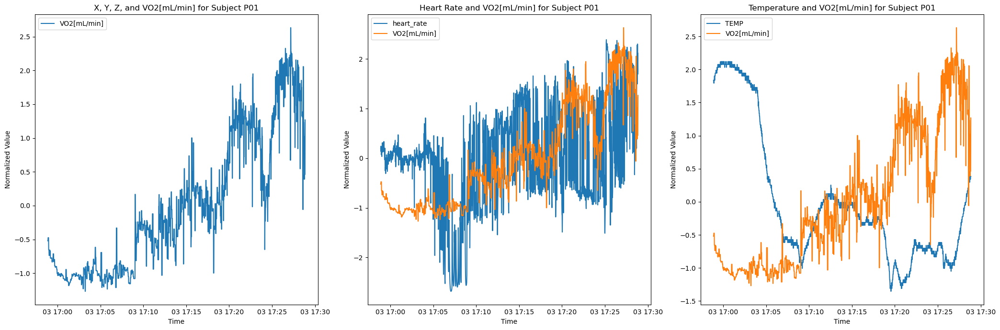

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1799,1.799000e+03,1.799000e+03,1.799000e+03,1799.000000
mean,2021-12-03 17:13:52.000000256,9.479169e-17,2.717362e-15,1.263889e-16,0.000000
min,2021-12-03 16:58:53,-2.681361e+00,-1.353349e+00,-1.267703e+00,-1.730607
25%,2021-12-03 17:06:22.500000,-6.225713e-01,-7.021981e-01,-9.426072e-01,-0.865304
50%,2021-12-03 17:13:52,4.524882e-03,-2.680975e-01,-2.223805e-01,0.000000
75%,2021-12-03 17:21:21.500000,6.388020e-01,1.225930e-01,7.772462e-01,0.865304
max,2021-12-03 17:28:51,2.390439e+00,2.119456e+00,2.632076e+00,1.730607
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:29:58


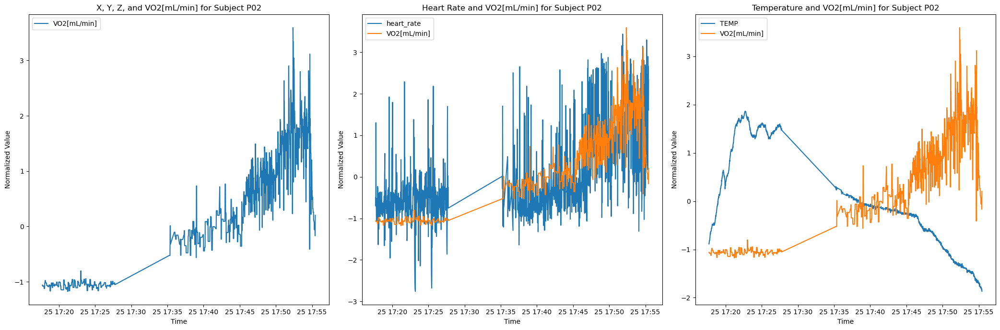

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1753,1.753000e+03,1.753000e+03,1.753000e+03,1753.000000
mean,2021-11-25 17:37:52.538505472,-6.485273e-16,-7.587770e-15,1.297055e-16,0.000000
min,2021-11-25 17:17:43,-2.758655e+00,-1.868067e+00,-1.172734e+00,-1.730569
25%,2021-11-25 17:25:01,-7.030799e-01,-6.248211e-01,-1.027601e+00,-0.865285
50%,2021-11-25 17:40:42,-3.131864e-01,-1.571780e-01,-1.043511e-01,0.000000
75%,2021-11-25 17:48:09,5.878543e-01,6.412370e-01,6.869420e-01,0.865285
max,2021-11-25 17:55:27,3.439391e+00,1.861671e+00,3.592714e+00,1.730569
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:37:44


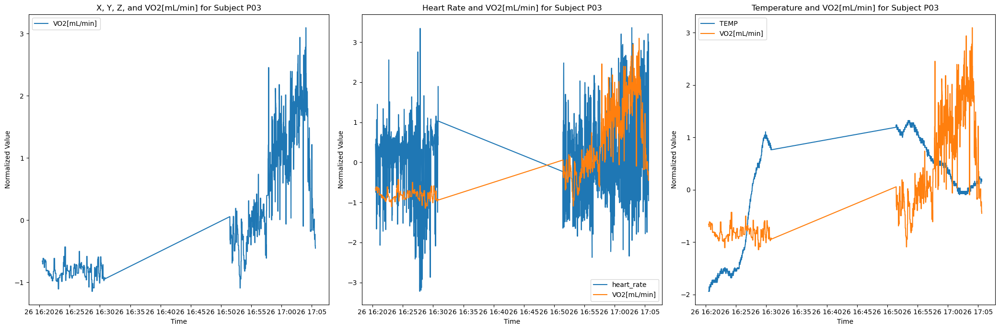

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1474,1.474000e+03,1.474000e+03,1.474000e+03,1474.000000
mean,2021-11-26 16:44:37.938263296,-8.676913e-17,6.941530e-16,3.085124e-16,0.000000
min,2021-11-26 16:20:29,-3.221399e+00,-1.940165e+00,-1.144584e+00,-1.730289
25%,2021-11-26 16:26:37.249999872,-5.962683e-01,-9.527936e-01,-8.136719e-01,-0.865144
50%,2021-11-26 16:53:19.500000,8.216529e-02,2.062946e-01,-3.595284e-01,0.000000
75%,2021-11-26 16:59:27.750000128,5.413552e-01,8.073032e-01,7.097929e-01,0.865144
max,2021-11-26 17:05:36,3.359661e+00,1.322454e+00,3.096010e+00,1.730289
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:45:07


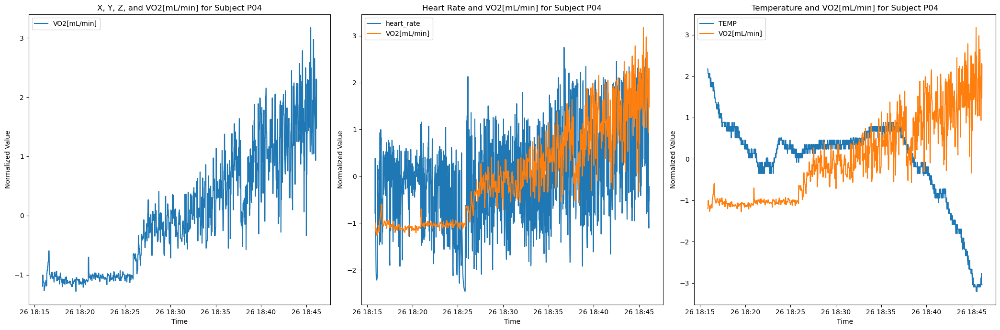

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1817,1.817000e+03,1.817000e+03,1.817000e+03,1817.000000
mean,2021-11-26 18:31:00,6.256843e-17,2.202409e-14,-3.128422e-16,0.000000
min,2021-11-26 18:15:52,-2.460542e+00,-3.199003e+00,-1.278345e+00,-1.730621
25%,2021-11-26 18:23:26,-6.842325e-01,-1.898328e-01,-1.012805e+00,-0.865311
50%,2021-11-26 18:31:00,-1.906474e-02,2.400487e-01,-1.338830e-01,0.000000
75%,2021-11-26 18:38:34,6.173455e-01,5.087246e-01,7.036846e-01,0.865311
max,2021-11-26 18:46:08,2.749701e+00,2.174515e+00,3.171632e+00,1.730621
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:30:16


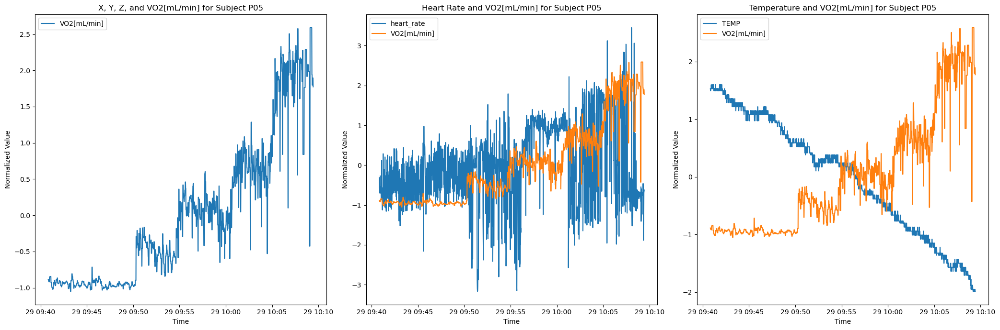

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1717,1.717000e+03,1.717000e+03,1.717000e+03,1717.000000
mean,2021-11-29 09:55:08.000000256,-1.324250e-16,-3.045774e-15,-1.986375e-16,0.000000
min,2021-11-29 09:40:50,-3.168524e+00,-1.986155e+00,-1.050108e+00,-1.730538
25%,2021-11-29 09:47:59,-6.970718e-01,-8.713941e-01,-9.214955e-01,-0.865269
50%,2021-11-29 09:55:08,-9.948887e-02,1.736945e-01,-2.662804e-01,0.000000
75%,2021-11-29 10:02:17,8.044375e-01,9.400928e-01,5.677833e-01,0.865269
max,2021-11-29 10:09:26,3.451462e+00,1.601982e+00,2.590076e+00,1.730538
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:28:36


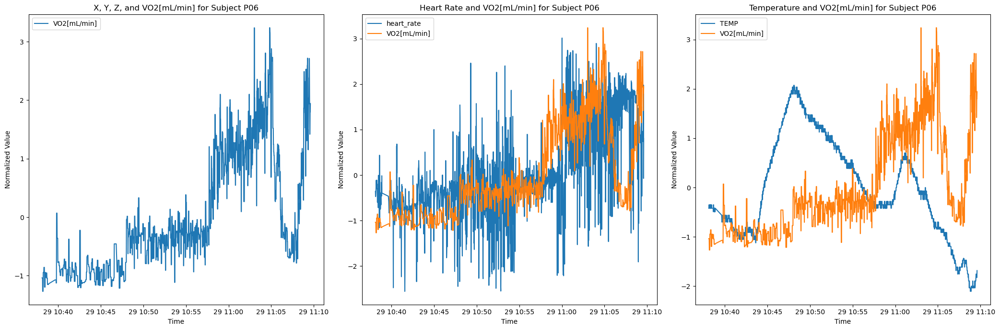

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1846,1.846000e+03,1.846000e+03,1.846000e+03,1.846000e+03
mean,2021-11-29 10:54:12.379740160,-3.079275e-16,-2.155493e-15,1.231710e-16,-6.158550e-17
min,2021-11-29 10:38:07,-2.554348e+00,-2.105000e+00,-1.267510e+00,-1.730644e+00
25%,2021-11-29 10:46:32.249999872,-6.129211e-01,-8.068522e-01,-7.842879e-01,-8.653219e-01
50%,2021-11-29 10:54:13.500000,-2.336228e-01,-1.402358e-01,-2.952281e-01,0.000000e+00
75%,2021-11-29 11:01:54.750000128,5.775122e-01,7.018061e-01,7.483483e-01,8.653219e-01
max,2021-11-29 11:09:36,3.012129e+00,2.070124e+00,3.238984e+00,1.730644e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:31:29


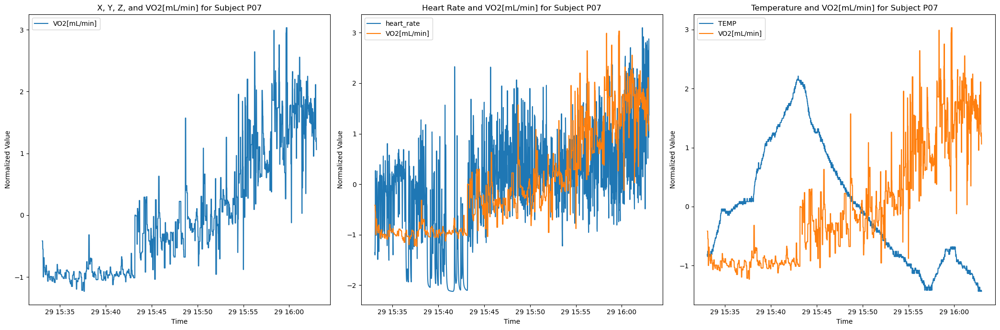

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1794,1.794000e+03,1.794000e+03,1.794000e+03,1794.000000
mean,2021-11-29 15:48:01.499999744,2.851677e-16,-4.182459e-15,-6.337059e-17,0.000000
min,2021-11-29 15:33:05,-2.123494e+00,-1.438017e+00,-1.232677e+00,-1.730603
25%,2021-11-29 15:40:33.249999872,-4.776794e-01,-8.475094e-01,-9.166699e-01,-0.865302
50%,2021-11-29 15:48:01.500000,1.130429e-01,-7.806007e-02,-2.410280e-01,0.000000
75%,2021-11-29 15:55:29.750000128,5.564101e-01,7.450717e-01,6.649453e-01,0.865302
max,2021-11-29 16:02:58,3.100032e+00,2.212394e+00,3.032239e+00,1.730603
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:29:53


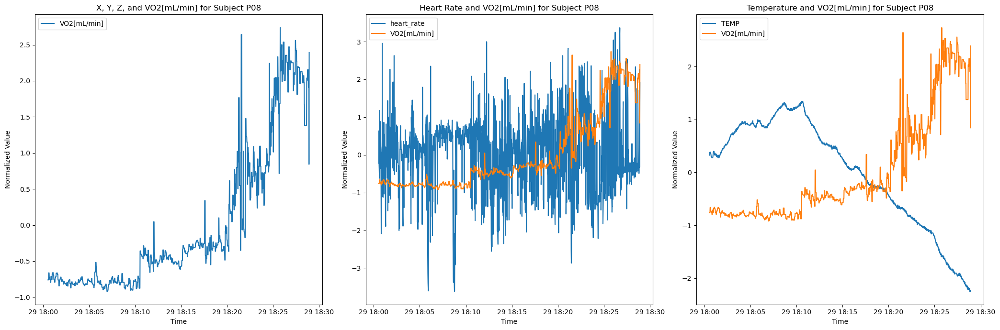

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1703,1.703000e+03,1.703000e+03,1.703000e+03,1703.000000
mean,2021-11-29 18:14:43.999999744,2.899749e-16,9.345953e-16,2.002704e-16,0.000000
min,2021-11-29 18:00:33,-3.618139e+00,-2.248931e+00,-9.192517e-01,-1.730526
25%,2021-11-29 18:07:38.500000,-5.463036e-01,-7.315376e-01,-7.643168e-01,-0.865263
50%,2021-11-29 18:14:44,1.338187e-01,2.768565e-01,-4.075515e-01,0.000000
75%,2021-11-29 18:21:49.500000,5.905779e-01,8.818931e-01,5.475121e-01,0.865263
max,2021-11-29 18:28:55,3.370269e+00,1.342873e+00,2.736216e+00,1.730526
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:28:22


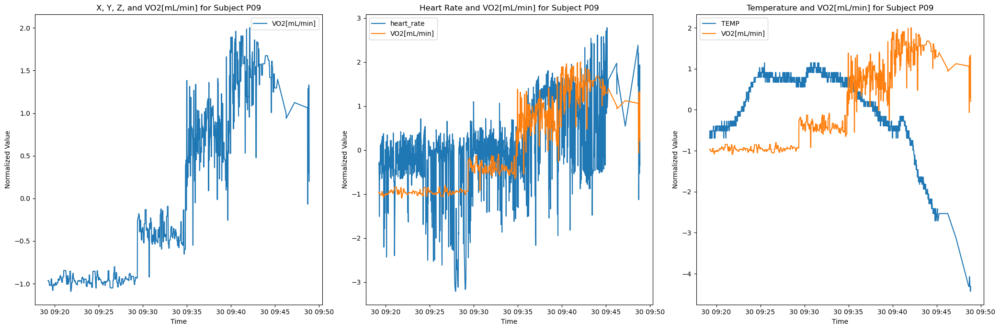

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1582,1.582000e+03,1.582000e+03,1.582000e+03,1.582000e+03
mean,2021-11-30 09:32:26.419721984,-1.077941e-16,-4.599215e-15,-2.155882e-16,7.186273e-17
min,2021-11-30 09:19:14,-3.212073e+00,-4.432381e+00,-1.090096e+00,-1.730409e+00
25%,2021-11-30 09:25:49.249999872,-4.495713e-01,-3.967675e-01,-9.449641e-01,-8.652046e-01
50%,2021-11-30 09:32:24.500000,-2.954847e-02,2.263786e-01,-3.919049e-01,0.000000e+00
75%,2021-11-30 09:38:59.750000128,5.296606e-01,7.901776e-01,9.618836e-01,8.652046e-01
max,2021-11-30 09:48:52,2.782890e+00,1.146261e+00,2.002303e+00,1.730409e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:29:38


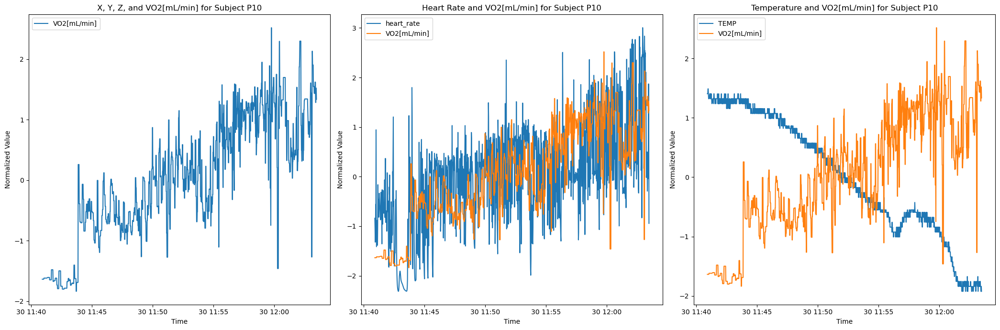

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1353,1.353000e+03,1.353000e+03,1.353000e+03,1.353000e+03
mean,2021-11-30 11:52:12.000000256,-2.940901e-16,-1.848566e-15,3.781159e-16,-1.680515e-16
min,2021-11-30 11:40:56,-2.315172e+00,-1.923587e+00,-1.837984e+00,-1.730131e+00
25%,2021-11-30 11:46:34,-6.227983e-01,-7.583620e-01,-6.919367e-01,-8.650657e-01
50%,2021-11-30 11:52:12,5.544654e-02,-9.288827e-03,-7.049615e-03,0.000000e+00
75%,2021-11-30 11:57:50,5.822927e-01,9.894753e-01,8.207533e-01,8.650657e-01
max,2021-11-30 12:03:28,3.004784e+00,1.488857e+00,2.519109e+00,1.730131e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:22:32


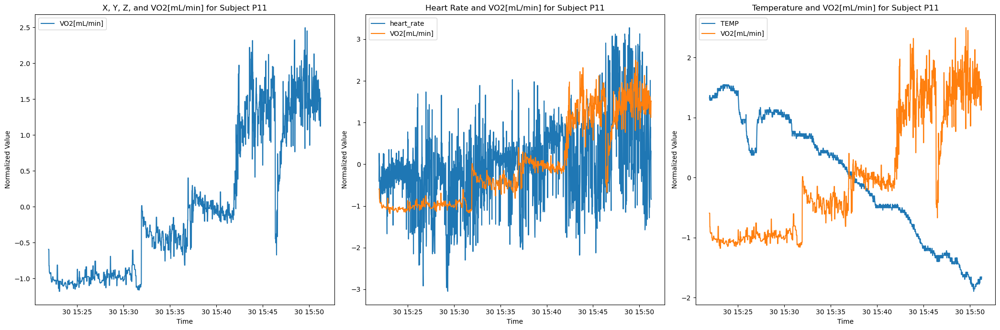

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1762,1.762000e+03,1.762000e+03,1.762000e+03,1.762000e+03
mean,2021-11-30 15:36:35.500000256,6.452147e-17,-5.935976e-15,1.935644e-16,-6.452147e-17
min,2021-11-30 15:21:55,-3.047938e+00,-1.897137e+00,-1.179835e+00,-1.730577e+00
25%,2021-11-30 15:29:15.249999872,-5.808594e-01,-8.227439e-01,-9.466731e-01,-8.652884e-01
50%,2021-11-30 15:36:35.500000,-4.606358e-02,1.720646e-01,-2.441984e-01,0.000000e+00
75%,2021-11-30 15:43:55.750000128,5.248911e-01,9.082229e-01,9.931063e-01,8.652884e-01
max,2021-11-30 15:51:16,3.276112e+00,1.544900e+00,2.495961e+00,1.730577e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:29:21


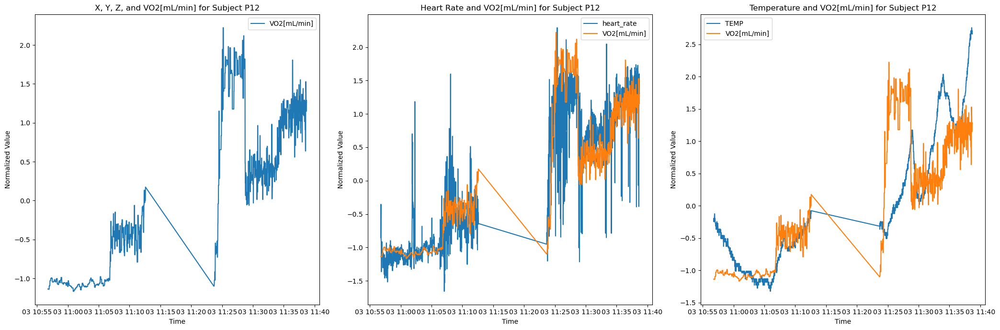

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1853,1.853000e+03,1.853000e+03,1.853000e+03,1.853000e+03
mean,2021-12-03 11:17:35.579060736,-2.454114e-16,-1.349763e-15,1.227057e-16,-6.135285e-17
min,2021-12-03 10:56:46,-1.657799e+00,-1.325579e+00,-1.166077e+00,-1.730649e+00
25%,2021-12-03 11:04:29,-1.002105e+00,-7.971308e-01,-1.034100e+00,-8.653246e-01
50%,2021-12-03 11:12:12,-2.680811e-01,-3.167238e-01,-2.656554e-01,0.000000e+00
75%,2021-12-03 11:30:59,9.738704e-01,7.401716e-01,9.108214e-01,8.653246e-01
max,2021-12-03 11:38:42,2.291278e+00,2.757881e+00,2.222100e+00,1.730649e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:41:56


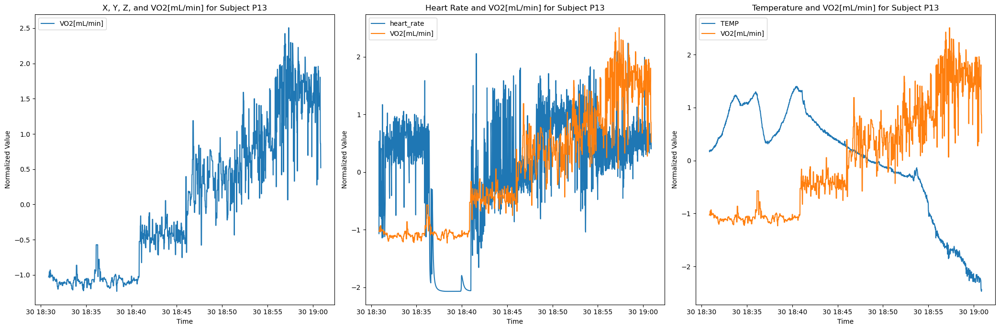

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1802,1802.000000,1.802000e+03,1.802000e+03,1802.000000
mean,2021-11-30 18:45:52.500000,0.000000,-6.372015e-15,-3.154463e-16,0.000000
min,2021-11-30 18:30:52,-2.071021,-2.468546e+00,-1.232299e+00,-1.730610
25%,2021-11-30 18:38:22.249999872,-0.347890,-3.021456e-01,-1.048916e+00,-0.865305
50%,2021-11-30 18:45:52.500000,0.300267,2.311222e-01,-1.934792e-01,0.000000
75%,2021-11-30 18:53:22.750000128,0.677886,7.310607e-01,7.435826e-01,0.865305
max,2021-11-30 19:00:53,2.239277,1.397645e+00,2.506731e+00,1.730610
std,NaN,1.000000,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:30:01


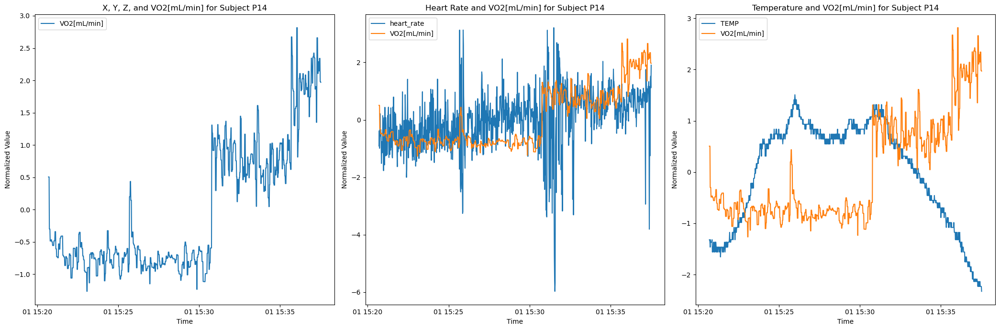

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1010,1.010000e+03,1.010000e+03,1.010000e+03,1.010000e+03
mean,2021-12-01 15:29:06.500000,9.849107e-16,1.401387e-14,1.688418e-16,-5.628061e-17
min,2021-12-01 15:20:42,-5.972116e+00,-2.326634e+00,-1.265417e+00,-1.729480e+00
25%,2021-12-01 15:24:54.249999872,-5.953435e-01,-8.888290e-01,-7.892513e-01,-8.647400e-01
50%,2021-12-01 15:29:06.500000,1.120694e-01,4.531220e-01,-5.931414e-01,0.000000e+00
75%,2021-12-01 15:33:18.750000128,6.330418e-01,8.365366e-01,7.675980e-01,8.647400e-01
max,2021-12-01 15:37:31,3.208678e+00,1.507512e+00,2.815386e+00,1.729480e+00
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Duration: 0 days 00:16:49


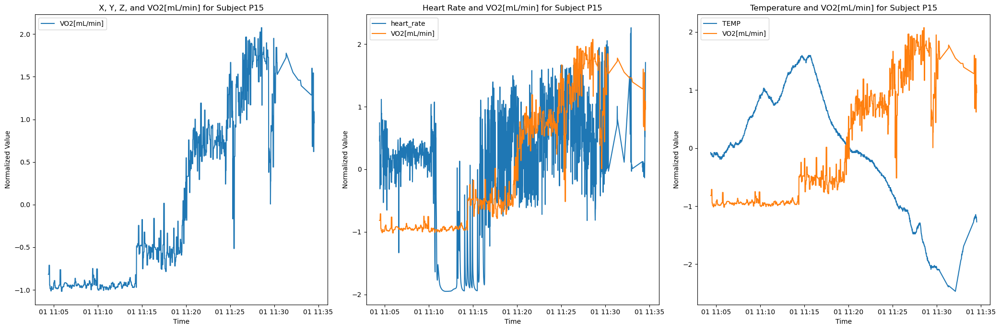

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1604,1.604000e+03,1.604000e+03,1.604000e+03,1604.000000
mean,2021-12-01 11:17:50.231296768,-2.126312e-16,1.559296e-15,-2.126312e-16,0.000000
min,2021-12-01 11:04:24,-1.950056e+00,-2.467782e+00,-1.017568e+00,-1.730432
25%,2021-12-01 11:11:04.750000128,-4.054378e-01,-6.011418e-01,-9.390734e-01,-0.865216
50%,2021-12-01 11:17:45.500000,1.974938e-01,4.051575e-02,-5.001931e-01,0.000000
75%,2021-12-01 11:24:26.249999872,6.856975e-01,8.182824e-01,8.741683e-01,0.865216
max,2021-12-01 11:34:33,2.261923e+00,1.596049e+00,2.074970e+00,1.730432
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:30:09


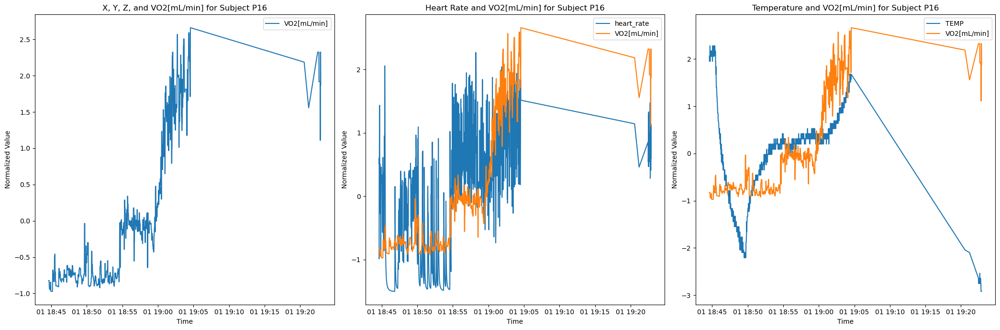

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1227,1.227000e+03,1.227000e+03,1.227000e+03,1227.000000
mean,2021-12-01 18:55:15.160554240,-9.265431e-17,2.483135e-14,-9.265431e-17,0.000000
min,2021-12-01 18:44:37,-1.499355e+00,-2.918777e+00,-9.717135e-01,-1.729934
25%,2021-12-01 18:49:43.500000,-1.033782e+00,-4.575634e-01,-7.784475e-01,-0.864967
50%,2021-12-01 18:54:50,1.834710e-01,1.987604e-01,-3.132499e-01,0.000000
75%,2021-12-01 18:59:56.500000,7.260515e-01,4.175349e-01,2.740160e-01,0.864967
max,2021-12-01 19:22:54,2.270092e+00,2.277119e+00,2.661146e+00,1.729934
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:38:17


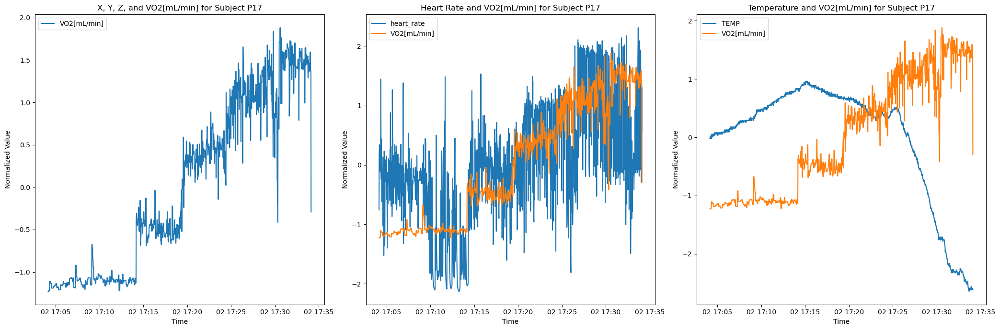

,Time,heart_rate,TEMP,VO2[mL/min],t
count,1799,1.799000e+03,1.799000e+03,1.799000e+03,1799.000000
mean,2021-12-02 17:19:08,1.895834e-16,-9.795142e-16,-1.263889e-16,0.000000
min,2021-12-02 17:04:09,-2.127845e+00,-2.642582e+00,-1.228735e+00,-1.730607
25%,2021-12-02 17:11:38.500000,-5.237490e-01,2.992913e-02,-1.080235e+00,-0.865304
50%,2021-12-02 17:19:08,-6.844133e-02,3.731874e-01,-2.400035e-01,0.000000
75%,2021-12-02 17:26:37.500000,6.977446e-01,6.674088e-01,9.884387e-01,0.865304
max,2021-12-02 17:34:07,2.310558e+00,9.616301e-01,1.880487e+00,1.730607
std,NaN,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


Duration: 0 days 00:29:58


In [161]:
for subject_id in subject_ids:
    plot_normalized_data(cleaned_data[subject_id], subject_id)

# Drop Temperature

In [162]:
for subject_id in subject_ids:
    cleaned_data[subject_id].drop(columns=['TEMP'], inplace=True)

In [164]:
cleaned_data['P01']

,Time,heart_rate,VO2[mL/kg/min],VO2[mL/min],t
0,2021-12-03 16:58:53,94.690403,6.81,470.17,0
1,2021-12-03 16:58:54,92.744725,6.81,470.17,1
2,2021-12-03 16:58:55,95.996020,7.12,491.33,2
3,2021-12-03 16:58:56,95.313119,7.12,491.33,3
4,2021-12-03 16:58:57,90.710056,7.12,491.33,4
...,...,...,...,...,...
1794,2021-12-03 17:28:47,134.920374,13.34,920.33,1794
1795,2021-12-03 17:28:48,159.813979,13.34,920.33,1795
1796,2021-12-03 17:28:49,140.897191,13.34,920.33,1796
1797,2021-12-03 17:28:50,154.094574,13.34,920.33,1797


# Join demographic features

## Prep demographics

In [165]:
demographics_df

,Participant,BMI,Fat,Muscle,Water,Bone,Weight,Height,Gender,Age,Comments
0,P01,24.7,33,14,49,4,70.6,166,F,29,NaN
1,P02,25.7,20,15,54,4,77.0,173,M,26,NaN
2,P03,20.6,23,16,57,5,61.0,172,F,26,NaN
3,P04,26.6,17,15,53,4,81.5,175,M,27,NaN
4,P05,24.8,31,14,48,4,66.0,163,F,33,NaN
5,P06,30.8,32,14,50,4,99.7,180,M,40,NaN
6,P07,25.8,18,14,50,4,71.0,166,M,34,NaN
7,P08,26.4,22,14,48,4,85.6,180,M,33,NaN
8,P09,26.4,19,14,49,4,76.0,177,M,27,NaN
9,P10,27.8,24,14,51,4,87.0,177,M,41,NaN


In [166]:
demo_small_df = demographics_df.copy()[[
    'Participant',
    'Weight', # kg
    'Height', # cm
    'Gender',
    'Age'
]]

demo_small_df['Gender'] = demo_small_df['Gender'].map({'F': 0, 'M': 1})

demo_small_df

,Participant,Weight,Height,Gender,Age
0,P01,70.6,166,0,29
1,P02,77.0,173,1,26
2,P03,61.0,172,0,26
3,P04,81.5,175,1,27
4,P05,66.0,163,0,33
5,P06,99.7,180,1,40
6,P07,71.0,166,1,34
7,P08,85.6,180,1,33
8,P09,76.0,177,1,27
9,P10,87.0,177,1,41


### Normalized demographics (skip)

In [167]:
def normalize_demo(df):
    df = df.copy()
    
    for column in df.columns:
        if column in ['Participant', 'Gender']:
            continue    
        df[column] = (df[column] - df[column].mean()) / df[column].std()

    return df

In [168]:
demo_normalized_df = normalize_demo(demo_small_df)
demo_normalized_df

,Participant,Weight,Height,Gender,Age
0,P01,-0.194918,-0.890066,0,-0.214243
1,P02,0.355914,0.118676,1,-0.760561
2,P03,-1.021166,-0.025430,0,-0.760561
3,P04,0.743218,0.406887,1,-0.578455
4,P05,-0.590828,-1.322384,0,0.514182
5,P06,2.309647,1.127417,1,1.788925
6,P07,-0.160491,-0.890066,1,0.696288
7,P08,1.096095,1.127417,1,0.514182
8,P09,0.269847,0.695099,1,-0.578455
9,P10,1.216590,0.695099,1,1.971031


## Join demographics

In [169]:
for subject_id in subject_ids:
    demo_row = demo_small_df[demo_small_df['Participant'] == subject_id]
    if not demo_row.empty:
        cleaned_data[subject_id]['Weight'] = demo_row['Weight'].values[0]
        cleaned_data[subject_id]['Height'] = demo_row['Height'].values[0]
        cleaned_data[subject_id]['Gender'] = demo_row['Gender'].values[0]
        cleaned_data[subject_id]['Age'] = demo_row['Age'].values[0]

In [170]:
cleaned_data['P01']

,Time,heart_rate,VO2[mL/kg/min],VO2[mL/min],t,Weight,Height,Gender,Age
0,2021-12-03 16:58:53,94.690403,6.81,470.17,0,70.6,166,0,29
1,2021-12-03 16:58:54,92.744725,6.81,470.17,1,70.6,166,0,29
2,2021-12-03 16:58:55,95.996020,7.12,491.33,2,70.6,166,0,29
3,2021-12-03 16:58:56,95.313119,7.12,491.33,3,70.6,166,0,29
4,2021-12-03 16:58:57,90.710056,7.12,491.33,4,70.6,166,0,29
...,...,...,...,...,...,...,...,...,...
1794,2021-12-03 17:28:47,134.920374,13.34,920.33,1794,70.6,166,0,29
1795,2021-12-03 17:28:48,159.813979,13.34,920.33,1795,70.6,166,0,29
1796,2021-12-03 17:28:49,140.897191,13.34,920.33,1796,70.6,166,0,29
1797,2021-12-03 17:28:50,154.094574,13.34,920.33,1797,70.6,166,0,29


In [171]:
cleaned_data['P02']

,Time,heart_rate,VO2[mL/kg/min],VO2[mL/min],t,Weight,Height,Gender,Age
0,2021-11-25 17:17:43,64.765699,2.52,188.67,0,77.0,173,1,26
1,2021-11-25 17:17:44,59.656709,2.52,188.67,1,77.0,173,1,26
2,2021-11-25 17:17:45,110.264730,2.52,188.67,2,77.0,173,1,26
3,2021-11-25 17:17:46,84.384969,2.52,188.67,3,77.0,173,1,26
4,2021-11-25 17:17:47,60.196520,2.34,175.33,4,77.0,173,1,26
...,...,...,...,...,...,...,...,...,...
1748,2021-11-25 17:55:23,130.179259,12.77,957.67,1748,77.0,173,1,26
1749,2021-11-25 17:55:24,144.485839,12.77,957.67,1749,77.0,173,1,26
1750,2021-11-25 17:55:25,120.541918,10.81,810.50,1750,77.0,173,1,26
1751,2021-11-25 17:55:26,117.798884,10.81,810.50,1751,77.0,173,1,26


# Join full dataset together
- Merge 1 Hz data together
    - Keep accelerometer data at 32 Hz

In [172]:
# Initialize an empty list to store the dataframes
merged_data = []

# Iterate over each subject_id and corresponding dataframe in cleaned_data
for subject_id, df in cleaned_data.items():
    # Add a new column to identify the subject_id
    df['subject_id'] = subject_id
    # Append the dataframe to the list
    merged_data.append(df)

# Concatenate all dataframes in the list into a single dataframe
final_merged_df = pd.concat(merged_data, ignore_index=True)

# Display the merged dataframe
final_merged_df

,Time,heart_rate,VO2[mL/kg/min],VO2[mL/min],t,Weight,Height,Gender,Age,subject_id
0,2021-12-03 16:58:53,94.690403,6.81,470.17,0,70.6,166,0,29,P01
1,2021-12-03 16:58:54,92.744725,6.81,470.17,1,70.6,166,0,29,P01
2,2021-12-03 16:58:55,95.996020,7.12,491.33,2,70.6,166,0,29,P01
3,2021-12-03 16:58:56,95.313119,7.12,491.33,3,70.6,166,0,29,P01
4,2021-12-03 16:58:57,90.710056,7.12,491.33,4,70.6,166,0,29,P01
...,...,...,...,...,...,...,...,...,...,...
27890,2021-12-02 17:34:03,75.463083,29.63,2287.33,1794,77.2,175,1,33,P17
27891,2021-12-02 17:34:04,77.541560,28.16,2174.17,1795,77.2,175,1,33,P17
27892,2021-12-02 17:34:05,76.800000,28.16,2174.17,1796,77.2,175,1,33,P17
27893,2021-12-02 17:34:06,126.901198,28.16,2174.17,1797,77.2,175,1,33,P17


## Add Energy Expenditure

In [ ]:
final_merged_df['EE[kcal/min]'] = 4.934*final_merged_df['VO2[mL/min]'] # actually in cal/min
final_merged_df['EE[kcal/kg/min]'] = 4.934*final_merged_df['VO2[mL/kg/min]']
final_merged_df

,Time,heart_rate,VO2[mL/kg/min],VO2[mL/min],t,Weight,Height,Gender,Age,subject_id,EE[kcal/min],EE[kcal/kg/min]
0,2021-12-03 16:58:53,94.690403,6.81,470.17,0,70.6,166,0,29,P01,2319.81878,33.60054
1,2021-12-03 16:58:54,92.744725,6.81,470.17,1,70.6,166,0,29,P01,2319.81878,33.60054
2,2021-12-03 16:58:55,95.996020,7.12,491.33,2,70.6,166,0,29,P01,2424.22222,35.13008
3,2021-12-03 16:58:56,95.313119,7.12,491.33,3,70.6,166,0,29,P01,2424.22222,35.13008
4,2021-12-03 16:58:57,90.710056,7.12,491.33,4,70.6,166,0,29,P01,2424.22222,35.13008
...,...,...,...,...,...,...,...,...,...,...,...,...
27890,2021-12-02 17:34:03,75.463083,29.63,2287.33,1794,77.2,175,1,33,P17,11285.68622,146.19442
27891,2021-12-02 17:34:04,77.541560,28.16,2174.17,1795,77.2,175,1,33,P17,10727.35478,138.94144
27892,2021-12-02 17:34:05,76.800000,28.16,2174.17,1796,77.2,175,1,33,P17,10727.35478,138.94144
27893,2021-12-02 17:34:06,126.901198,28.16,2174.17,1797,77.2,175,1,33,P17,10727.35478,138.94144


## Export

In [174]:
final_export_path = f'{weee_dataset_path}/processed/merged_weee_dataset.csv'
final_merged_df.to_csv(final_export_path, index=False)

### Filter and export raw acceleration data

In [182]:
raw_acc_data = []
for subject_id in subject_ids:
    acc_path = f'{weee_dataset_path}/{subject_id}/E4/ACC.csv'
    acc_df = load_acc_csv(acc_path)
    acc_df['subject_id'] = subject_id
    raw_acc_data.append(acc_df)

# Concatenate all dataframes into a single dataframe
raw_acc_df = pd.concat(raw_acc_data, ignore_index=True)
raw_acc_df

,X,Y,Z,Time,subject_id
0,20.0,0.0,60.0,2021-12-03 16:57:44.000000,P01
1,19.0,0.0,59.0,2021-12-03 16:57:44.031250,P01
2,19.0,1.0,61.0,2021-12-03 16:57:44.062500,P01
3,20.0,1.0,60.0,2021-12-03 16:57:44.093750,P01
4,20.0,0.0,60.0,2021-12-03 16:57:44.125000,P01
...,...,...,...,...,...
1895503,-42.0,35.0,-33.0,2021-12-02 17:43:02.968750,P17
1895504,-42.0,36.0,-32.0,2021-12-02 17:43:03.000000,P17
1895505,-43.0,37.0,-32.0,2021-12-02 17:43:03.031250,P17
1895506,-44.0,36.0,-33.0,2021-12-02 17:43:03.062500,P17


In [183]:
raw_acc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1895508 entries, 0 to 1895507
Data columns (total 5 columns):
 #   Column      Dtype         
---  ------      -----         
 0   X           float64       
 1   Y           float64       
 2   Z           float64       
 3   Time        datetime64[ns]
 4   subject_id  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 72.3+ MB


In [188]:
# Truncate the 'Time' column to the seconds place in both dataframes
raw_acc_df['Time_truncated'] = raw_acc_df['Time'].dt.floor('s')
final_merged_df['Time_truncated'] = final_merged_df['Time'].dt.floor('s')

# Filter raw_acc_df by keeping only rows where the truncated 'Time' is present in final_merged_df
filtered_acc_df = raw_acc_df[raw_acc_df['Time_truncated'].isin(final_merged_df['Time_truncated'])].reset_index(drop=True)

# Drop the temporary 'Time_truncated' column
filtered_acc_df = filtered_acc_df.drop(columns=['Time_truncated'])
final_merged_df = final_merged_df.drop(columns=['Time_truncated'])

filtered_acc_df

,X,Y,Z,Time,subject_id
0,29.0,0.0,56.0,2021-12-03 16:58:53.000000,P01
1,29.0,0.0,56.0,2021-12-03 16:58:53.031250,P01
2,29.0,0.0,55.0,2021-12-03 16:58:53.062500,P01
3,30.0,0.0,56.0,2021-12-03 16:58:53.093750,P01
4,30.0,0.0,56.0,2021-12-03 16:58:53.125000,P01
...,...,...,...,...,...
892635,7.0,-47.0,-9.0,2021-12-02 17:34:07.843750,P17
892636,-24.0,-71.0,-15.0,2021-12-02 17:34:07.875000,P17
892637,-31.0,-63.0,-8.0,2021-12-02 17:34:07.906250,P17
892638,-25.0,-56.0,-7.0,2021-12-02 17:34:07.937500,P17


In [189]:
filtered_acc_path = f'{weee_dataset_path}/processed/filtered_acceleration.csv'
filtered_acc_df.to_csv(filtered_acc_path, index=False)

# Look at correlations & pairplots

In [175]:
def normalize_dataset(df):
    df = df.copy()
    for column in df.columns:
        if column in ['Time', 'subject_id']:
            continue
        df[column] = (df[column] - df[column].mean()) / df[column].std()
    return df

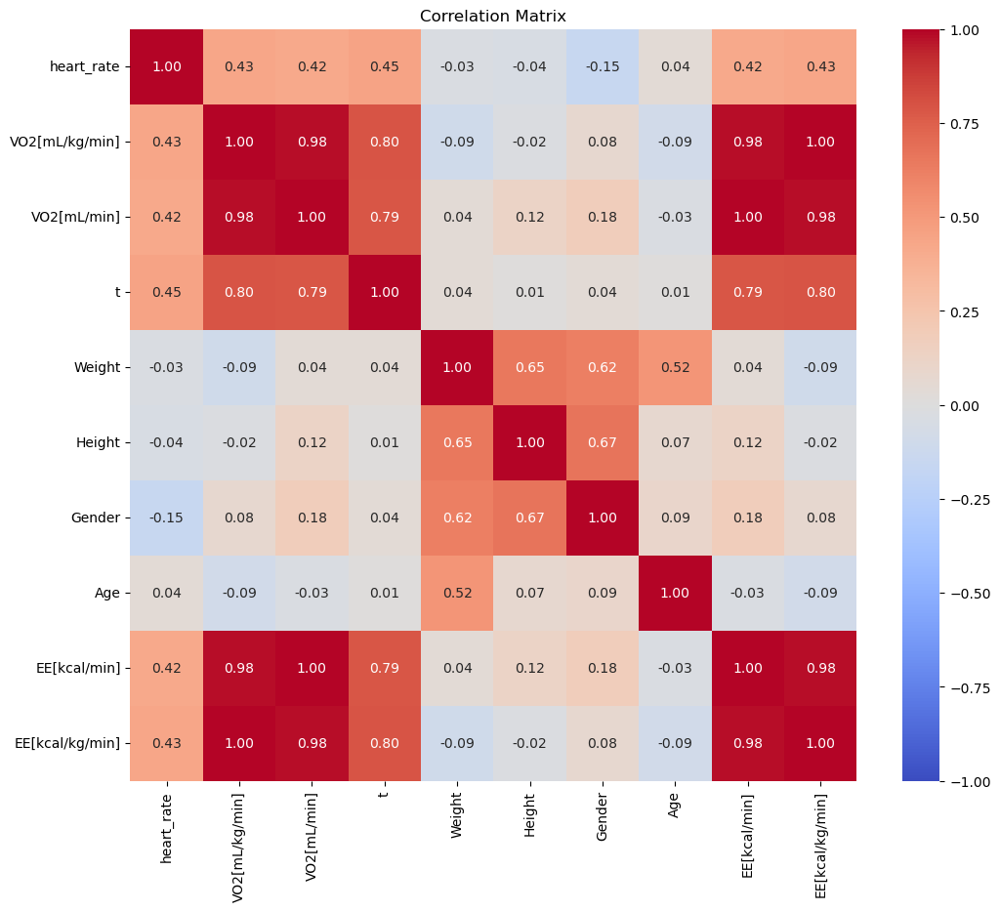

In [176]:
# Drop the 'Time' and 'subject_id' columns
df_corr = normalize_dataset(final_merged_df).drop(columns=['Time', 'subject_id'])

# Compute the correlation matrix
corr_matrix = df_corr.corr()

# Plot the color-coded correlation matrix with custom color scale
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


In [177]:
# Drop the 'Time' and 'subject_id' columns
# df_pairplot = final_merged_df.drop(columns=['Time', 'subject_id'])

# # Create pairplot with KDE
# sns.pairplot(df_pairplot, kind='kde')